# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [2]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % np.round(float((end_time-start_time)/60)))
    print ("--------------------------------------------------")

In [3]:
plotpars = {'axes.labelsize': 18,
            'axes.linewidth': 1.,
            'figure.figsize': (7.,5.),
            'font.size': 12,
            'legend.frameon': True,
            'legend.framealpha': 0.85,
            'legend.edgecolor': 'black',
            'legend.loc': 'best',
            'legend.fontsize': 12,
            'mathtext.fontset': 'stixsans',
            'savefig.bbox': 'tight',
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
           }

# Packages

### General packages

In [4]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [5]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [6]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [7]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [8]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [9]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [10]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [11]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [12]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
degree         = -1       # Additive Legendre polynomial degrees
# degree         = 1        # Additive Legendre polynomial degrees
mdegree        = 150         # Multiplicative Legendre polynomial degrees
regul_err      = 0.013      # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
# wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 6750       # MILES RANGE MAX: 7409
wl_min = 4350               # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

In [13]:
new_path = 'd'+str(degree)+'m'+str(mdegree)

In [14]:
results_path = '../../LargeFilesResults/PSM_analysis/'+ new_path

#### Checking if the directory exists and, if not, creating it!

In [15]:
if not os.path.exists(results_path): os.makedirs(results_path)

### pPXF loop

In [16]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [17]:
mean_age   = ['<logAge>']
mean_metal = ['<[M/H]>']
mass2light = ['MASS2LIGHT_R']
ids        = ['CATAID']
redshifts  = ['Z']
vel_disp   = ['VEL_DISP']

In [18]:
outputs_physical_header = [ids, vel_disp, 'CHI2', 'VELOCITY', mean_age, mean_metal, mass2light]
outputs_physical = []

In [19]:
plt.rcParams.update(plotpars)

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49499      1000     0.300     0.300
 comp.  1:     47387       334
 comp.  2:     46543       342
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1006
method = capfit; Jac calls: 17; Func calls: 2727; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4765       5.2   47387   334
Comp:  2       Unknown          0        17   46543   342
Comp:  2       Unknown          0        19   46543   342
Comp:  2       Unknown      3.443       7.6   46543   342
Comp:  2       Unknown      1.441       3.8   46543   342
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.032
Current $\chi^2$: 0.1006
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


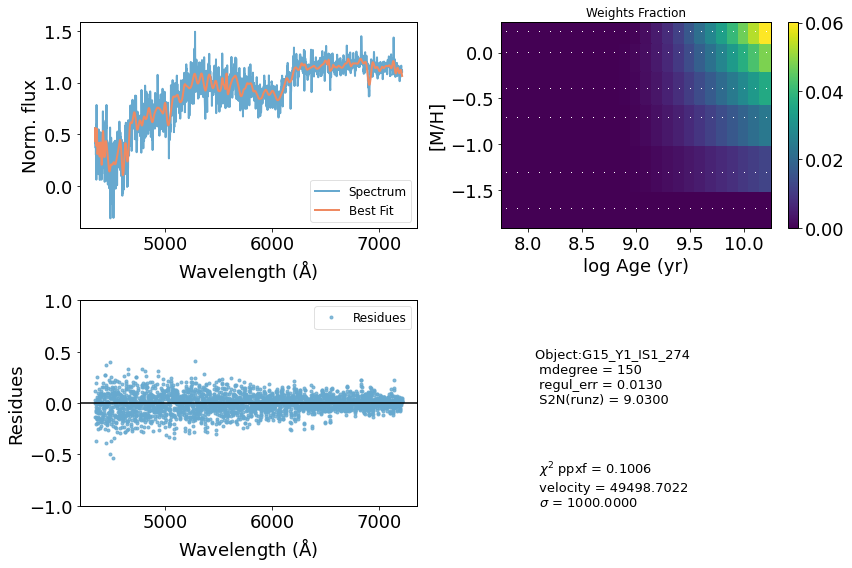

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45877      1000     0.300     0.300
 comp.  1:     44185       330
 comp.  2:     44147       221
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08392
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.7   44185   330
Comp:  2       Unknown          0       4.5   44147   221
Comp:  2       Unknown      1.655       3.5   44147   221
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.913
Current $\chi^2$: 0.0839
Elapsed time in PPXF: 16.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


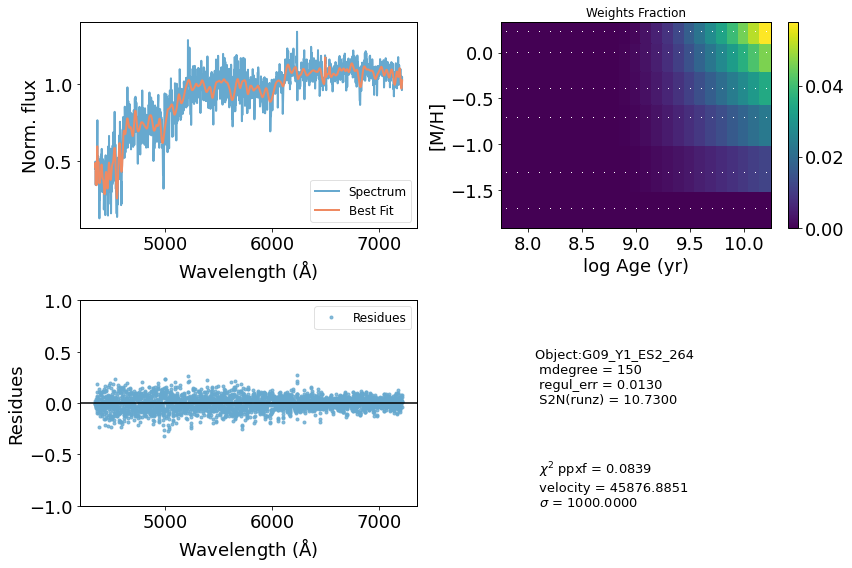

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40061      1000     0.300     0.300
 comp.  1:     37565       583
 comp.  2:     38324       114
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2709
method = capfit; Jac calls: 15; Func calls: 2407; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.723       6.8   37565   583
Comp:  2       Unknown          0       3.4   38324   114
Comp:  2       Unknown     0.3929       2.1   38324   114
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.009
Current $\chi^2$: 0.2709
Elapsed time in PPXF: 16.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


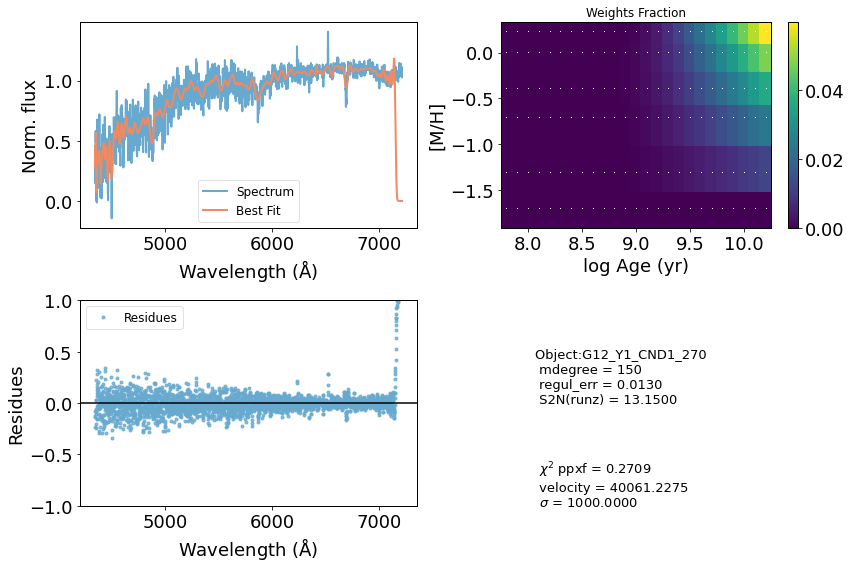

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41147      1000     0.253     0.300
 comp.  1:     39308       222
 comp.  2:     39147       180
Gas Reddening E(B-V): 6.180
chi2/DOF: 0.1847
method = capfit; Jac calls: 30; Func calls: 4806; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8567       2.3   39308   222
Comp:  2       Unknown          0       3.8   39147   180
Comp:  2       Unknown          0       2.8   39147   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.992
Current $\chi^2$: 0.1847
Elapsed time in PPXF: 32.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


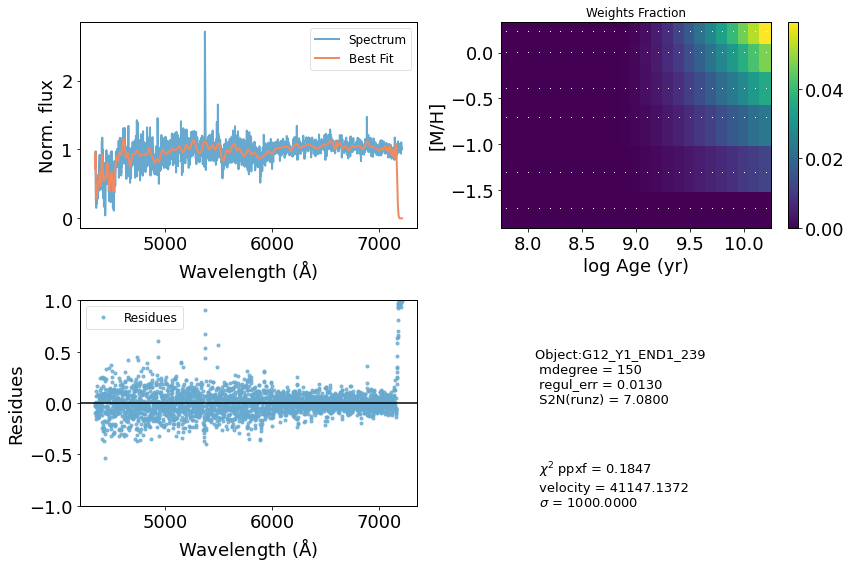

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64973      1000    -0.162     0.172
 comp.  1:     66698       106
 comp.  2:     67191         1
Gas Reddening E(B-V): 3.630
chi2/DOF: 0.006069
method = capfit; Jac calls: 51; Func calls: 8163; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1585       1.7   66698   106
Comp:  2       Unknown     0.5658       2.9   67191     1
Comp:  2       Unknown     0.2883       2.8   67191     1
Comp:  2       Unknown          0         2   67191     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.255
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.255
M/L_r: 2.326
Current $\chi^2$: 0.0061
Elapsed time in PPXF: 55.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


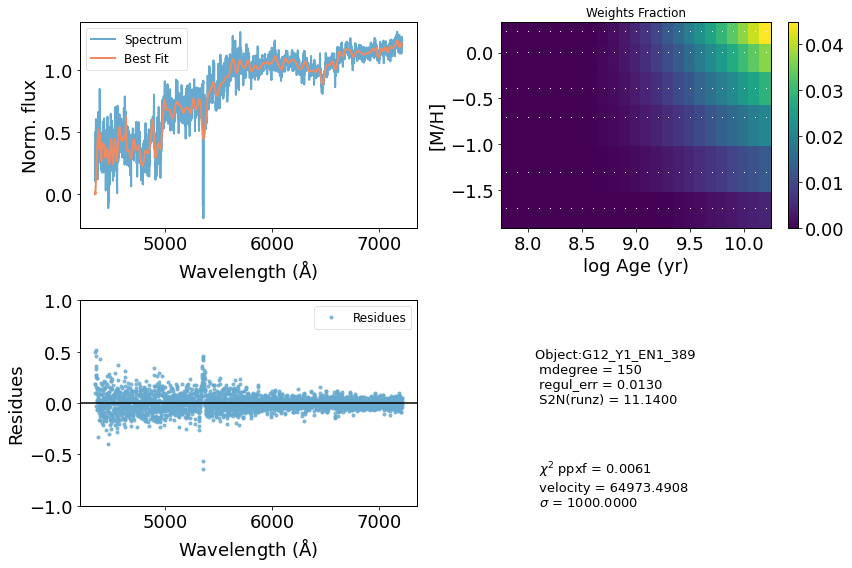

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36804      1000     0.149     0.300
 comp.  1:     35375        96
 comp.  2:     35167        45
Gas Reddening E(B-V): 6.251
chi2/DOF: 0.3119
method = capfit; Jac calls: 29; Func calls: 4646; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7934       1.5   35375    96
Comp:  2       Unknown          0       2.3   35167    45
Comp:  2       Unknown          0       1.5   35167    45
Comp:  2       Unknown     0.5023       1.5   35167    45
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.973
Current $\chi^2$: 0.3119
Elapsed time in PPXF: 31.70 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


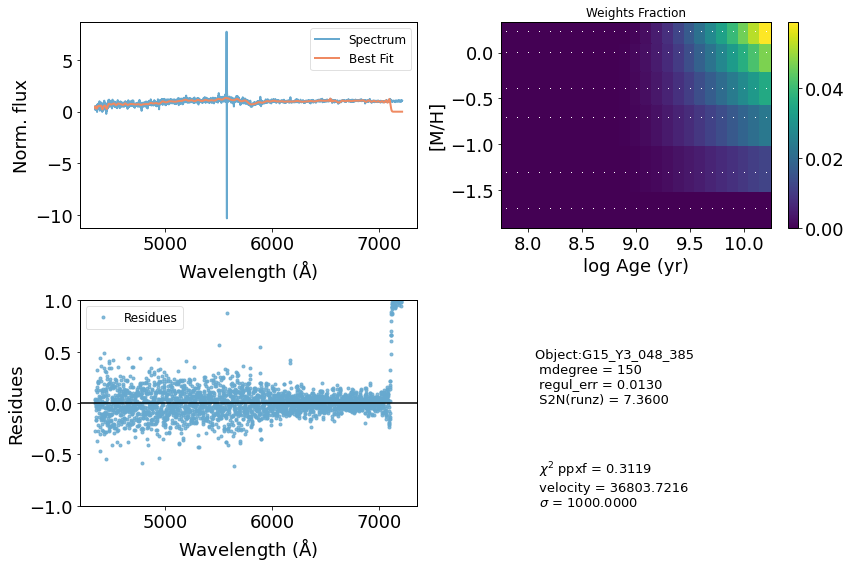

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59122      1000     0.260     0.133
 comp.  1:     58896      1000
 comp.  2:     58586       362
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01629
method = capfit; Jac calls: 8; Func calls: 1285; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      24.51        11   58896  1000
Comp:  2       Unknown          0        17   58586   362
Comp:  2       Unknown          0        17   58586   362
Comp:  2       Unknown      2.463       6.3   58586   362
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.212
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.212
M/L_r: 2.641
Current $\chi^2$: 0.0163
Elapsed time in PPXF: 8.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


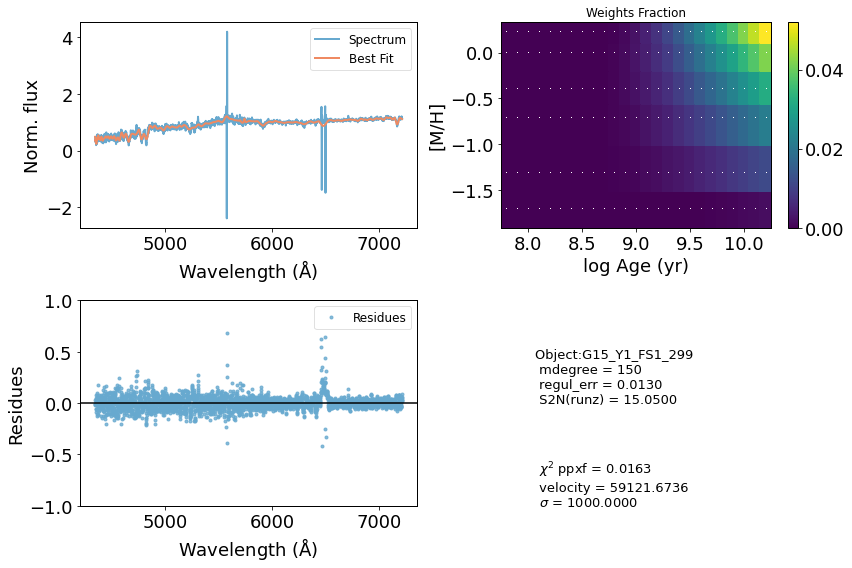

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51584      1000     0.300     0.300
 comp.  1:     49637       275
 comp.  2:     51160      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.08122
method = capfit; Jac calls: 19; Func calls: 3045; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.02328       2.2   49637   275
Comp:  2       Unknown          0   9.6e+02   51160  1000
Comp:  2       Unknown      34.25   9.7e+02   51160  1000
Comp:  2       Unknown          0        10   51160  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.093
Current $\chi^2$: 0.0812
Elapsed time in PPXF: 19.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


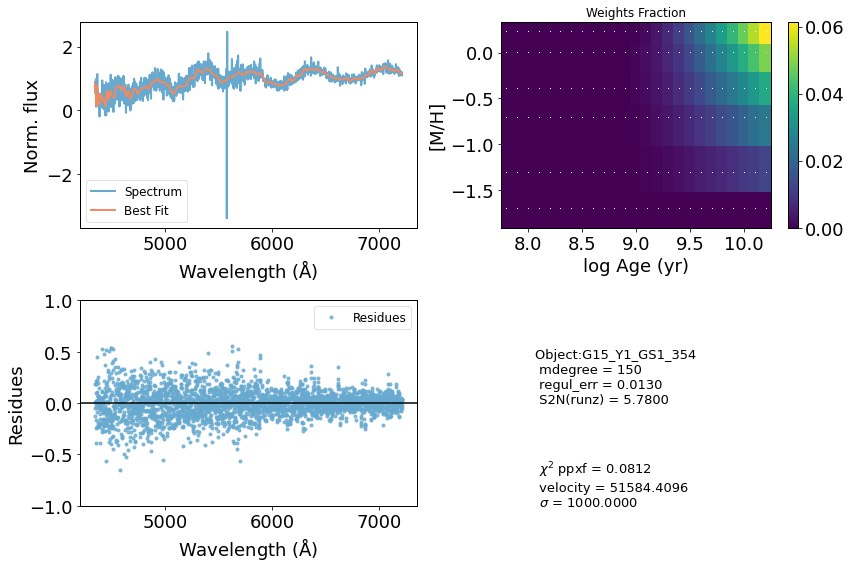

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54927      1000     0.300     0.300
 comp.  1:     53667       523
 comp.  2:     53314       141
Gas Reddening E(B-V): 6.292
chi2/DOF: 0.08746
method = capfit; Jac calls: 25; Func calls: 4004; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.645       2.5   53667   523
Comp:  2       Unknown      3.656       7.5   53314   141
Comp:  2       Unknown          0        11   53314   141
Comp:  2       Unknown     0.7717         5   53314   141
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.141
Current $\chi^2$: 0.0875
Elapsed time in PPXF: 25.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


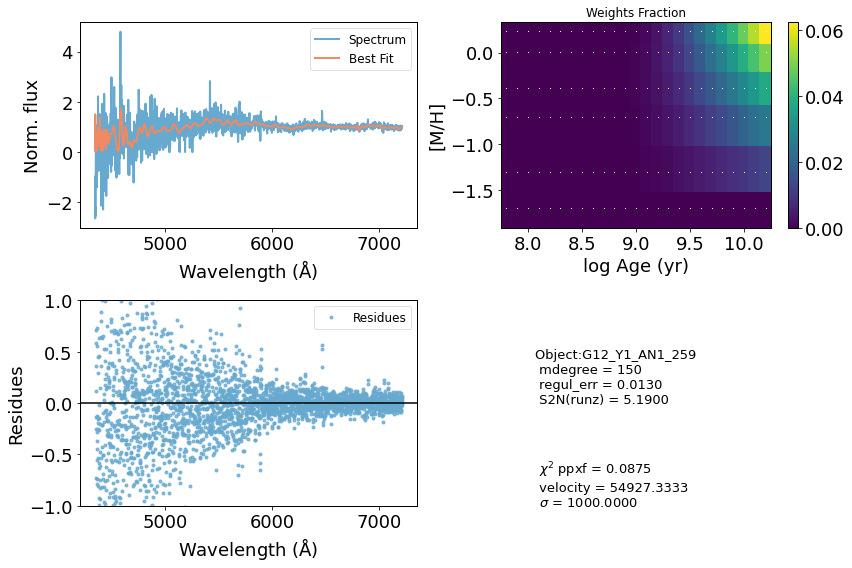

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47427      1000     0.300     0.300
 comp.  1:     45502       198
 comp.  2:     45598       503
Gas Reddening E(B-V): 1.744
chi2/DOF: 0.09381
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   45502   198
Comp:  2       Unknown          0       6.8   45598   503
Comp:  2       Unknown          0         5   45598   503
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.922
Current $\chi^2$: 0.0938
Elapsed time in PPXF: 15.60 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


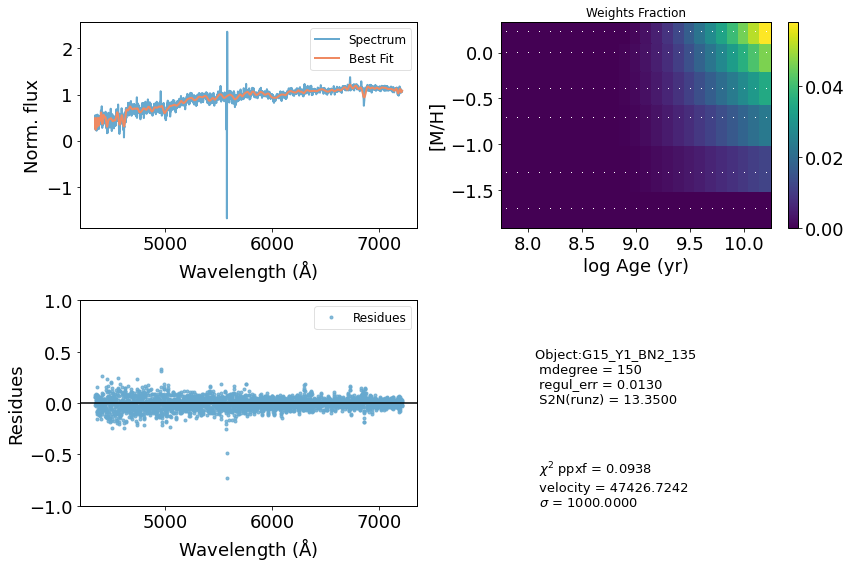

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43506      1000     0.300     0.300
 comp.  1:     41429       192
 comp.  2:     41675       194
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1489
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6065       3.6   41429   192
Comp:  2       Unknown     0.5753       4.6   41675   194
Comp:  2       Unknown          0       2.5   41675   194
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.984
Current $\chi^2$: 0.1489
Elapsed time in PPXF: 18.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


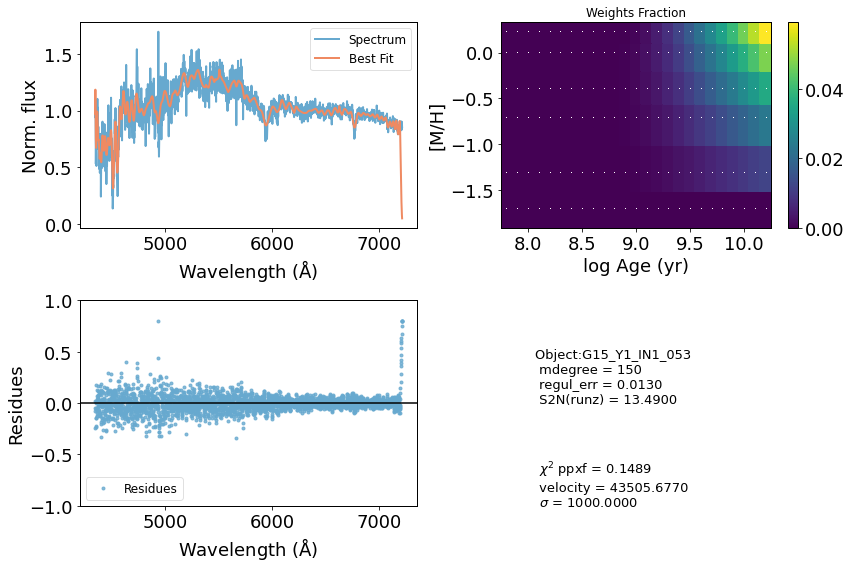

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51488      1000     0.300     0.300
 comp.  1:     50335       281
 comp.  2:     49710       349
Gas Reddening E(B-V): 5.286
chi2/DOF: 0.1175
method = capfit; Jac calls: 18; Func calls: 2885; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.964       2.2   50335   281
Comp:  2       Unknown          0        16   49710   349
Comp:  2       Unknown          0        16   49710   349
Comp:  2       Unknown          0         6   49710   349
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.147
Current $\chi^2$: 0.1175
Elapsed time in PPXF: 17.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


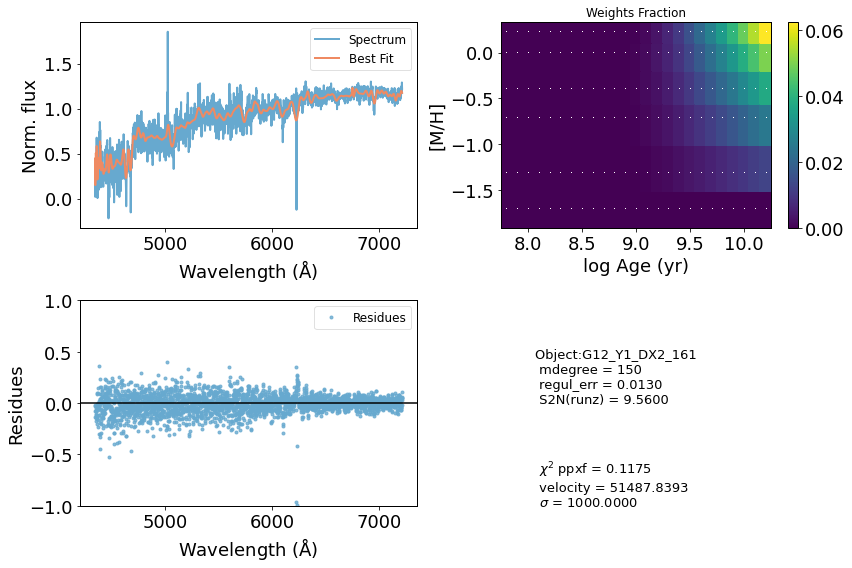

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33810      1000     0.143     0.300
 comp.  1:     32235       503
 comp.  2:     31422       340
Gas Reddening E(B-V): 0.349
chi2/DOF: 0.2208
method = capfit; Jac calls: 24; Func calls: 3843; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0        13   32235   503
Comp:  2       Unknown          0       5.4   31422   340
Comp:  2       Unknown     0.7323       4.6   31422   340
Comp:  2       Unknown          0       8.9   31422   340
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.909
Current $\chi^2$: 0.2208
Elapsed time in PPXF: 24.42 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


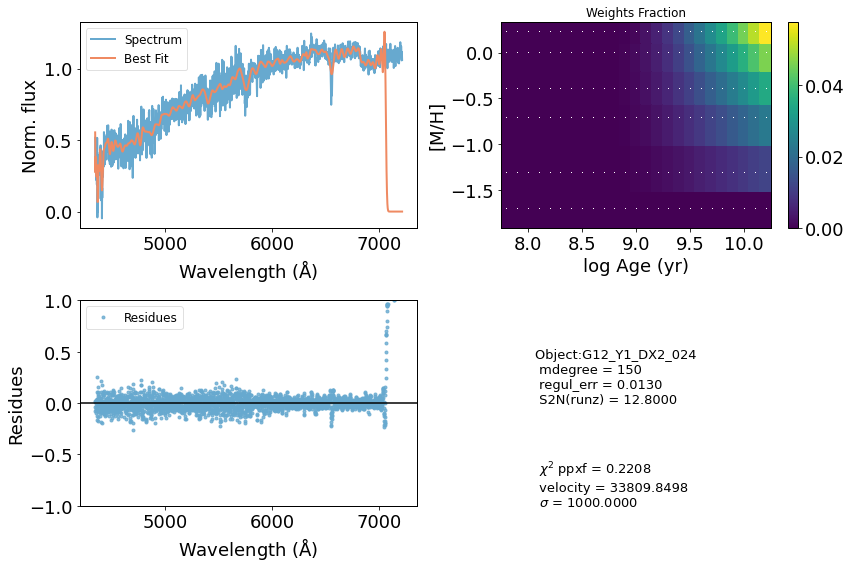

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46231      1000     0.284     0.300
 comp.  1:     44328       414
 comp.  2:     44267       890
Gas Reddening E(B-V): 3.696
chi2/DOF: 0.2022
method = capfit; Jac calls: 22; Func calls: 3525; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         3   44328   414
Comp:  2       Unknown          0       8.6   44267   890
Comp:  2       Unknown      4.694       5.7   44267   890
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.088
Current $\chi^2$: 0.2022
Elapsed time in PPXF: 21.56 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


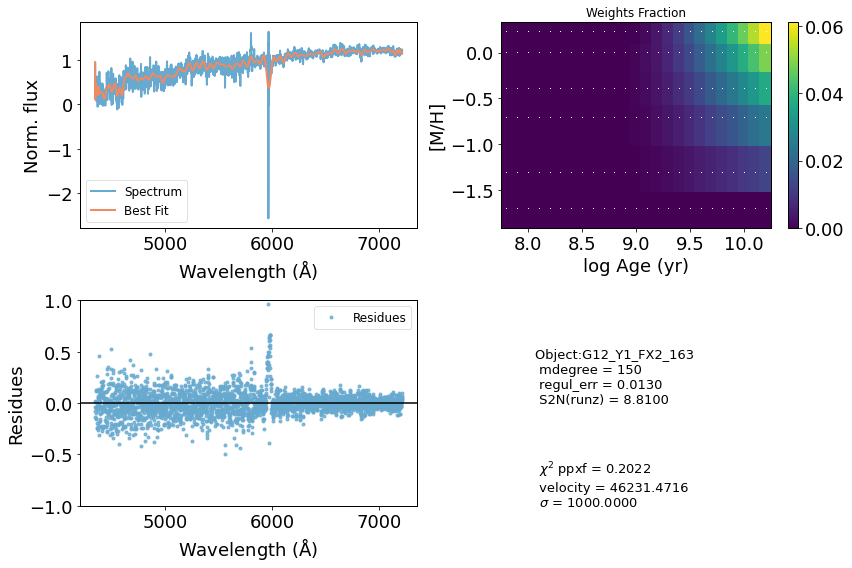

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52791      1000     0.300     0.300
 comp.  1:     50305       114
 comp.  2:     50905       274
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.07467
method = capfit; Jac calls: 15; Func calls: 2407; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6652       3.2   50305   114
Comp:  2       Unknown          0        11   50905   274
Comp:  2       Unknown      11.98        11   50905   274
Comp:  2       Unknown      1.372       5.7   50905   274
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.138
Current $\chi^2$: 0.0747
Elapsed time in PPXF: 14.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


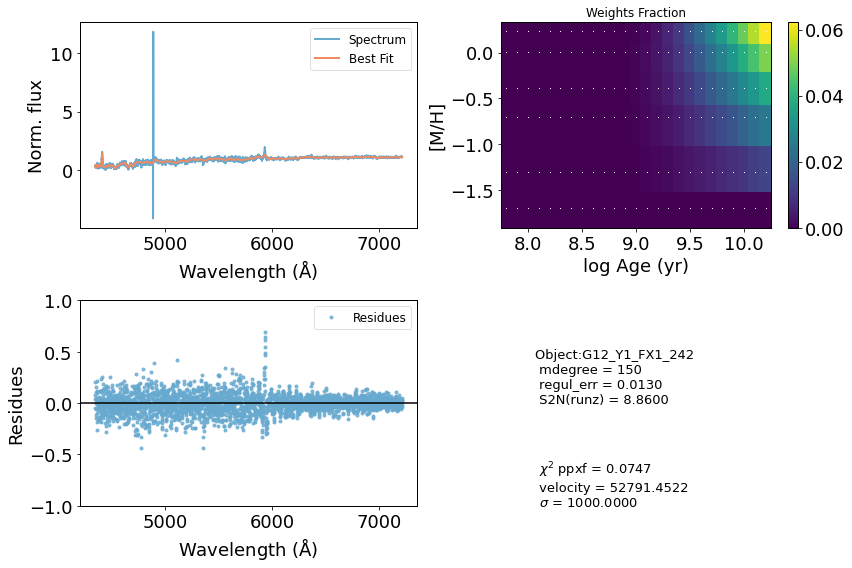

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58467      1000     0.300     0.300
 comp.  1:     56194       185
 comp.  2:     56467       180
Gas Reddening E(B-V): 8.605
chi2/DOF: 0.007955
method = capfit; Jac calls: 10; Func calls: 1603; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5805       2.3   56194   185
Comp:  2       Unknown    0.03082        20   56467   180
Comp:  2       Unknown          0        25   56467   180
Comp:  2       Unknown          0       5.2   56467   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.214
Current $\chi^2$: 0.0080
Elapsed time in PPXF: 9.81 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


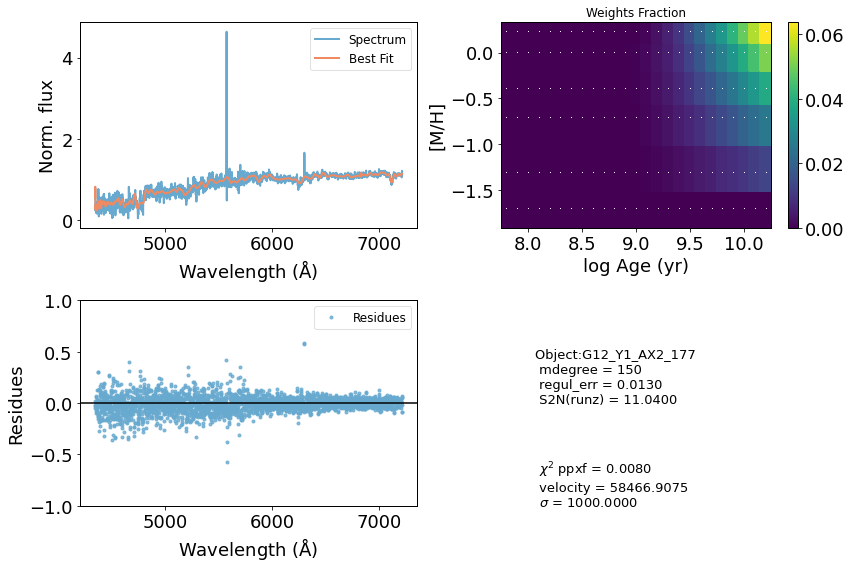

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45923      1000     0.291     0.300
 comp.  1:     44131       113
 comp.  2:     43928        92
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1206
method = capfit; Jac calls: 25; Func calls: 4004; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9501       3.8   44131   113
Comp:  2       Unknown          0       3.7   43928    92
Comp:  2       Unknown     0.8064       2.4   43928    92
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.033
Current $\chi^2$: 0.1206
Elapsed time in PPXF: 25.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


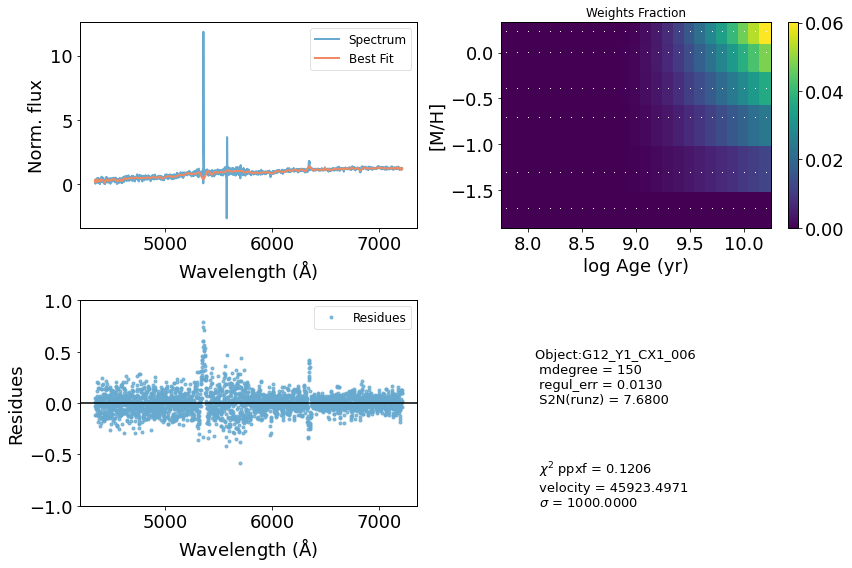

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52910      1000     0.300     0.300
 comp.  1:     50809         1
 comp.  2:     51104       160
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.07128
method = capfit; Jac calls: 14; Func calls: 2244; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.06053       2.2   50809     1
Comp:  2       Unknown          0       5.8   51104   160
Comp:  2       Unknown      1.394       5.9   51104   160
Comp:  2       Unknown       0.26       4.2   51104   160
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.08
Current $\chi^2$: 0.0713
Elapsed time in PPXF: 14.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


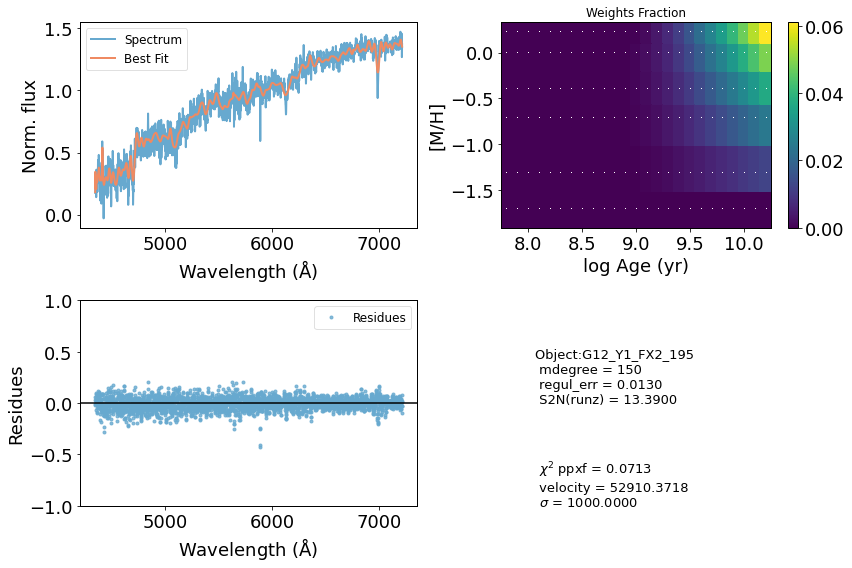

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24519      1000     0.056     0.283
 comp.  1:     22594       325
 comp.  2:     22915       491
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4
method = capfit; Jac calls: 25; Func calls: 4004; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.749       6.4   22594   325
Comp:  2       Unknown     0.2071       4.5   22915   491
Comp:  2       Unknown          0       4.4   22915   491
Comp:  2       Unknown          0       6.4   22915   491
Comp:  2       Unknown          0       4.7   22915   491
Comp:  2       Unknown      2.715       4.6   22915   491
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.203
Weighted <logAge> [yr]: 9.84
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


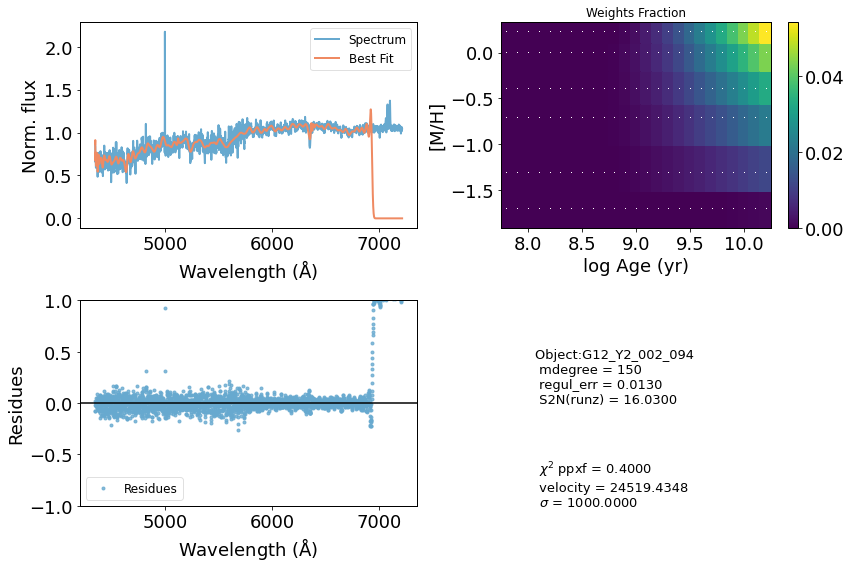

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50245      1000     0.300     0.300
 comp.  1:     48118       322
 comp.  2:     48408       241
Gas Reddening E(B-V): 2.255
chi2/DOF: 0.07908
method = capfit; Jac calls: 19; Func calls: 3045; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9461       3.4   48118   322
Comp:  2       Unknown      1.897       9.4   48408   241
Comp:  2       Unknown     0.7486       9.2   48408   241
Comp:  2       Unknown          0       5.8   48408   241
Comp:  2       Unknown      0.714       3.7   48408   241
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.014
Current $\chi^2$: 0.0791
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


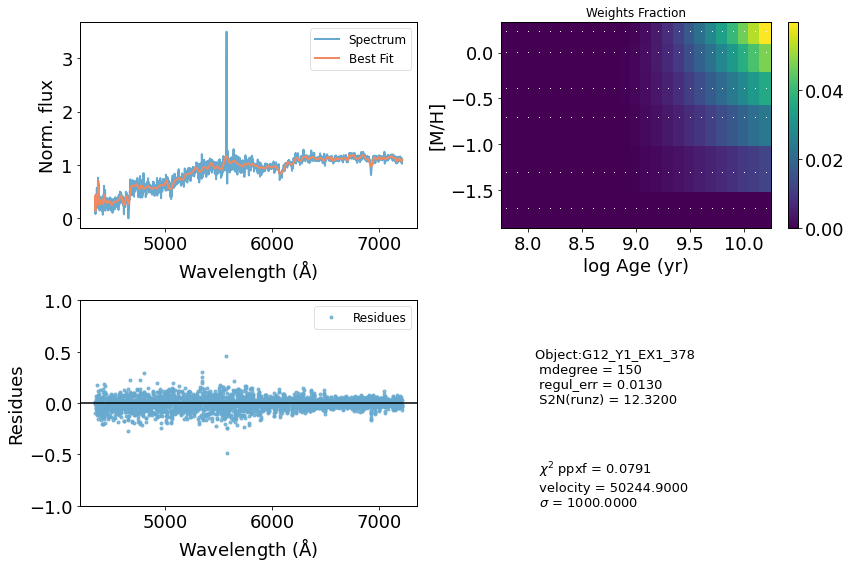

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53065      1000     0.300     0.300
 comp.  1:     51559         4
 comp.  2:     51466      1000
Gas Reddening E(B-V): 4.774
chi2/DOF: 0.05862
method = capfit; Jac calls: 17; Func calls: 2727; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.0748         1   51559     4
Comp:  2       Unknown          0        57   51466  1000
Comp:  2       Unknown          0        57   51466  1000
Comp:  2       Unknown      9.989        10   51466  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.057
Current $\chi^2$: 0.0586
Elapsed time in PPXF: 17.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


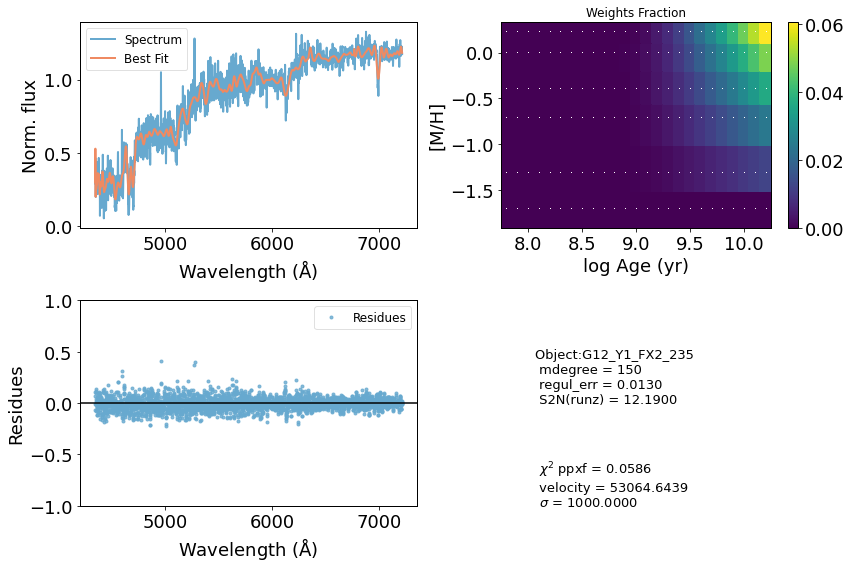

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72946       970    -0.056     0.033
 comp.  1:     72788       454
 comp.  2:     73073       596
Gas Reddening E(B-V): 0.001
chi2/DOF: 0.009438
method = capfit; Jac calls: 10; Func calls: 1606; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.5   72788   454
Comp:  2       Unknown          0        32   73073   596
Comp:  2       Unknown      10.29        32   73073   596
Comp:  2       Unknown     0.5362         6   73073   596
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.287
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.287
M/L_r: 2.3
Current $\chi^2$: 0.0094
Elapsed time in PPXF: 10.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


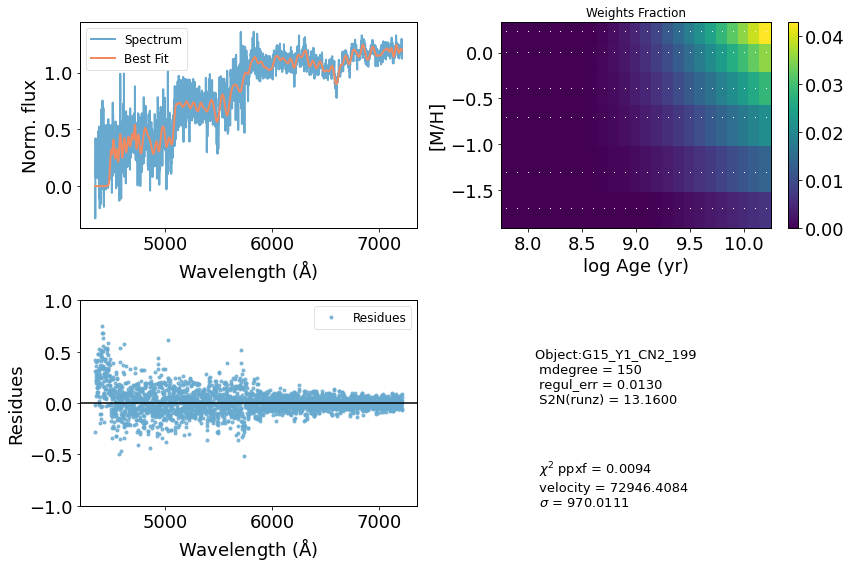

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48325      1000     0.300     0.300
 comp.  1:     46769        53
 comp.  2:     46424         1
Gas Reddening E(B-V): 6.528
chi2/DOF: 0.1156
method = capfit; Jac calls: 17; Func calls: 2729; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.04853       1.2   46769    53
Comp:  2       Unknown    0.01352      0.13   46424     1
Comp:  2       Unknown     0.0222       2.5   46424     1
Comp:  2       Unknown     0.1139       1.3   46424     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.045
Current $\chi^2$: 0.1156
Elapsed time in PPXF: 17.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


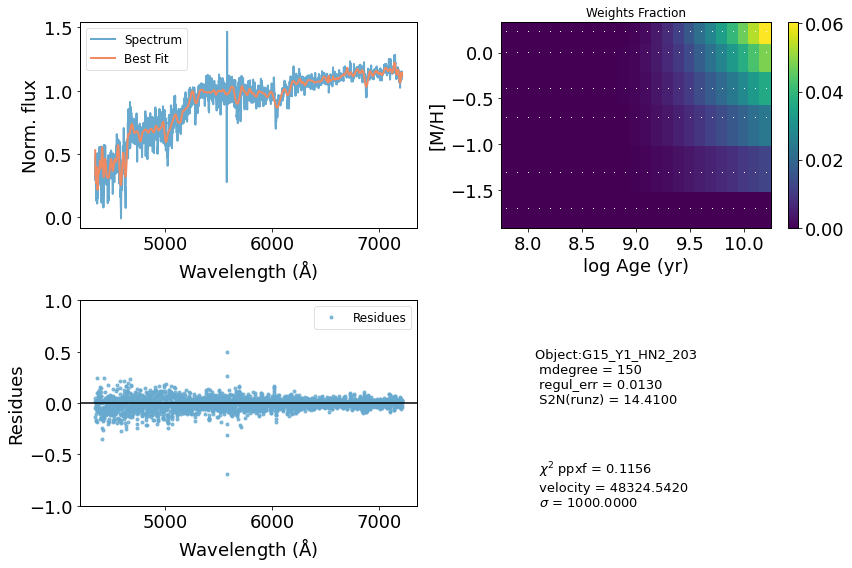

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59992       942     0.050     0.064
 comp.  1:     59402       330
 comp.  2:     60116       334
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009981
method = capfit; Jac calls: 13; Func calls: 2087; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  83 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       2.61         7   59402   330
Comp:  2       Unknown          0        12   60116   334
Comp:  2       Unknown          0        12   60116   334
Comp:  2       Unknown          0       5.9   60116   334
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.26
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.26
M/L_r: 2.157
Current $\chi^2$: 0.0100
Elapsed time in PPXF: 13.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


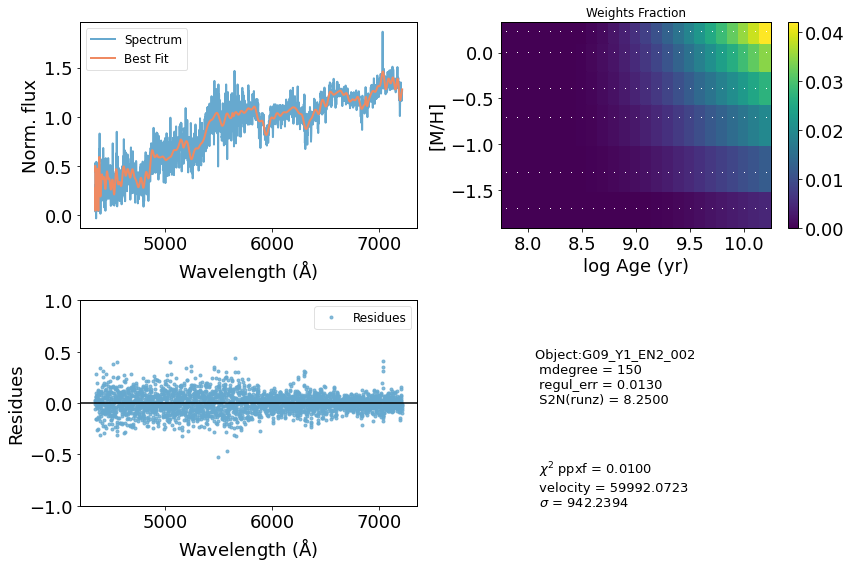

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35153       180     0.000     0.000
 comp.  1:     35153       180
 comp.  2:     35153       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2712
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  56 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.889         4   35153   180
Comp:  2       Unknown     0.5471       3.9   35153   180
Comp:  2       Unknown      0.358       2.8   35153   180
Comp:  2       Unknown      1.604         3   35153   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.197
M/L_r: 3.352
Current $\chi^2$: 0.2712
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


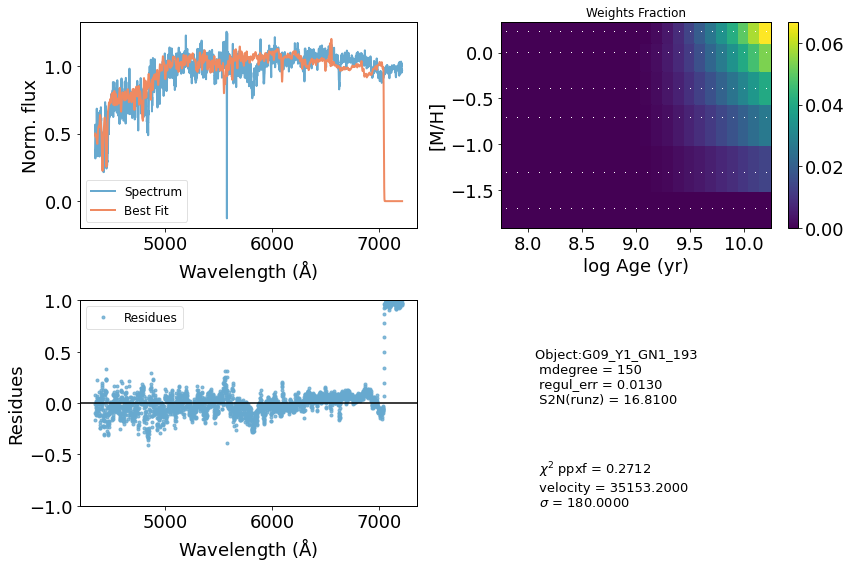

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48222      1000     0.300     0.300
 comp.  1:     46436        43
 comp.  2:     46469        19
Gas Reddening E(B-V): 4.926
chi2/DOF: 0.08445
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2021       1.2   46436    43
Comp:  2       Unknown     0.1875       2.1   46469    19
Comp:  2       Unknown      1.482       3.9   46469    19
Comp:  2       Unknown    0.07153       1.4   46469    19
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.027
Current $\chi^2$: 0.0845
Elapsed time in PPXF: 16.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


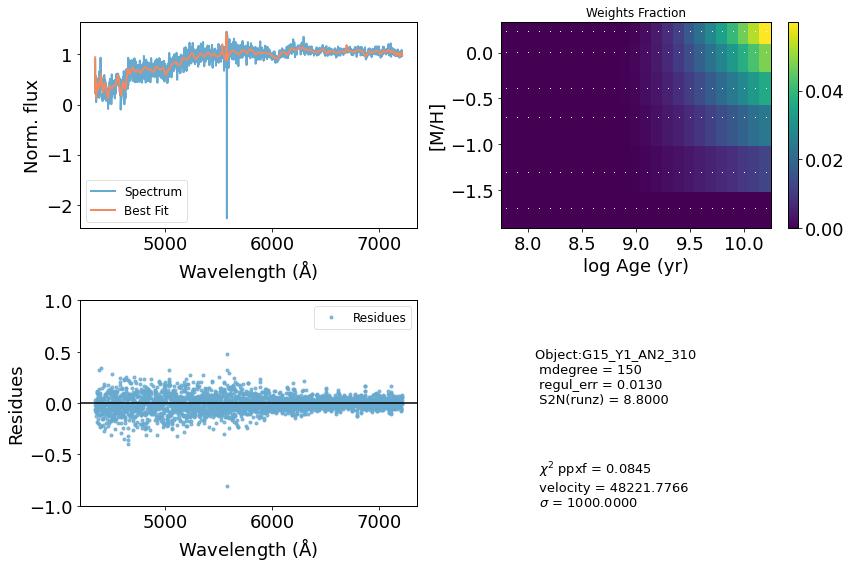

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37283       518     0.000    -0.002
 comp.  1:     36712       831
 comp.  2:     36618        60
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4036
method = capfit; Jac calls: 10; Func calls: 1605; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      20.21       9.9   36712   831
Comp:  2       Unknown      2.022       2.6   36618    60
Comp:  2       Unknown          0       1.9   36618    60
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.196
M/L_r: 2.086
Current $\chi^2$: 0.4036
Elapsed time in PPXF: 10.53 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


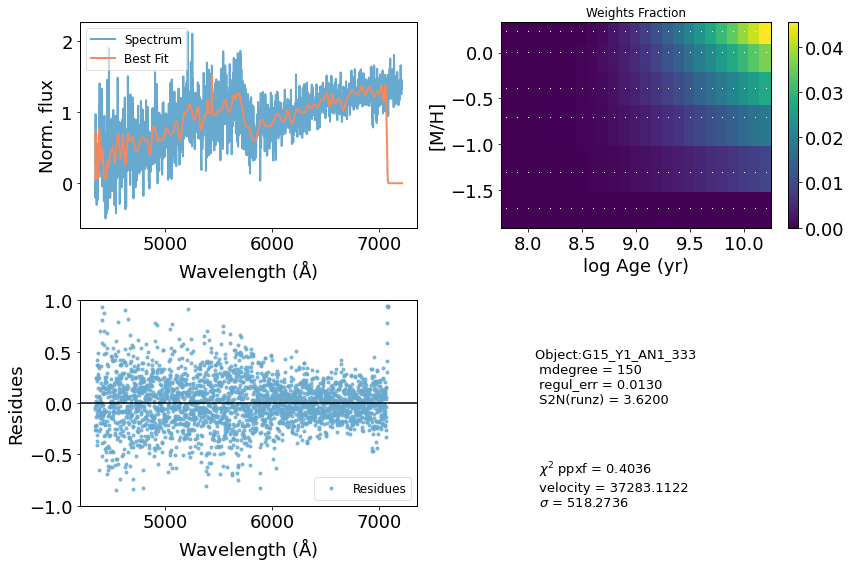

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48019      1000     0.300     0.300
 comp.  1:     47794       546
 comp.  2:     46006         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1116
method = capfit; Jac calls: 29; Func calls: 4643; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.959       7.6   47794   546
Comp:  2       Unknown          0       2.3   46006     1
Comp:  2       Unknown          0       1.5   46006     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.138
Current $\chi^2$: 0.1116
Elapsed time in PPXF: 29.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


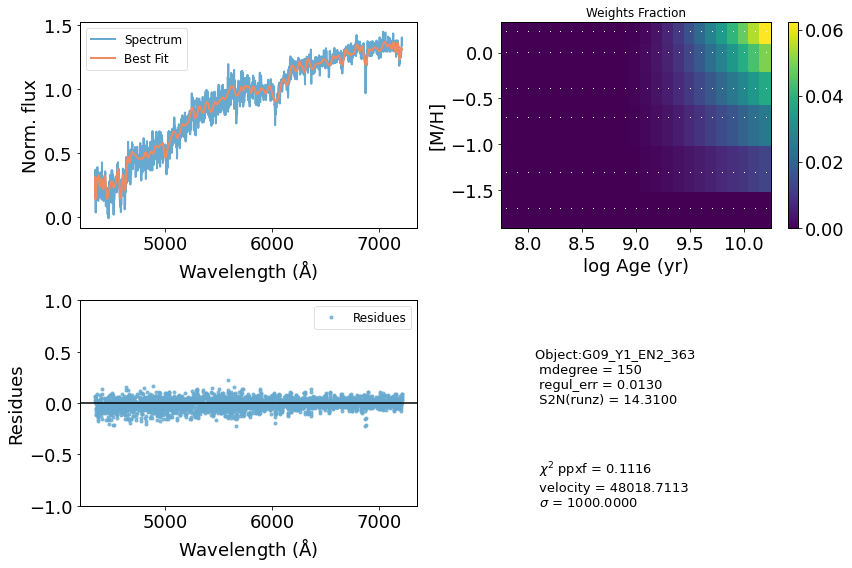

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43258      1000     0.300     0.300
 comp.  1:     41466         1
 comp.  2:     41310       247
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.2186
method = capfit; Jac calls: 18; Func calls: 2884; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1264         2   41466     1
Comp:  2       Unknown          0       4.7   41310   247
Comp:  2       Unknown          0       3.2   41310   247
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.034
Current $\chi^2$: 0.2186
Elapsed time in PPXF: 17.55 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


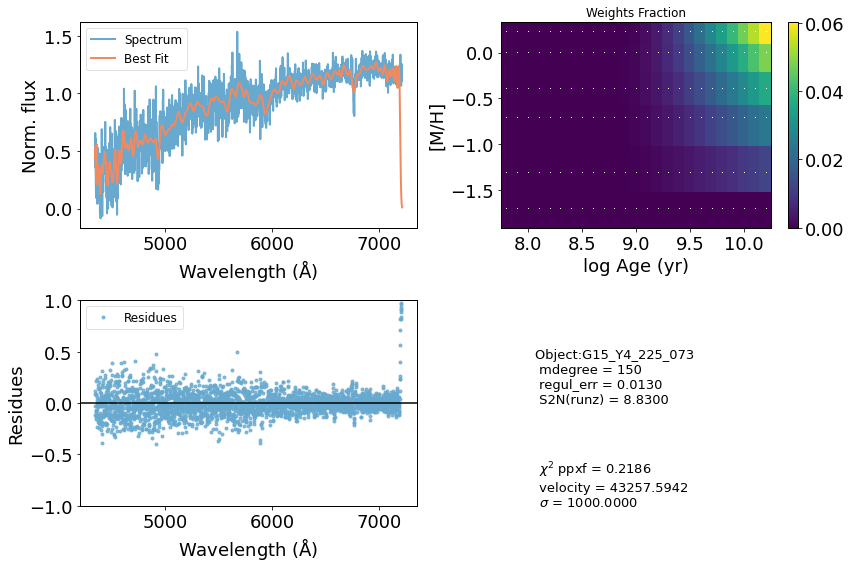

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     27453       471     0.001     0.001
 comp.  1:     27318       349
 comp.  2:     26950       125
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4388
method = capfit; Jac calls: 9; Func calls: 1449; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  67 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.901       5.3   27318   349
Comp:  2       Unknown          0       1.8   26950   125
Comp:  2       Unknown     0.1345       1.9   26950   125
Comp:  2       Unknown      0.481       3.5   26950   125
Comp:  2       Unknown     0.7719       2.9   26950   125
Comp:  2       Unknown     0.1296       2.2   26950   125
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.84
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


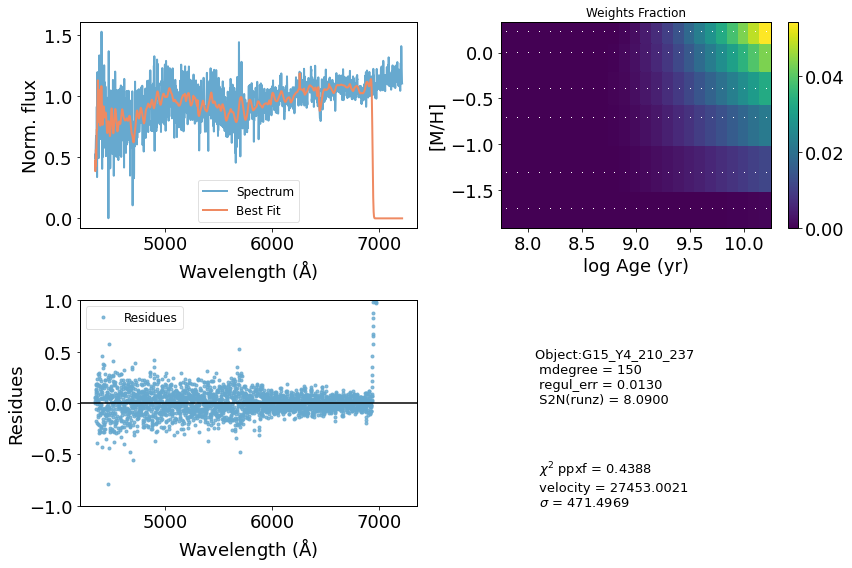

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36555      1000     0.272     0.300
 comp.  1:     34951         1
 comp.  2:     34534       175
Gas Reddening E(B-V): 5.139
chi2/DOF: 0.2792
method = capfit; Jac calls: 20; Func calls: 3206; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.0973       1.1   34951     1
Comp:  2       Unknown     0.8083       3.8   34534   175
Comp:  2       Unknown          0       3.9   34534   175
Comp:  2       Unknown          0       2.7   34534   175
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.894
Current $\chi^2$: 0.2792
Elapsed time in PPXF: 20.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


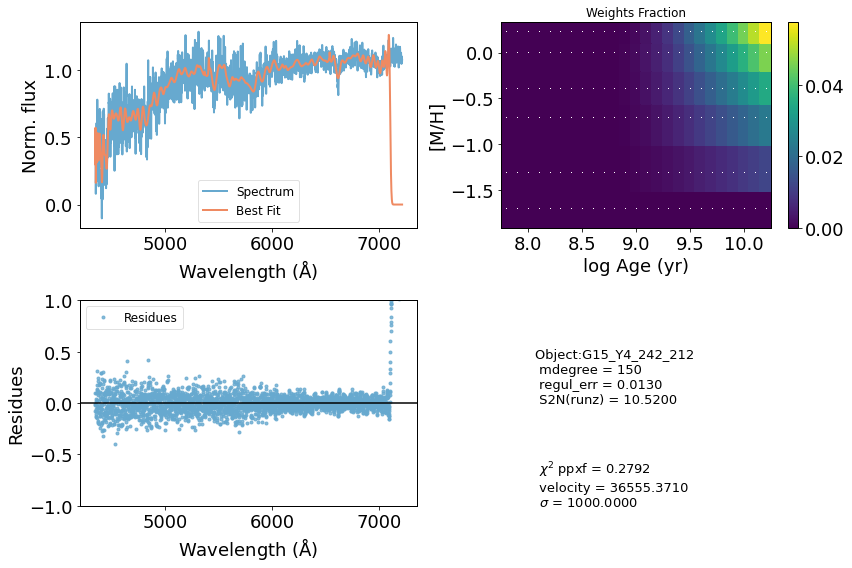

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     77481       942    -0.002    -0.000
 comp.  1:     77512       414
 comp.  2:     77482       178
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.05394
method = capfit; Jac calls: 8; Func calls: 1286; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       4.36         6   77512   414
Comp:  2       Unknown          0       5.1   77482   178
Comp:  2       Unknown      0.327       5.1   77482   178
Comp:  2       Unknown          0       3.3   77482   178
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.205
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.205
M/L_r: 2.674
Current $\chi^2$: 0.0539
Elapsed time in PPXF: 8.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


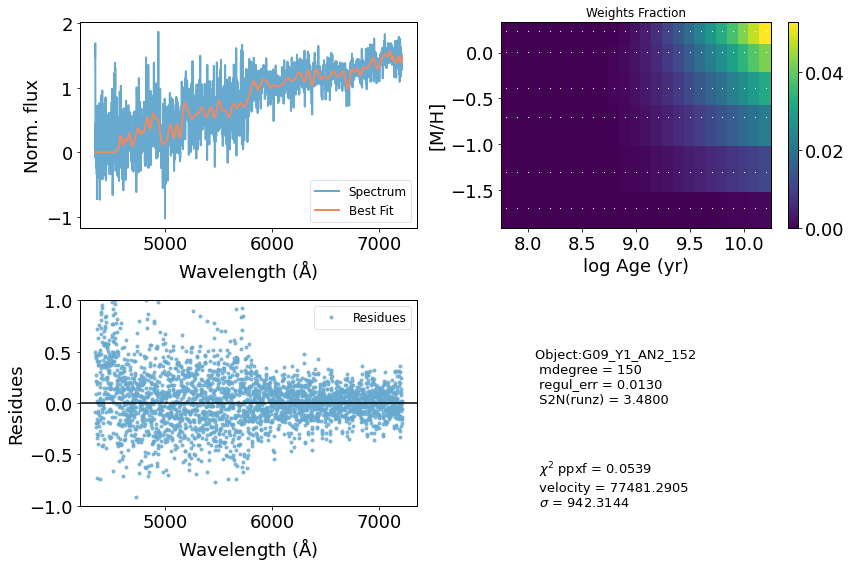

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53565      1000     0.300     0.300
 comp.  1:     51661        85
 comp.  2:     51843        14
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.04843
method = capfit; Jac calls: 19; Func calls: 3047; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.162       2.9   51661    85
Comp:  2       Unknown      1.432       3.5   51843    14
Comp:  2       Unknown      1.862       3.6   51843    14
Comp:  2       Unknown    0.07174       2.5   51843    14
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.012
Current $\chi^2$: 0.0484
Elapsed time in PPXF: 19.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


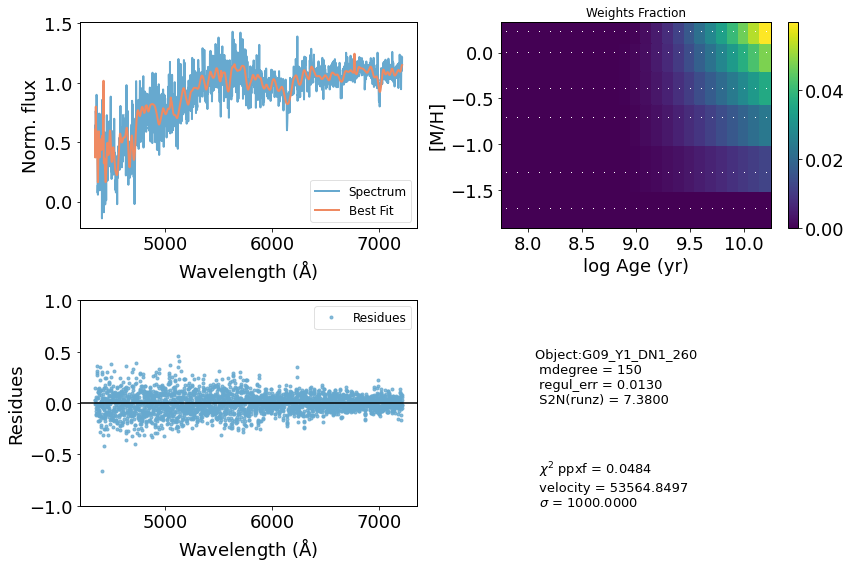

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56963      1000     0.300     0.300
 comp.  1:     54924        53
 comp.  2:     55092       232
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.02052
method = capfit; Jac calls: 17; Func calls: 2724; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3685       1.3   54924    53
Comp:  2       Unknown      2.134   3.4e+02   55092   232
Comp:  2       Unknown          0   3.5e+02   55092   232
Comp:  2       Unknown      1.933       6.7   55092   232
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.211
Current $\chi^2$: 0.0205
Elapsed time in PPXF: 16.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


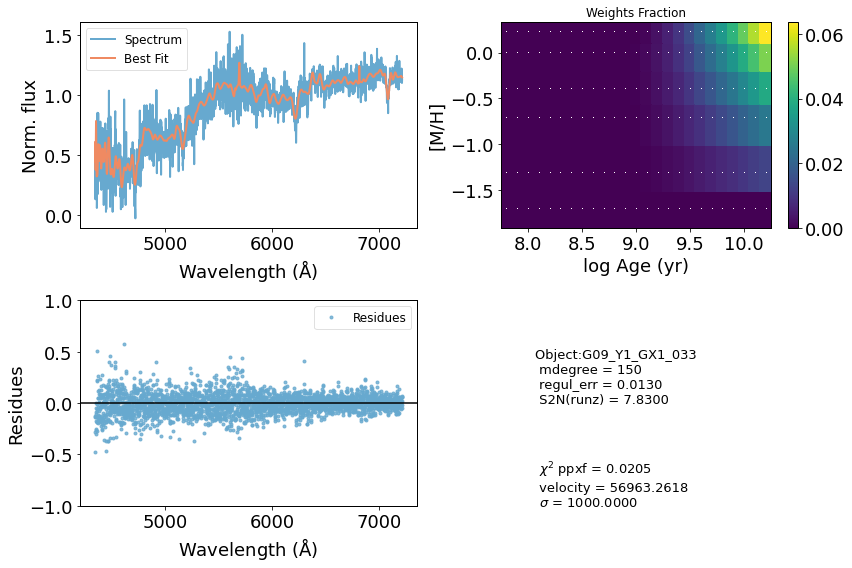

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55628      1000     0.300     0.300
 comp.  1:     54670       988
 comp.  2:     54340       208
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02794
method = capfit; Jac calls: 16; Func calls: 2565; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.02579        10   54670   988
Comp:  2       Unknown      1.062       5.9   54340   208
Comp:  2       Unknown          0       5.8   54340   208
Comp:  2       Unknown      1.298       6.4   54340   208
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.071
Current $\chi^2$: 0.0279
Elapsed time in PPXF: 16.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


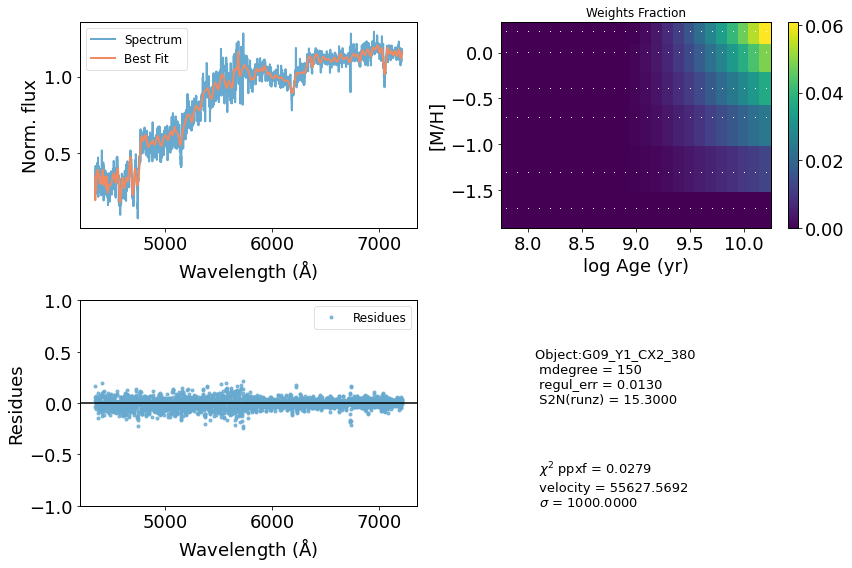

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58812      1000     0.300     0.300
 comp.  1:     56770         1
 comp.  2:     56270       426
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003948
method = capfit; Jac calls: 21; Func calls: 3370; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1394       2.3   56770     1
Comp:  2       Unknown      3.881        16   56270   426
Comp:  2       Unknown          0        16   56270   426
Comp:  2       Unknown      1.323       8.3   56270   426
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.886
Current $\chi^2$: 0.0039
Elapsed time in PPXF: 21.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


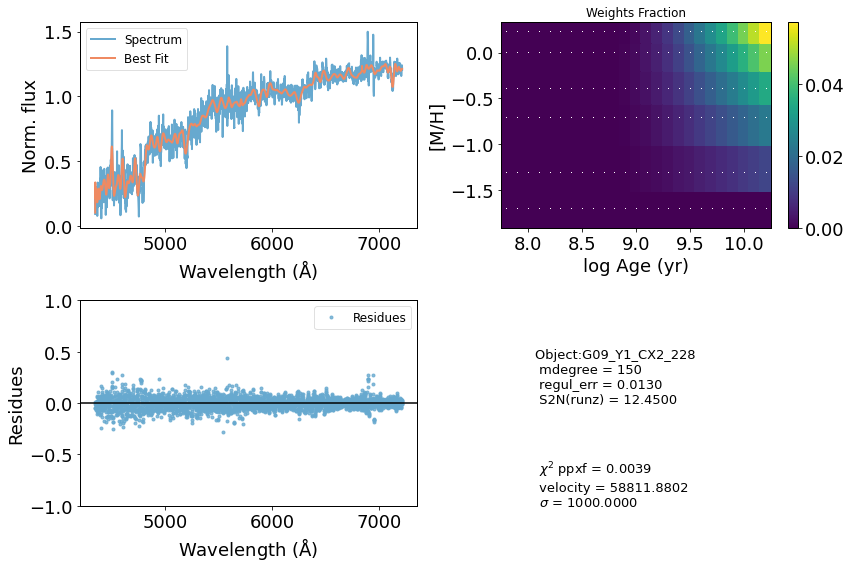

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74394       590     0.005     0.000
 comp.  1:     74377       486
 comp.  2:     74721       114
Gas Reddening E(B-V): 0.801
chi2/DOF: 0.02611
method = capfit; Jac calls: 7; Func calls: 1126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  25 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.741       4.4   74377   486
Comp:  2       Unknown     0.1524       4.7   74721   114
Comp:  2       Unknown      1.327       4.4   74721   114
Comp:  2       Unknown          0       2.5   74721   114
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.382
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.382
M/L_r: 2.481
Current $\chi^2$: 0.0261
Elapsed time in PPXF: 7.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


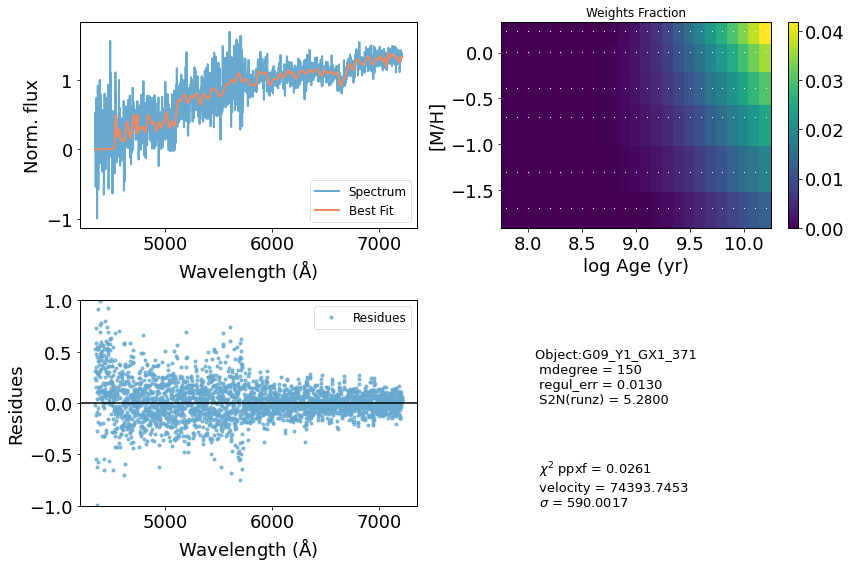

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     22113      1000     0.150     0.300
 comp.  1:     19427       495
 comp.  2:     19634       332
Gas Reddening E(B-V): 0.378
chi2/DOF: 0.3641
method = capfit; Jac calls: 41; Func calls: 6563; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       6.92       7.2   19427   495
Comp:  2       Unknown          0       3.8   19634   332
Comp:  2       Unknown          0       3.8   19634   332
Comp:  2       Unknown          0       5.1   19634   332
Comp:  2       Unknown     0.2648       4.8   19634   332
Comp:  2       Unknown      2.491       4.9   19634   332
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


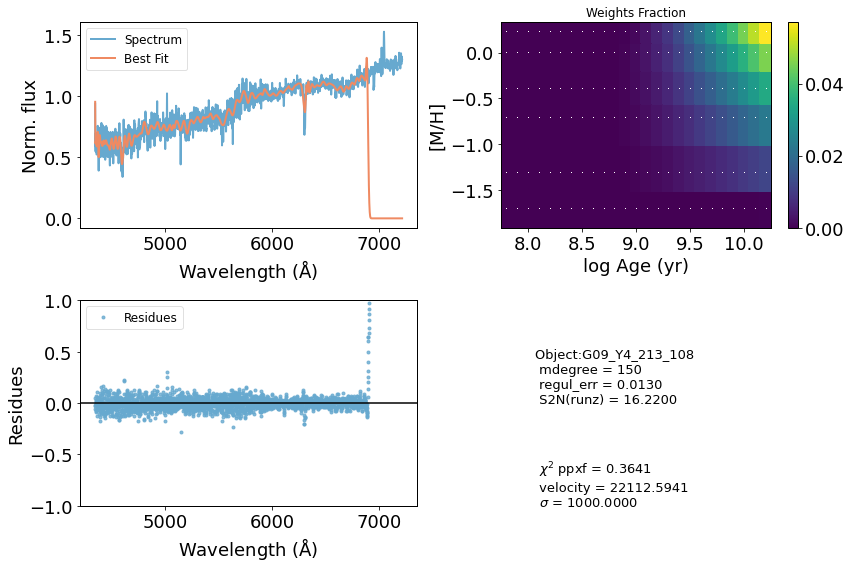

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48729      1000     0.004     0.011
 comp.  1:     47645       684
 comp.  2:     47368       276
Gas Reddening E(B-V): 1.414
chi2/DOF: 0.08203
method = capfit; Jac calls: 15; Func calls: 2408; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.207       7.7   47645   684
Comp:  2       Unknown          0       9.7   47368   276
Comp:  2       Unknown      2.388       9.8   47368   276
Comp:  2       Unknown          0       4.8   47368   276
Comp:  2       Unknown     0.9087       4.7   47368   276
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.288
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.288
M/L_r: 2.5
Current $\chi^2$: 0.0820
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


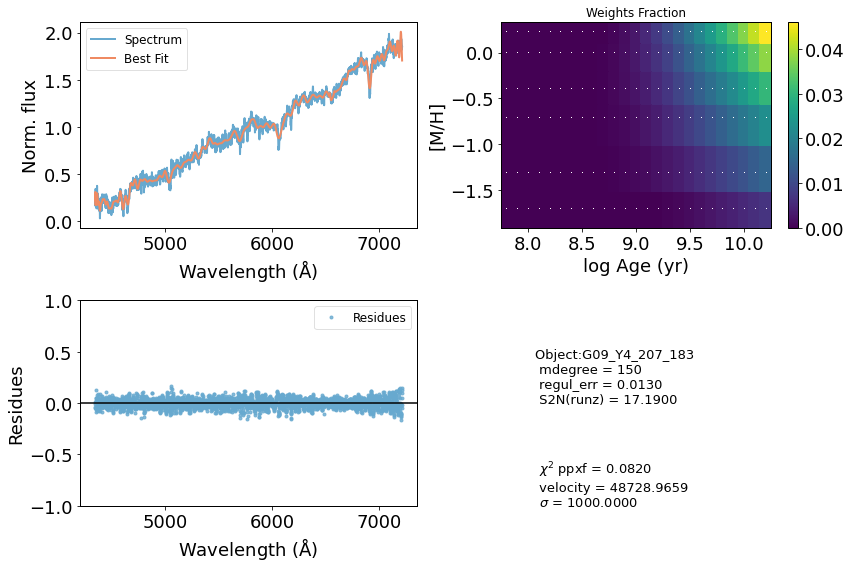

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40512      1000     0.300     0.300
 comp.  1:     39529       599
 comp.  2:     38424       847
Gas Reddening E(B-V): 6.511
chi2/DOF: 0.2394
method = capfit; Jac calls: 20; Func calls: 3206; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.764       4.2   39529   599
Comp:  2       Unknown          0       8.2   38424   847
Comp:  2       Unknown      2.807       6.5   38424   847
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.078
Current $\chi^2$: 0.2394
Elapsed time in PPXF: 19.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


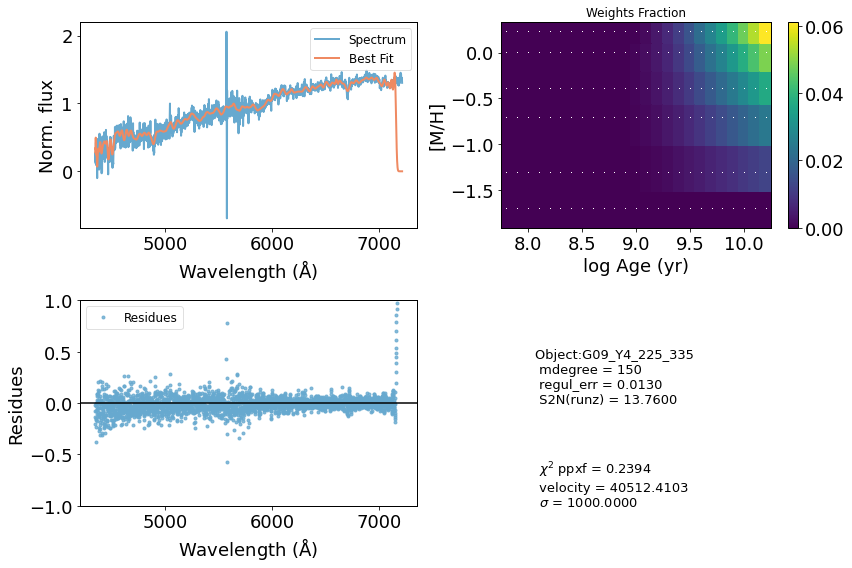

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45540      1000     0.281     0.300
 comp.  1:     43790       123
 comp.  2:     43655       130
Gas Reddening E(B-V): 1.224
chi2/DOF: 0.1961
method = capfit; Jac calls: 29; Func calls: 4646; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  21 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         2   43790   123
Comp:  2       Unknown     0.9467       3.6   43655   130
Comp:  2       Unknown      1.064       2.1   43655   130
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.197
M/L_r: 3.237
Current $\chi^2$: 0.1961
Elapsed time in PPXF: 28.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


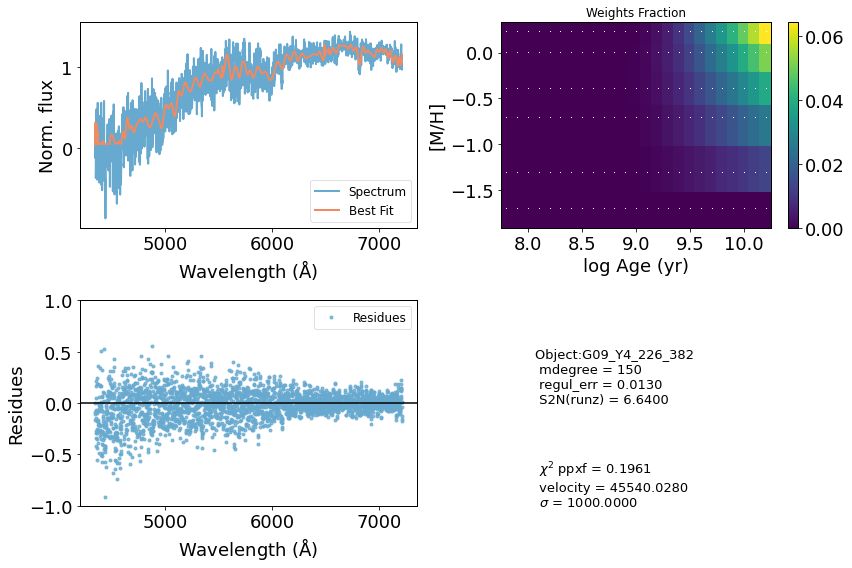

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60836       969    -0.000     0.004
 comp.  1:     60982        88
 comp.  2:     60145         1
Gas Reddening E(B-V): 0.870
chi2/DOF: 0.01366
method = capfit; Jac calls: 11; Func calls: 1766; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  84 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4349         2   60982    88
Comp:  2       Unknown          0       3.1   60145     1
Comp:  2       Unknown          0       3.1   60145     1
Comp:  2       Unknown          0       2.3   60145     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.863
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.863
M/L_r: 1.635
Current $\chi^2$: 0.0137
Elapsed time in PPXF: 11.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


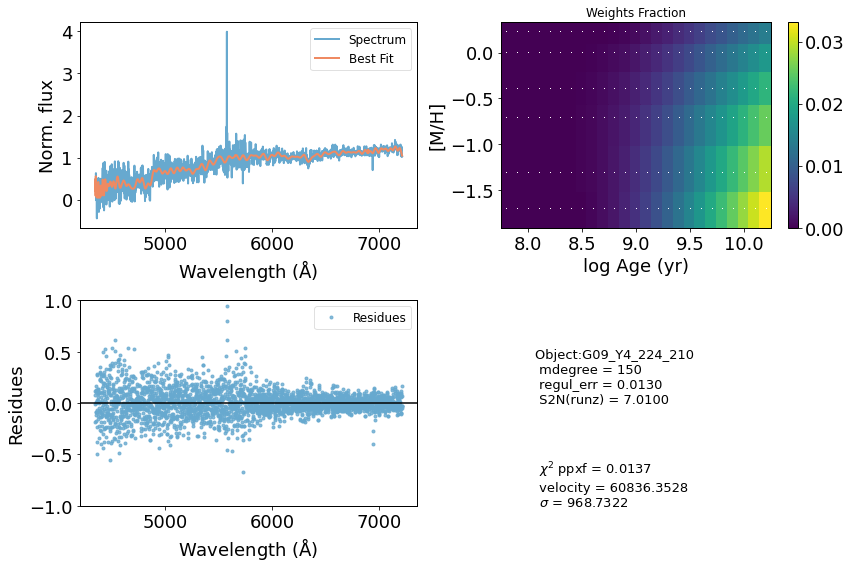

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44998      1000     0.300     0.300
 comp.  1:     43314       105
 comp.  2:     42382       604
Gas Reddening E(B-V): 4.184
chi2/DOF: 0.1585
method = capfit; Jac calls: 16; Func calls: 2565; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1896       1.6   43314   105
Comp:  2       Unknown          0       7.2   42382   604
Comp:  2       Unknown      1.852       5.1   42382   604
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.014
Current $\chi^2$: 0.1585
Elapsed time in PPXF: 15.77 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


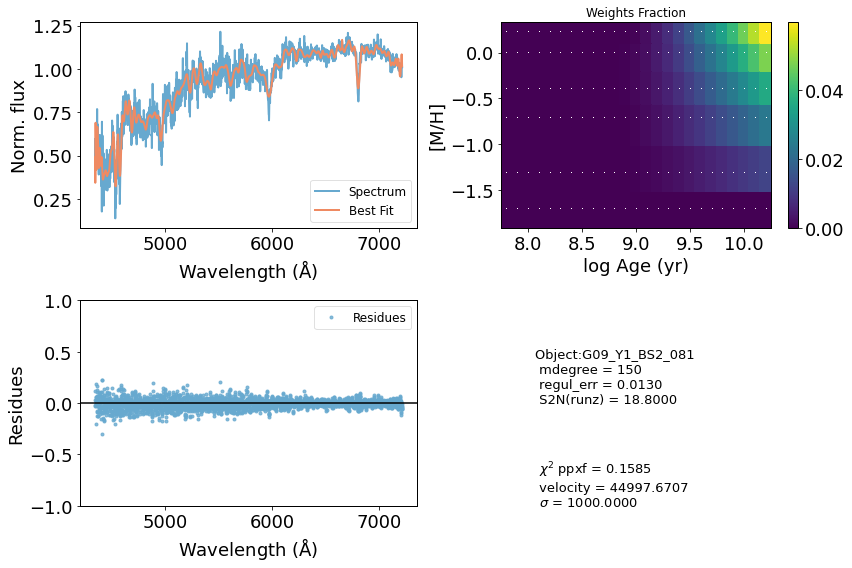

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49376      1000     0.300     0.300
 comp.  1:     46659       201
 comp.  2:     47188        15
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.09774
method = capfit; Jac calls: 15; Func calls: 2405; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.43       4.2   46659   201
Comp:  2       Unknown          0       3.4   47188    15
Comp:  2       Unknown          0       3.3   47188    15
Comp:  2       Unknown          0       2.3   47188    15
Comp:  2       Unknown    0.02606       1.5   47188    15
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.989
Current $\chi^2$: 0.0977
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


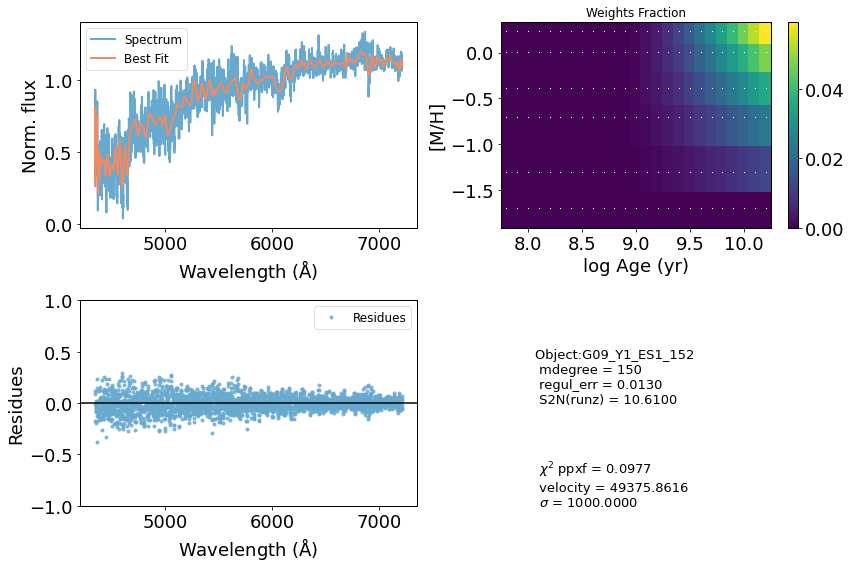

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68032      1000    -0.111     0.102
 comp.  1:     69504         1
 comp.  2:     68399        66
Gas Reddening E(B-V): 1.593
chi2/DOF: 0.006343
method = capfit; Jac calls: 52; Func calls: 8330; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.0467       1.2   69504     1
Comp:  2       Unknown     0.4418       3.2   68399    66
Comp:  2       Unknown     0.2412       3.2   68399    66
Comp:  2       Unknown          0       2.6   68399    66
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.09
M/L_r: 1.245
Current $\chi^2$: 0.0063
Elapsed time in PPXF: 54.49 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


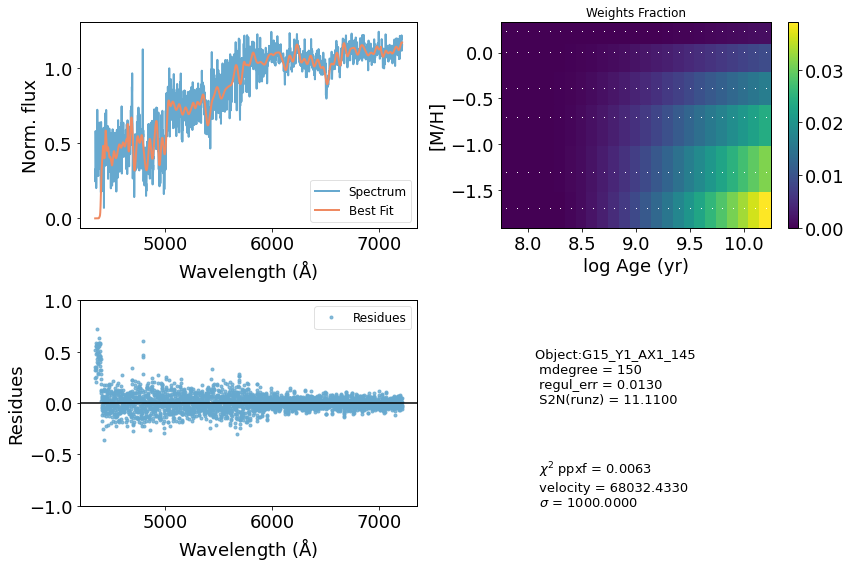

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     27899      1000     0.074     0.273
 comp.  1:     26163       169
 comp.  2:     25857       454
Gas Reddening E(B-V): 2.824
chi2/DOF: 0.2755
method = capfit; Jac calls: 28; Func calls: 4484; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7763       2.6   26163   169
Comp:  2       Unknown     0.9269       4.8   25857   454
Comp:  2       Unknown          0       4.6   25857   454
Comp:  2       Unknown     0.9101       5.9   25857   454
Comp:  2       Unknown      1.845       5.5   25857   454
Comp:  2       Unknown          0       4.7   25857   454
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


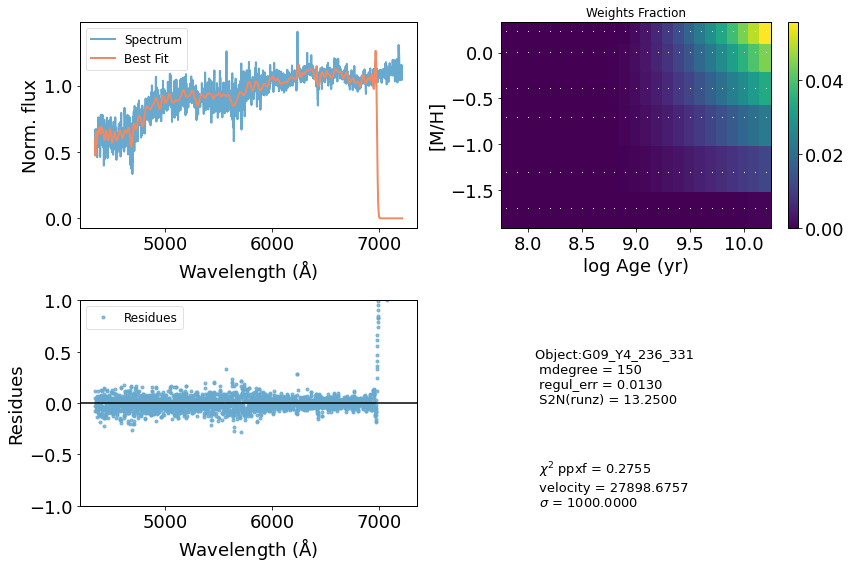

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68584      1000    -0.093     0.075
 comp.  1:     69276       441
 comp.  2:     69889       180
Gas Reddening E(B-V): 3.498
chi2/DOF: 0.006227
method = capfit; Jac calls: 21; Func calls: 3366; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.389       4.8   69276   441
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       3.4   69889   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.29
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.29
Weighted <[M/H]>: -1.11
M/L_r: 0.5448
Current $\chi^2$: 0.0062
Elapsed time in PPXF: 21.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


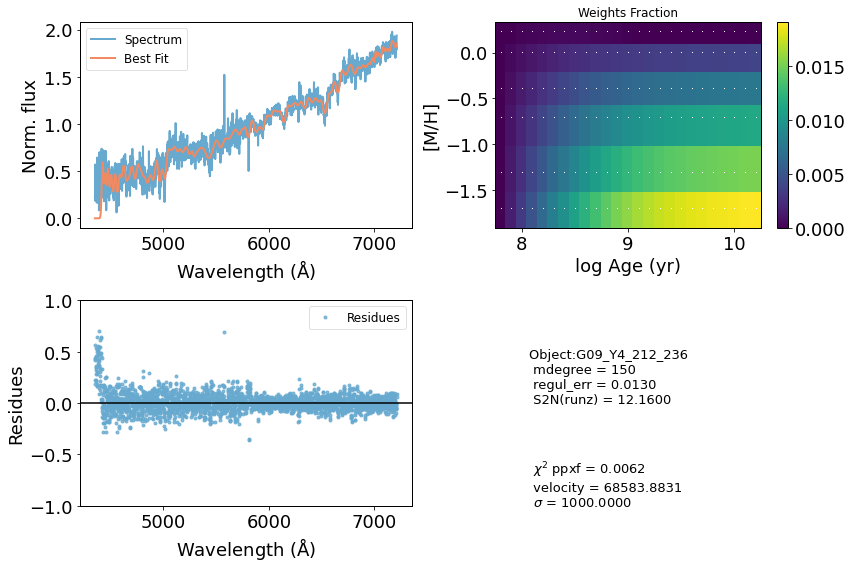

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55615      1000     0.300     0.300
 comp.  1:     53693        49
 comp.  2:     53862       191
Gas Reddening E(B-V): 2.109
chi2/DOF: 0.04483
method = capfit; Jac calls: 13; Func calls: 2083; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.06685       1.2   53693    49
Comp:  2       Unknown          0       8.4   53862   191
Comp:  2       Unknown      6.662       8.8   53862   191
Comp:  2       Unknown     0.8608       5.6   53862   191
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.159
Current $\chi^2$: 0.0448
Elapsed time in PPXF: 13.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


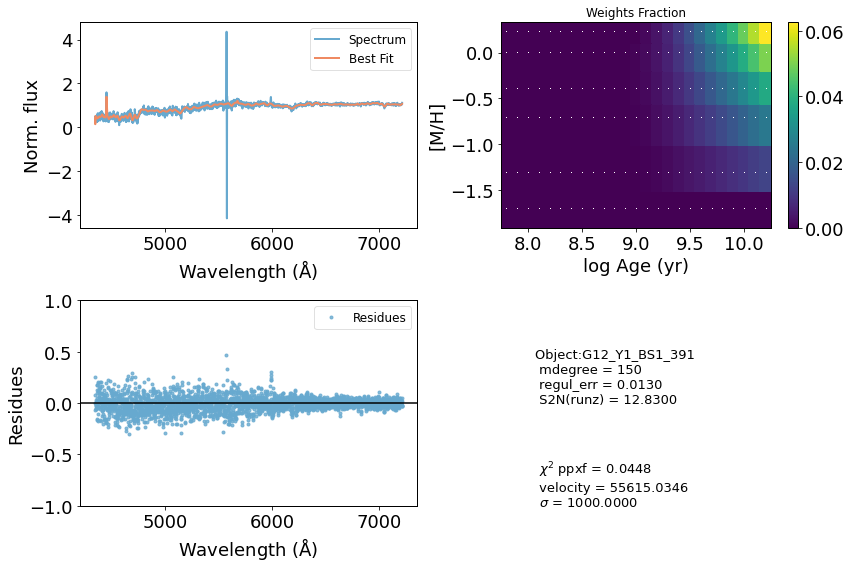

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44844      1000     0.300     0.300
 comp.  1:     42475       481
 comp.  2:     42814        44
Gas Reddening E(B-V): 2.978
chi2/DOF: 0.1828
method = capfit; Jac calls: 15; Func calls: 2404; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.273       3.1   42475   481
Comp:  2       Unknown     0.4553       2.4   42814    44
Comp:  2       Unknown          0       1.5   42814    44
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.072
Current $\chi^2$: 0.1828
Elapsed time in PPXF: 14.54 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


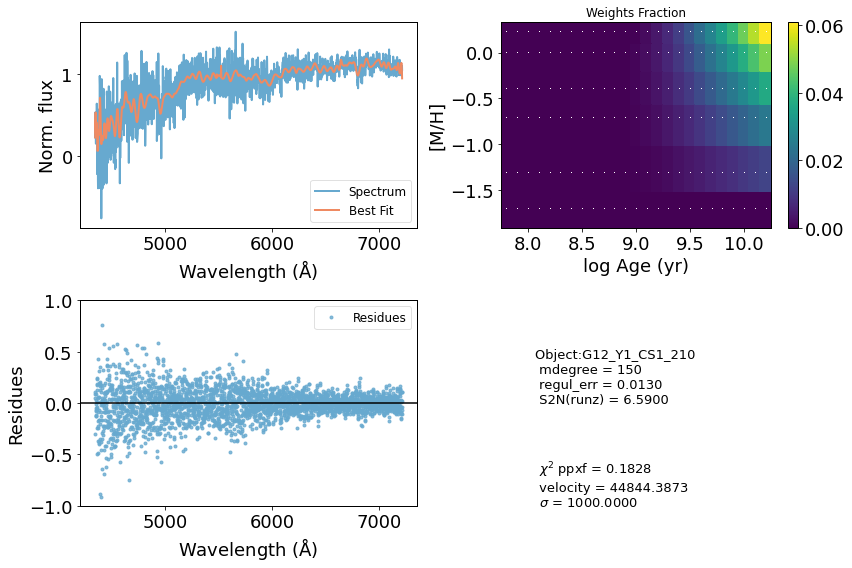

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30424       180     0.000     0.000
 comp.  1:     30424       180
 comp.  2:     30424       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4788
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  70 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.153       3.7   30424   180
Comp:  2       Unknown       1.56       4.2   30424   180
Comp:  2       Unknown     0.1378       3.4   30424   180
Comp:  2       Unknown     0.2085       2.3   30424   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.628
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.628
M/L_r: 2.529
Current $\chi^2$: 0.4788
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


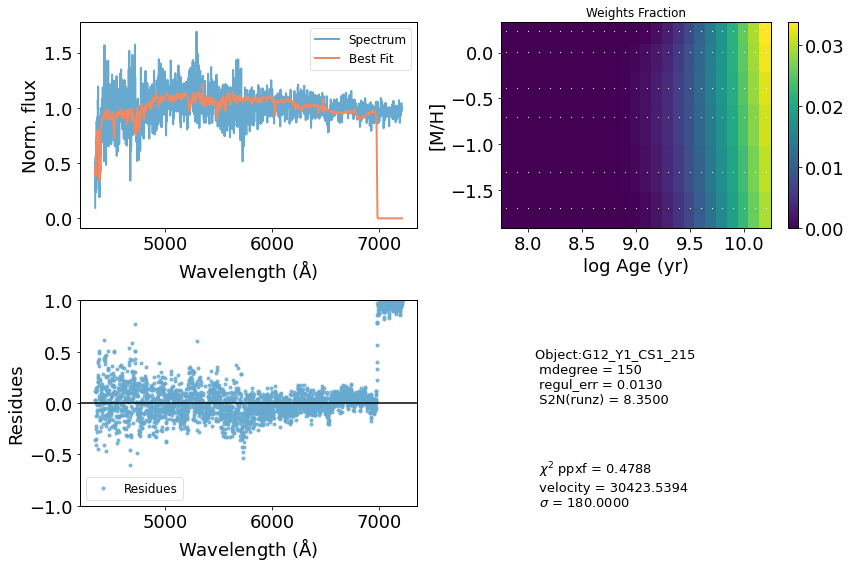

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74528      1000    -0.075     0.076
 comp.  1:     75515       208
 comp.  2:     75144       413
Gas Reddening E(B-V): 1.380
chi2/DOF: 0.003996
method = capfit; Jac calls: 28; Func calls: 4488; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.203       3.3   75515   208
Comp:  2       Unknown          0        16   75144   413
Comp:  2       Unknown      2.954        16   75144   413
Comp:  2       Unknown     0.8249       5.7   75144   413
---------------------------------------------------------
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -1.11
M/L_r: 1.07
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 29.63 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


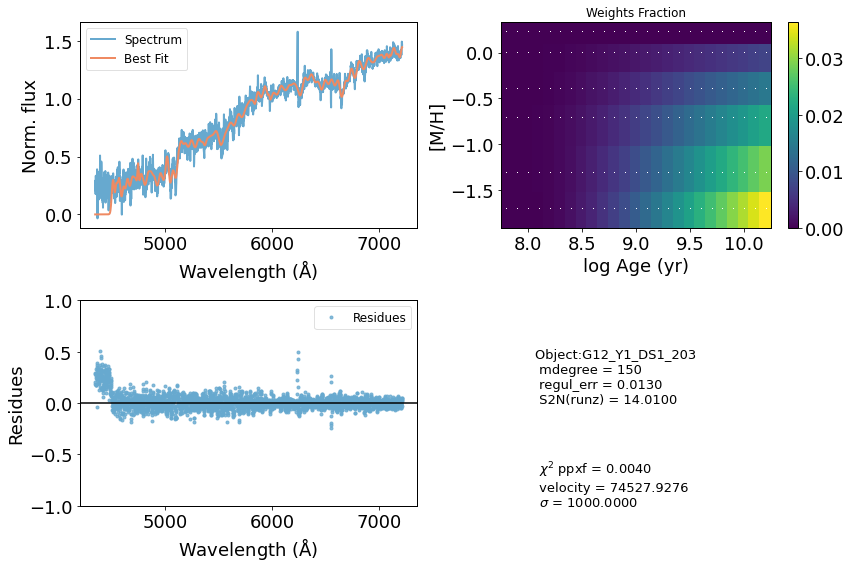

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60257      1000     0.001     0.003
 comp.  1:     59888      1000
 comp.  2:     59272         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0109
method = capfit; Jac calls: 19; Func calls: 3045; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      40.44        11   59888  1000
Comp:  2       Unknown     0.3656       2.5   59272     1
Comp:  2       Unknown          0       2.4   59272     1
Comp:  2       Unknown     0.4825       2.4   59272     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -1.05
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -1.05
M/L_r: 1.174
Current $\chi^2$: 0.0109
Elapsed time in PPXF: 19.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


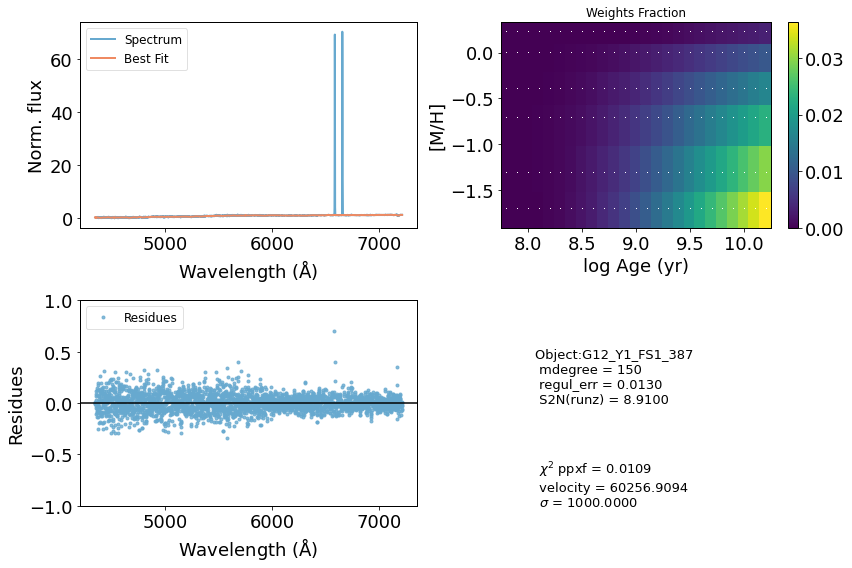

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47774      1000     0.300     0.300
 comp.  1:     45914       227
 comp.  2:     45689         1
Gas Reddening E(B-V): 6.490
chi2/DOF: 0.09234
method = capfit; Jac calls: 17; Func calls: 2729; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   45914   227
Comp:  2       Unknown     0.6535       2.4   45689     1
Comp:  2       Unknown          0       1.3   45689     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.038
Current $\chi^2$: 0.0923
Elapsed time in PPXF: 17.53 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


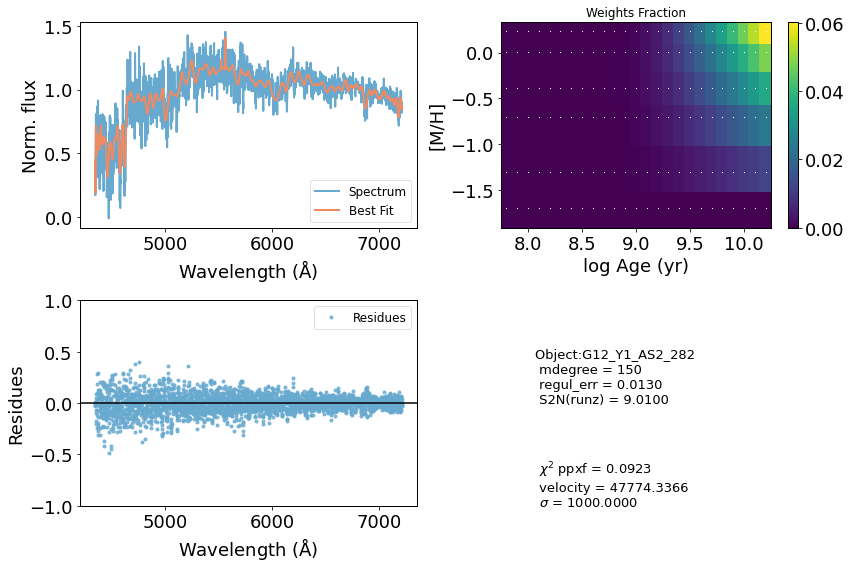

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56061      1000     0.300     0.300
 comp.  1:     54458       236
 comp.  2:     54867       140
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03661
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.5   54458   236
Comp:  2       Unknown          0       5.9   54867   140
Comp:  2       Unknown          0       5.7   54867   140
Comp:  2       Unknown     0.7169       4.6   54867   140
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.197
Current $\chi^2$: 0.0366
Elapsed time in PPXF: 12.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


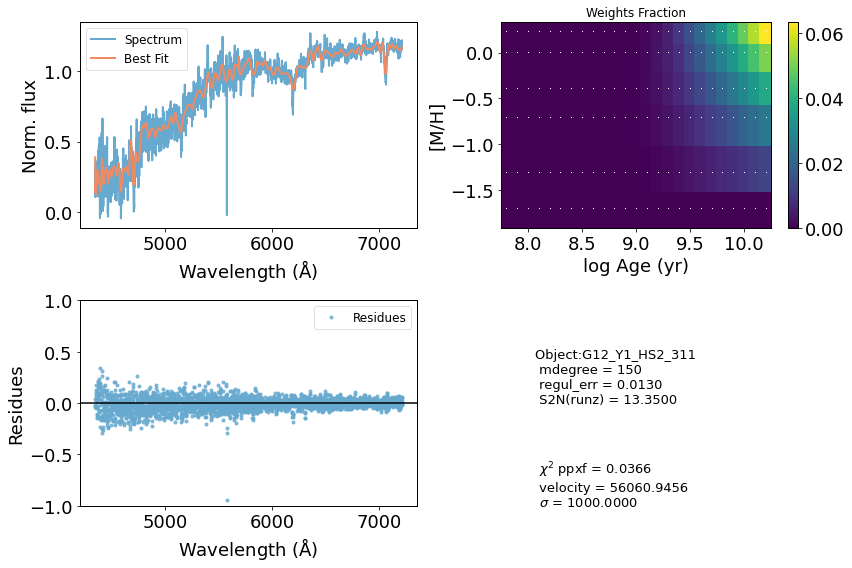

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41147      1000     0.300     0.300
 comp.  1:     39380       272
 comp.  2:     39421      1000
Gas Reddening E(B-V): 4.602
chi2/DOF: 0.1601
method = capfit; Jac calls: 18; Func calls: 2886; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4625       2.7   39380   272
Comp:  2       Unknown       8.91       8.6   39421  1000
Comp:  2       Unknown      4.321       6.4   39421  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.982
Current $\chi^2$: 0.1601
Elapsed time in PPXF: 18.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


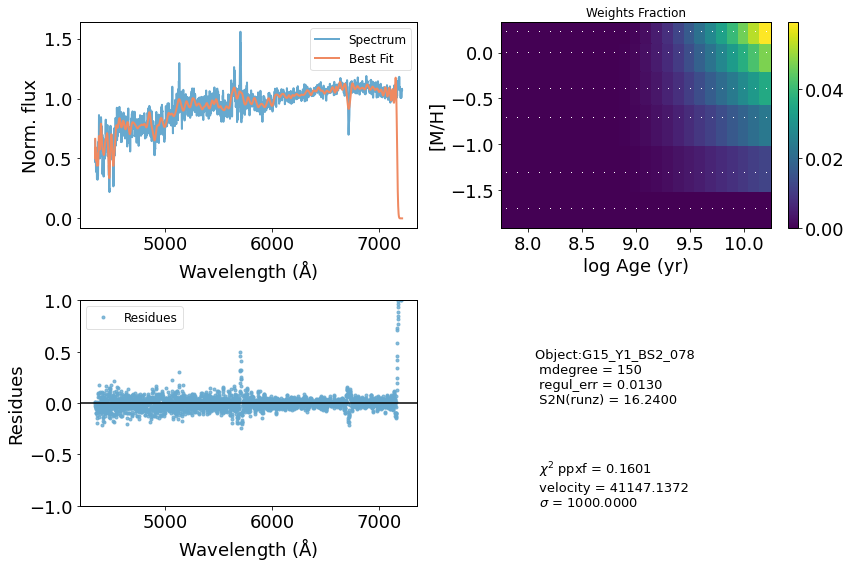

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54942      1000     0.300     0.300
 comp.  1:     53464       725
 comp.  2:     53203       205
Gas Reddening E(B-V): 3.230
chi2/DOF: 0.05261
method = capfit; Jac calls: 23; Func calls: 3684; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.055       3.6   53464   725
Comp:  2       Unknown          0        11   53203   205
Comp:  2       Unknown      3.278        11   53203   205
Comp:  2       Unknown     0.1244       4.9   53203   205
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.151
Current $\chi^2$: 0.0526
Elapsed time in PPXF: 23.85 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


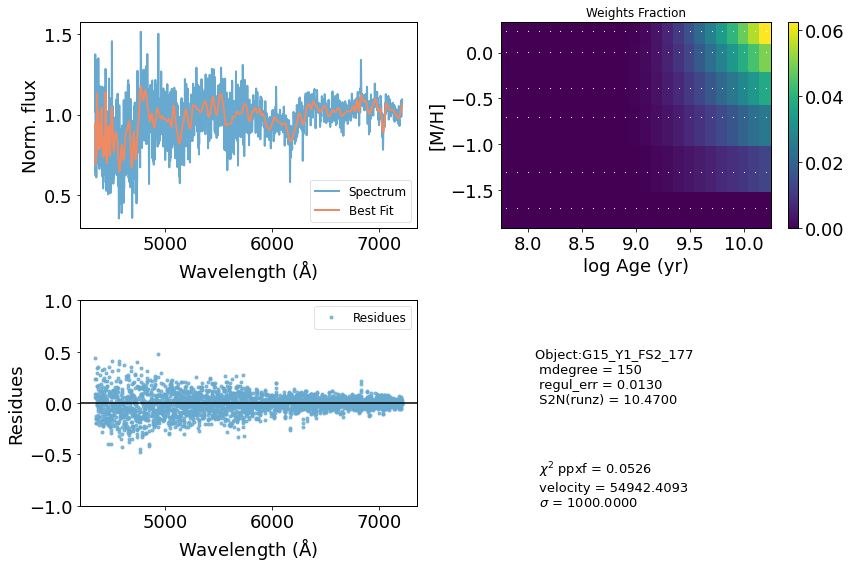

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53653      1000     0.300     0.300
 comp.  1:     51866       331
 comp.  2:     51945         9
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08485
method = capfit; Jac calls: 19; Func calls: 3046; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.3   51866   331
Comp:  2       Unknown          0       4.4   51945     9
Comp:  2       Unknown      1.829       4.5   51945     9
Comp:  2       Unknown          0       2.5   51945     9
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.14
Current $\chi^2$: 0.0848
Elapsed time in PPXF: 18.99 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


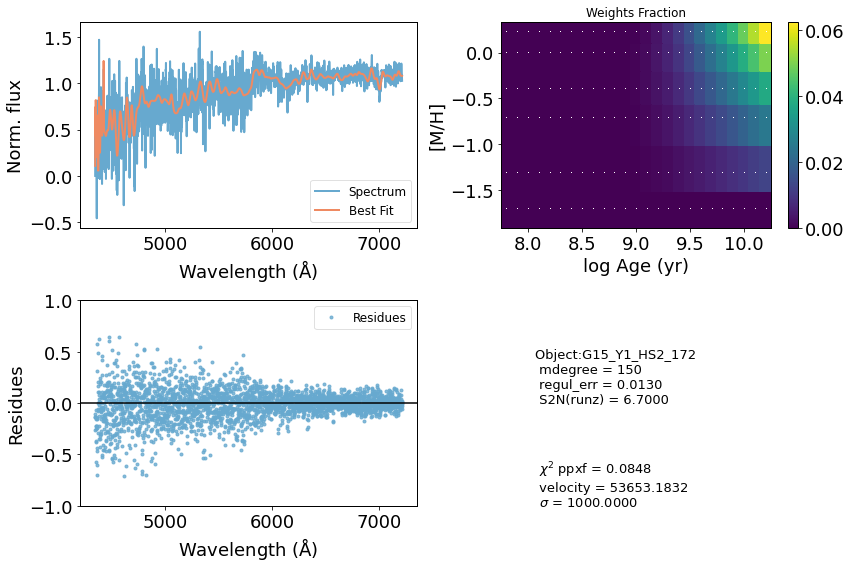

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47458      1000     0.300     0.300
 comp.  1:     46014       126
 comp.  2:     45338        96
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.18
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5755       2.9   46014   126
Comp:  2       Unknown      1.716       3.4   45338    96
Comp:  2       Unknown          0       1.7   45338    96
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.063
Current $\chi^2$: 0.1800
Elapsed time in PPXF: 12.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


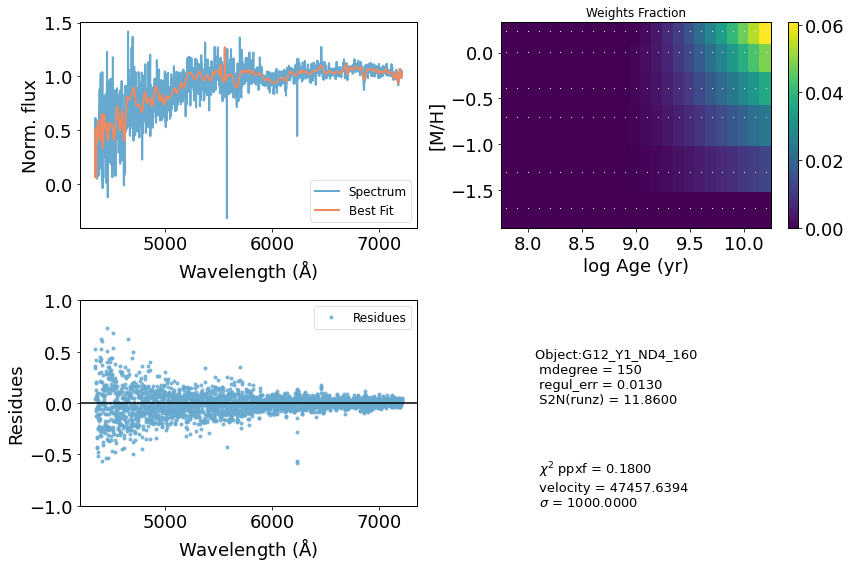

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51203      1000     0.300     0.300
 comp.  1:     49198       289
 comp.  2:     49468       185
Gas Reddening E(B-V): 0.138
chi2/DOF: 0.08464
method = capfit; Jac calls: 15; Func calls: 2406; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  54 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.3   49198   289
Comp:  2       Unknown      1.621         8   49468   185
Comp:  2       Unknown      2.652       7.9   49468   185
Comp:  2       Unknown          0       4.4   49468   185
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.076
Current $\chi^2$: 0.0846
Elapsed time in PPXF: 14.96 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


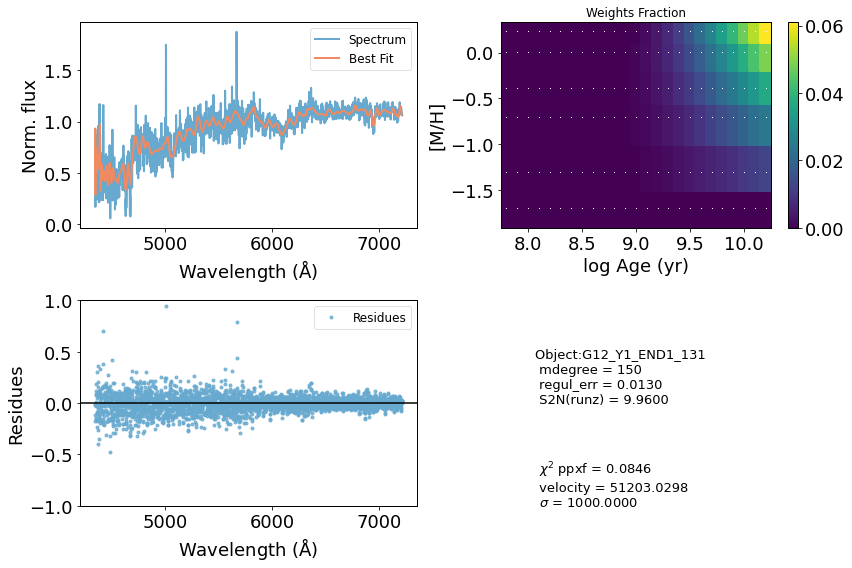

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57532      1000     0.300     0.300
 comp.  1:     56034       381
 comp.  2:     55229       561
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01433
method = capfit; Jac calls: 26; Func calls: 4170; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4751       3.2   56034   381
Comp:  2       Unknown      48.82   5.5e+02   55229   561
Comp:  2       Unknown          0   5.6e+02   55229   561
Comp:  2       Unknown          0       7.9   55229   561
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.104
Current $\chi^2$: 0.0143
Elapsed time in PPXF: 26.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


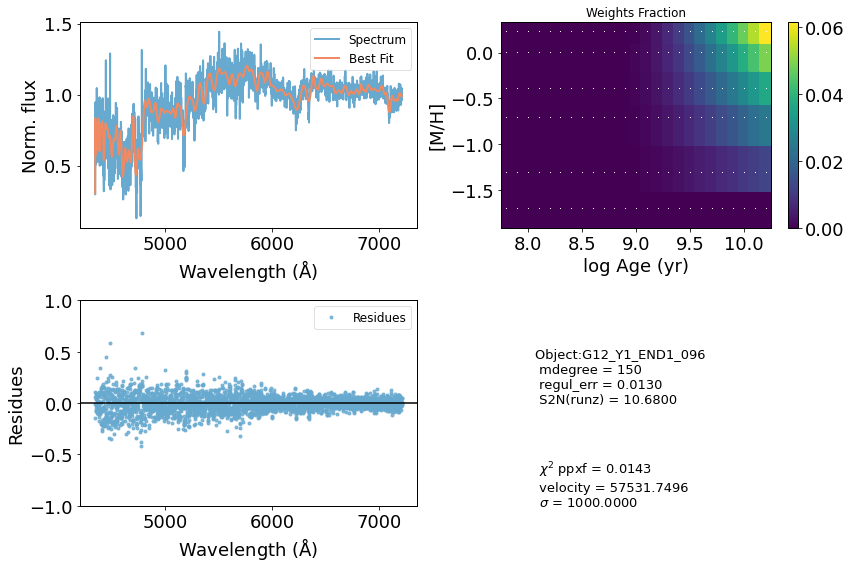

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57008      1000     0.300     0.300
 comp.  1:     55518       163
 comp.  2:     55806       115
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01761
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   55518   163
Comp:  2       Unknown     0.9888         4   55806   115
Comp:  2       Unknown          0       3.8   55806   115
Comp:  2       Unknown      0.474       4.1   55806   115
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.183
Current $\chi^2$: 0.0176
Elapsed time in PPXF: 14.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


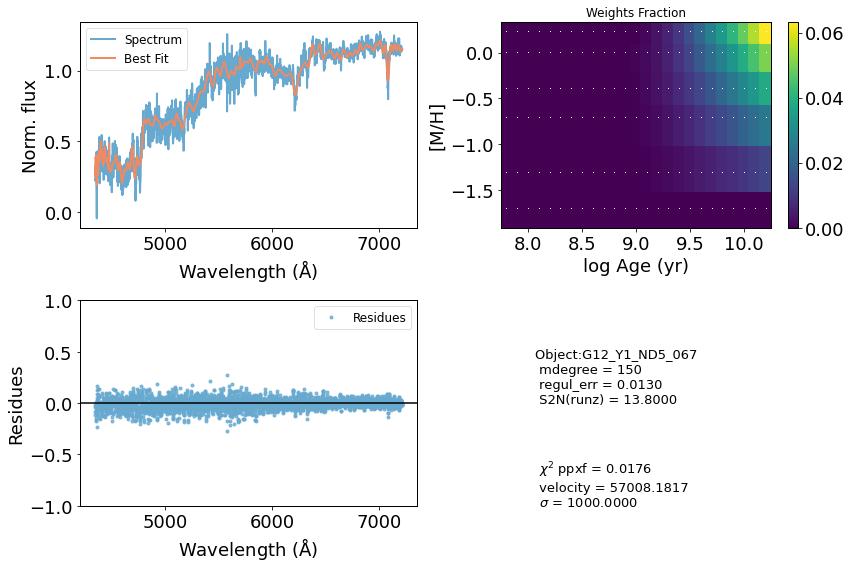

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43673      1000     0.300     0.300
 comp.  1:     41968       284
 comp.  2:     41673       180
Gas Reddening E(B-V): 0.097
chi2/DOF: 0.1533
method = capfit; Jac calls: 20; Func calls: 3207; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   41968   284
Comp:  2       Unknown          0       4.4   41673   180
Comp:  2       Unknown          0       2.5   41673   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.007
Current $\chi^2$: 0.1533
Elapsed time in PPXF: 20.60 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


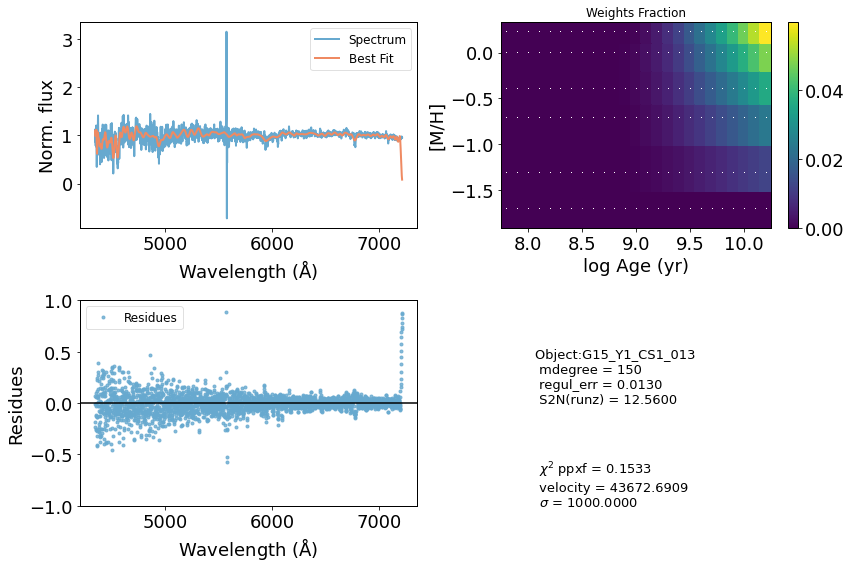

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74300      1000    -0.037     0.029
 comp.  1:     74124       114
 comp.  2:     74838       150
Gas Reddening E(B-V): 3.670
chi2/DOF: 0.02113
method = capfit; Jac calls: 12; Func calls: 1923; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7509       1.4   74124   114
Comp:  2       Unknown      3.516         9   74838   150
Comp:  2       Unknown          0       7.2   74838   150
Comp:  2       Unknown      1.594         3   74838   150
---------------------------------------------------------
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.692
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.692
M/L_r: 1.538
Current $\chi^2$: 0.0211
Elapsed time in PPXF: 12.61 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


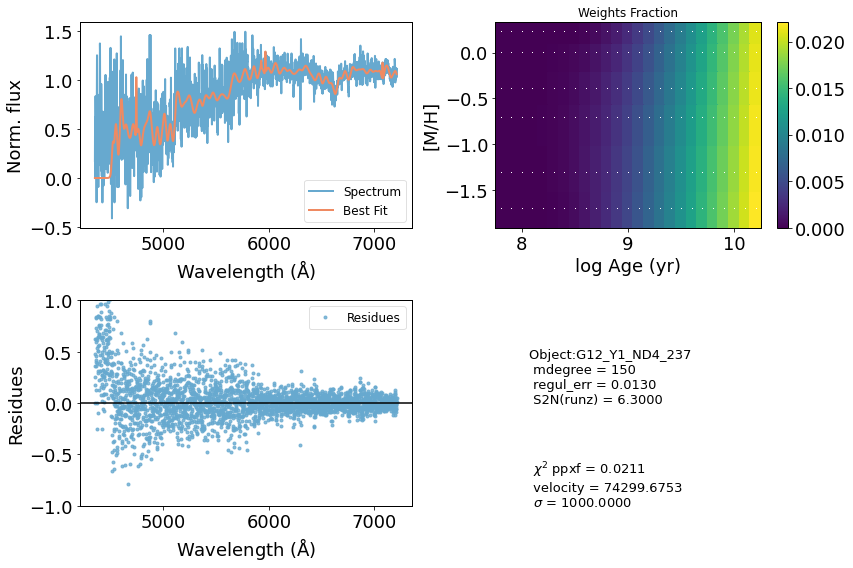

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     61003       751    -0.089    -0.026
 comp.  1:     61397      1000
 comp.  2:     60824        13
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003265
method = capfit; Jac calls: 14; Func calls: 2244; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  67 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      34.22       9.8   61397  1000
Comp:  2       Unknown     0.7074         4   60824    13
Comp:  2       Unknown          0       3.7   60824    13
Comp:  2       Unknown     0.2754       2.3   60824    13
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.93
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.93
M/L_r: 1.459
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 14.70 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


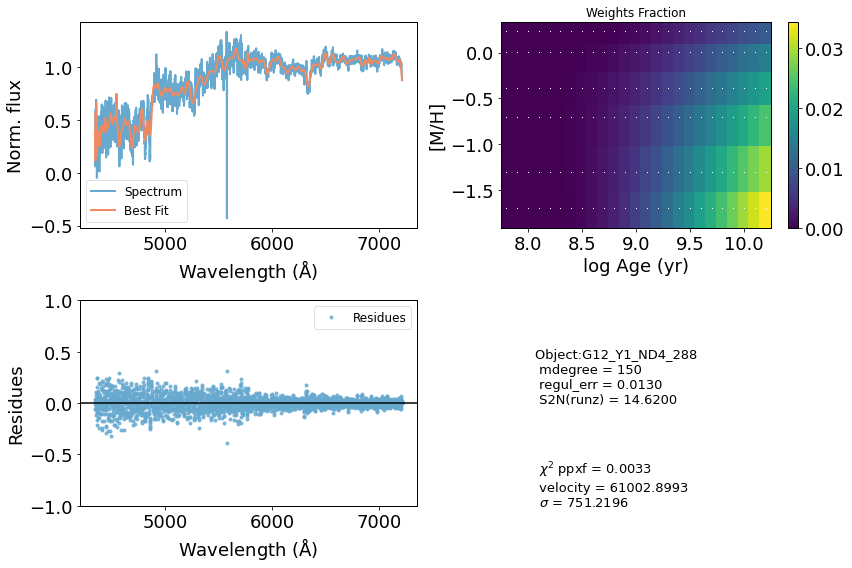

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52407      1000     0.300     0.300
 comp.  1:     50678       339
 comp.  2:     50536       214
Gas Reddening E(B-V): 1.500
chi2/DOF: 0.07436
method = capfit; Jac calls: 17; Func calls: 2727; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   50678   339
Comp:  2       Unknown          0       7.7   50536   214
Comp:  2       Unknown      1.795       7.8   50536   214
Comp:  2       Unknown     0.4889       5.1   50536   214
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.225
Current $\chi^2$: 0.0744
Elapsed time in PPXF: 17.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


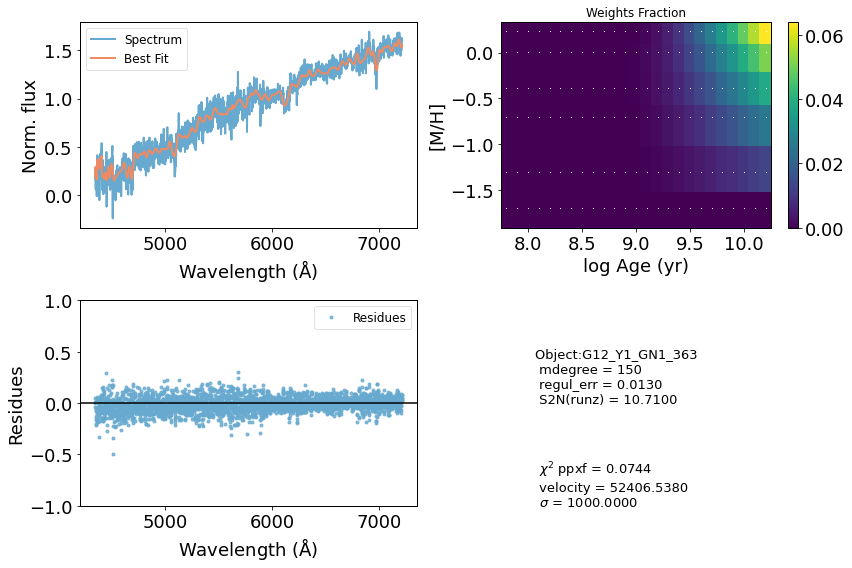

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52953      1000     0.300     0.300
 comp.  1:     51056        38
 comp.  2:     50839       119
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0875
method = capfit; Jac calls: 12; Func calls: 1926; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5578       2.4   51056    38
Comp:  2       Unknown          0       4.8   50839   119
Comp:  2       Unknown          0       4.8   50839   119
Comp:  2       Unknown     0.7989       3.8   50839   119
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.112
Current $\chi^2$: 0.0875
Elapsed time in PPXF: 11.74 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


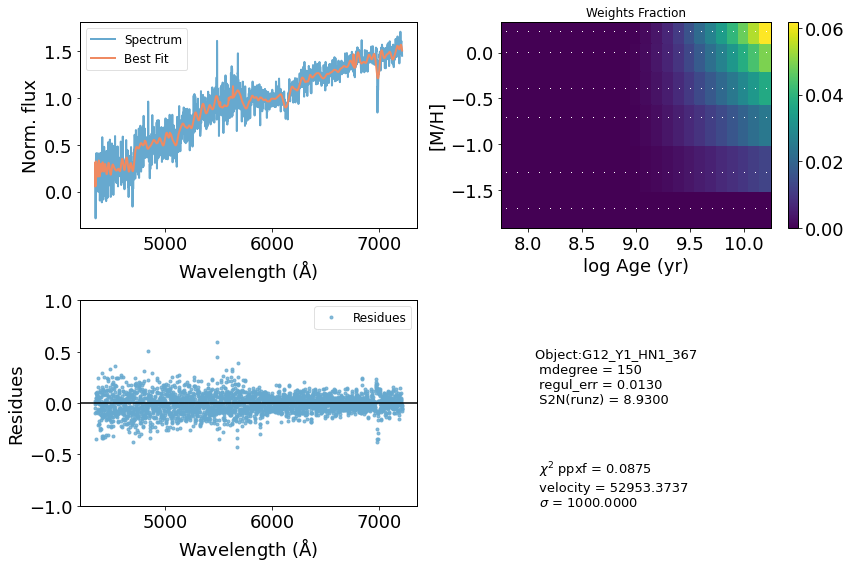

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68714      1000    -0.088     0.082
 comp.  1:     69216       676
 comp.  2:     68611       140
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01311
method = capfit; Jac calls: 16; Func calls: 2565; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.07       7.5   69216   676
Comp:  2       Unknown      2.191       4.9   68611   140
Comp:  2       Unknown          0       4.9   68611   140
Comp:  2       Unknown     0.7938       3.3   68611   140
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.207
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.207
M/L_r: 2.71
Current $\chi^2$: 0.0131
Elapsed time in PPXF: 16.35 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


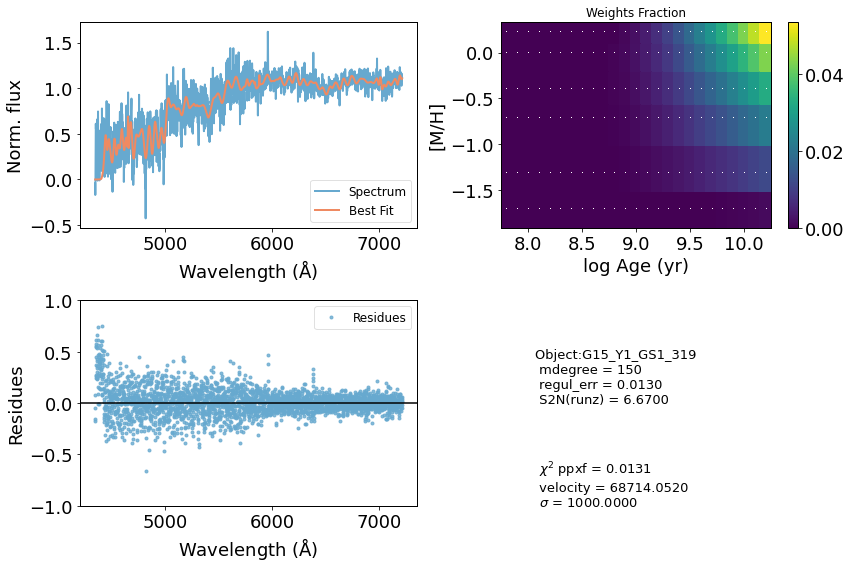

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63884      1000    -0.149     0.094
 comp.  1:     64452       387
 comp.  2:     64045         1
Gas Reddening E(B-V): 4.136
chi2/DOF: 0.05101
method = capfit; Jac calls: 30; Func calls: 4807; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.338       2.9   64452   387
Comp:  2       Unknown     0.4553       2.9   64045     1
Comp:  2       Unknown     0.3083       2.9   64045     1
Comp:  2       Unknown     0.5126       2.2   64045     1
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.08
M/L_r: 0.1587
Current $\chi^2$: 0.0510
Elapsed time in PPXF: 21.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


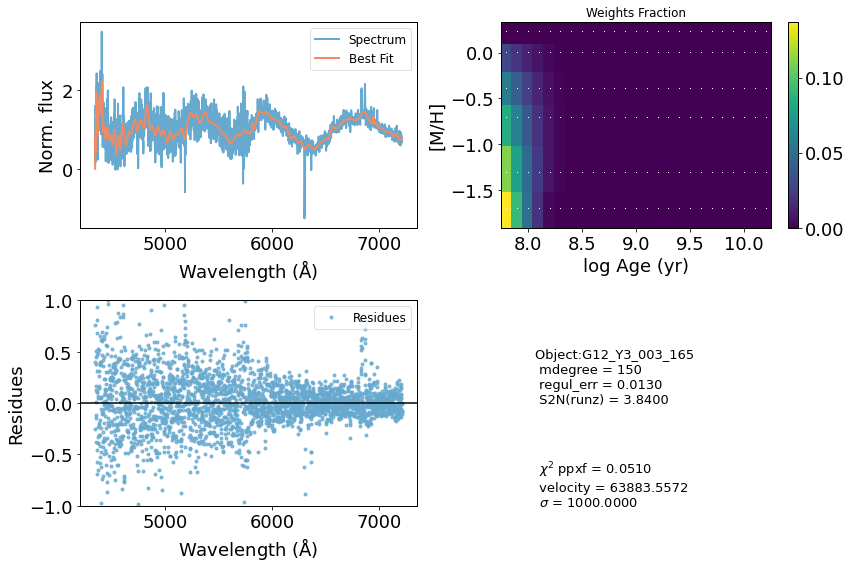

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49343      1000     0.300     0.300
 comp.  1:     47135       153
 comp.  2:     47979       153
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.07504
method = capfit; Jac calls: 17; Func calls: 2724; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2284       1.9   47135   153
Comp:  2       Unknown     0.3842   5.5e+02   47979   153
Comp:  2       Unknown          0   5.6e+02   47979   153
Comp:  2       Unknown     0.2314         4   47979   153
Comp:  2       Unknown    0.00539       2.5   47979   153
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.021
Current $\chi^2$: 0.0750
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


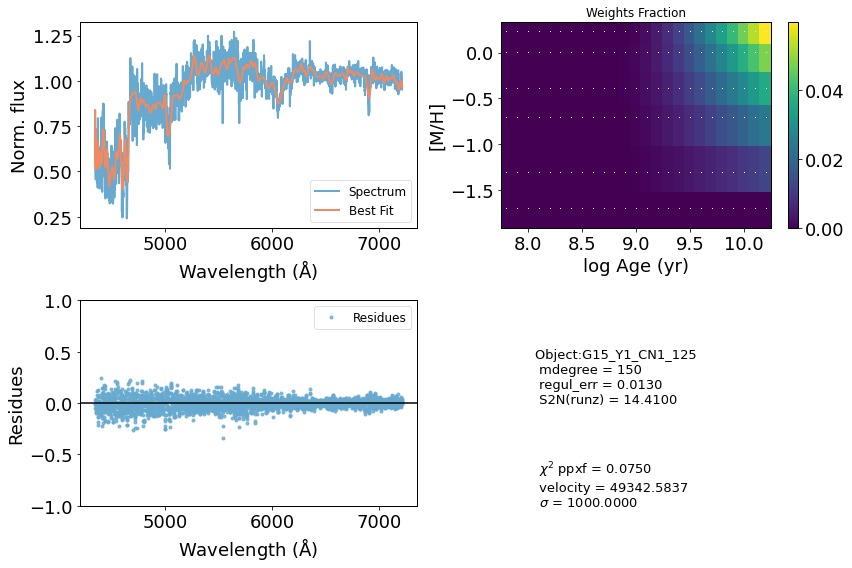

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35052       180     0.000     0.000
 comp.  1:     35052       180
 comp.  2:     35052       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2106
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  66 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.621       4.5   35052   180
Comp:  2       Unknown     0.3227       4.1   35052   180
Comp:  2       Unknown          0       3.3   35052   180
Comp:  2       Unknown     0.9416       3.1   35052   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.787
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.787
M/L_r: 2.409
Current $\chi^2$: 0.2106
Elapsed time in PPXF: 1.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


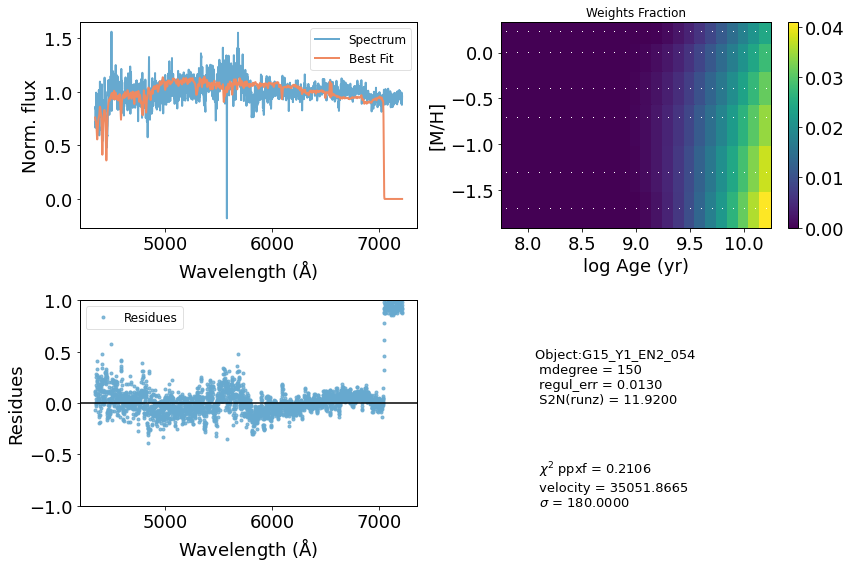

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41373      1000     0.287     0.300
 comp.  1:     40201       369
 comp.  2:     39846       774
Gas Reddening E(B-V): 5.499
chi2/DOF: 0.1697
method = capfit; Jac calls: 20; Func calls: 3205; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.134       3.1   40201   369
Comp:  2       Unknown      1.858         8   39846   774
Comp:  2       Unknown      2.011         6   39846   774
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.978
Current $\chi^2$: 0.1697
Elapsed time in PPXF: 20.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


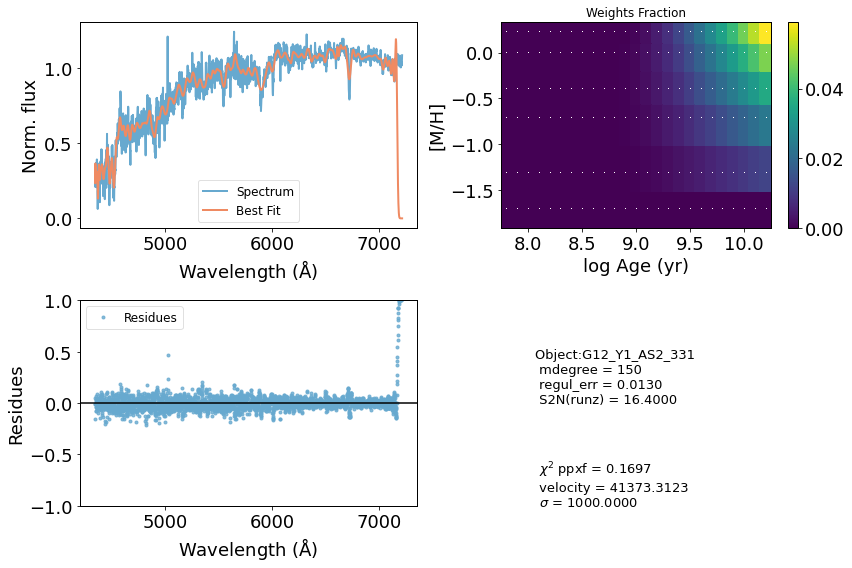

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51800      1000     0.300     0.300
 comp.  1:     51041      1000
 comp.  2:     50053        83
Gas Reddening E(B-V): 6.112
chi2/DOF: 0.09105
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.31       5.6   51041  1000
Comp:  2       Unknown          0       3.3   50053    83
Comp:  2       Unknown     0.4624       4.1   50053    83
Comp:  2       Unknown          0       3.3   50053    83
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.122
Current $\chi^2$: 0.0910
Elapsed time in PPXF: 12.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


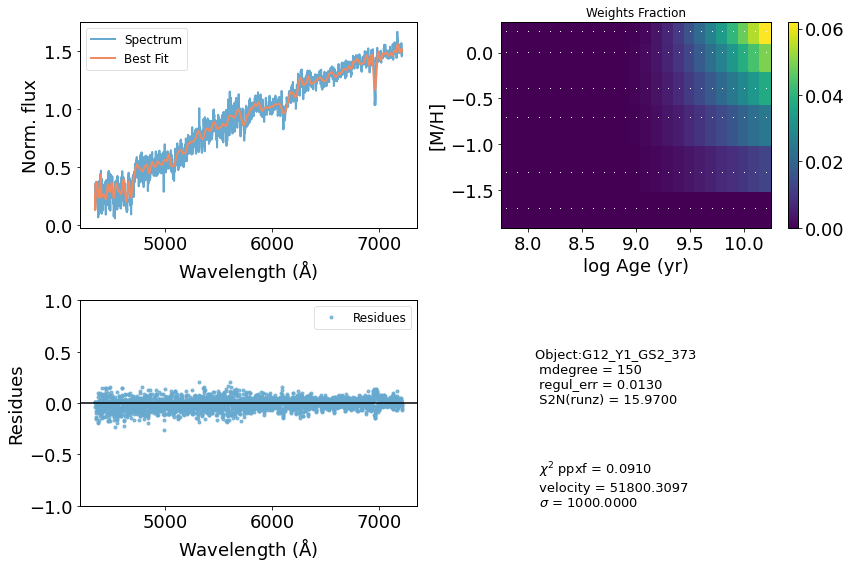

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56053      1000     0.300     0.300
 comp.  1:     54983      1000
 comp.  2:     54558       269
Gas Reddening E(B-V): 6.385
chi2/DOF: 0.03425
method = capfit; Jac calls: 20; Func calls: 3207; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.94       4.4   54983  1000
Comp:  2       Unknown      4.867         7   54558   269
Comp:  2       Unknown     0.2047       9.2   54558   269
Comp:  2       Unknown      1.844         6   54558   269
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.201
Current $\chi^2$: 0.0343
Elapsed time in PPXF: 20.29 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


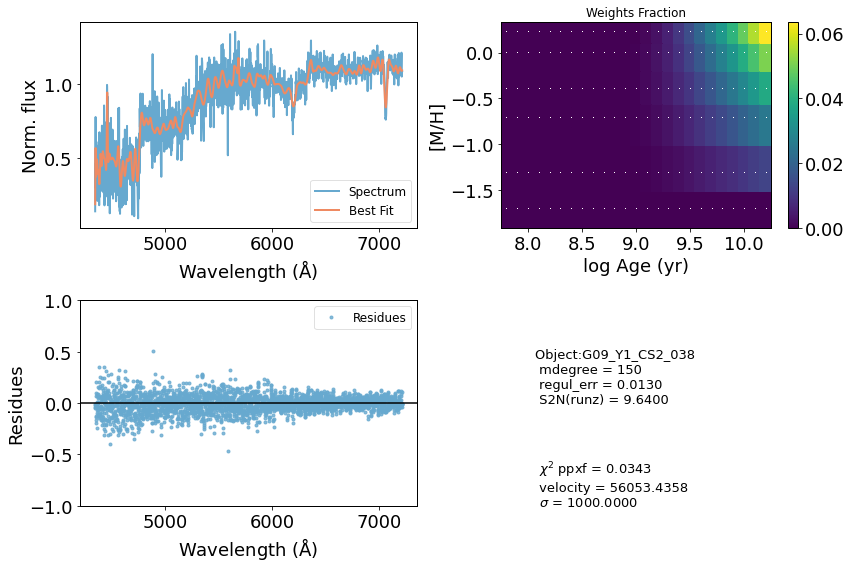

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49529      1000     0.300     0.300
 comp.  1:     47514        76
 comp.  2:     47099       186
Gas Reddening E(B-V): 5.081
chi2/DOF: 0.08558
method = capfit; Jac calls: 12; Func calls: 1926; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2118       1.6   47514    76
Comp:  2       Unknown          0       6.6   47099   186
Comp:  2       Unknown          0       6.7   47099   186
Comp:  2       Unknown          0       4.5   47099   186
Comp:  2       Unknown      1.008       3.4   47099   186
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.984
Current $\chi^2$: 0.0856
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


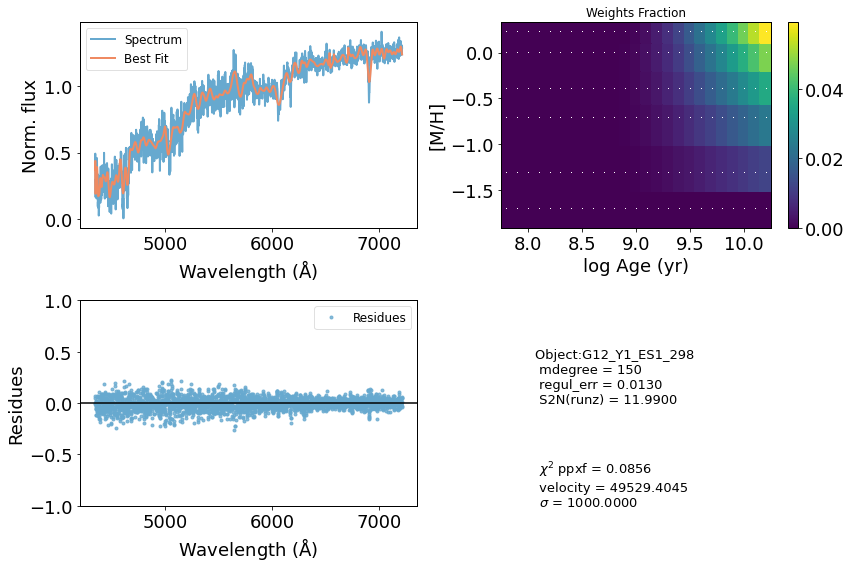

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48432      1000     0.226     0.300
 comp.  1:     46423       389
 comp.  2:     46619       129
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08793
method = capfit; Jac calls: 23; Func calls: 3684; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.5   46423   389
Comp:  2       Unknown      3.978       5.4   46619   129
Comp:  2       Unknown      1.941       7.1   46619   129
Comp:  2       Unknown          0       2.2   46619   129
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.012
Current $\chi^2$: 0.0879
Elapsed time in PPXF: 23.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


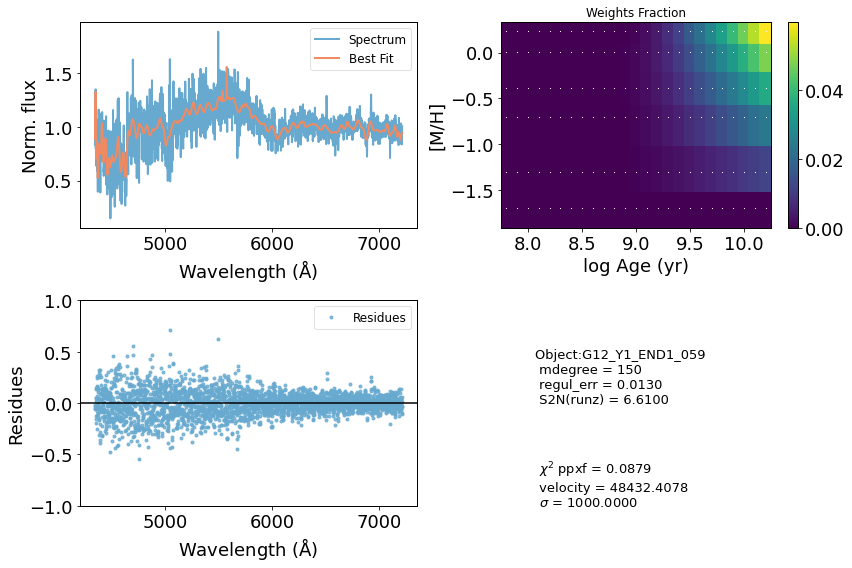

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44368      1000     0.300     0.300
 comp.  1:     43175       313
 comp.  2:     42316         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1267
method = capfit; Jac calls: 13; Func calls: 2085; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1858       4.9   43175   313
Comp:  2       Unknown     0.1941       2.3   42316     1
Comp:  2       Unknown     0.0548       1.3   42316     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.974
Current $\chi^2$: 0.1267
Elapsed time in PPXF: 13.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


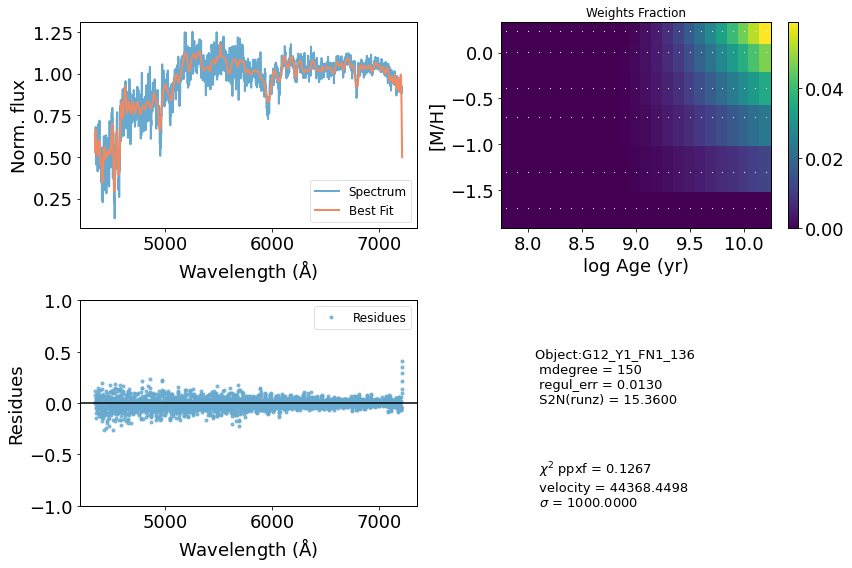

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36112      1000     0.300     0.300
 comp.  1:     34406       167
 comp.  2:     34475       428
Gas Reddening E(B-V): 0.436
chi2/DOF: 0.2666
method = capfit; Jac calls: 17; Func calls: 2726; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6589       3.4   34406   167
Comp:  2       Unknown          0       5.9   34475   428
Comp:  2       Unknown     0.3121       4.8   34475   428
Comp:  2       Unknown      2.592       4.3   34475   428
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.961
Current $\chi^2$: 0.2666
Elapsed time in PPXF: 17.27 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


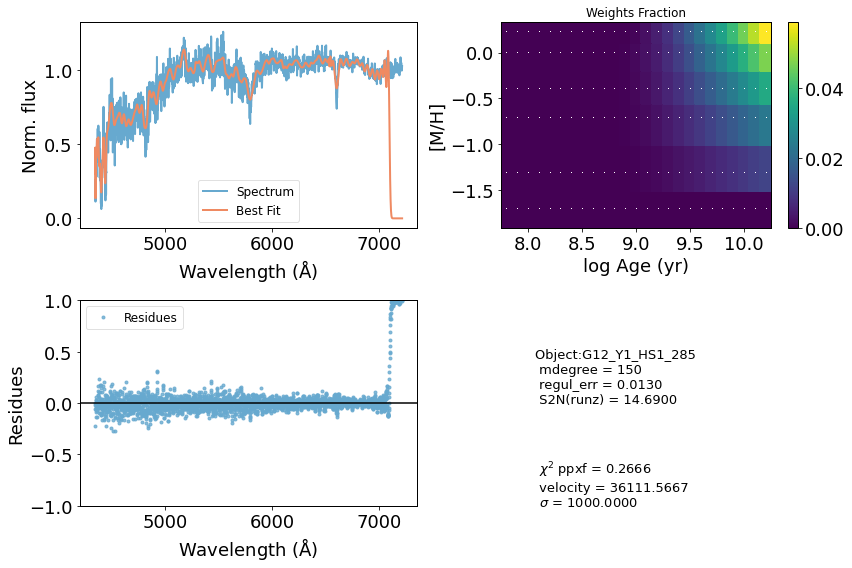

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37186       180     0.000     0.000
 comp.  1:     37186       180
 comp.  2:     37186       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4202
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.642       3.9   37186   180
Comp:  2       Unknown     0.8365       4.6   37186   180
Comp:  2       Unknown     0.1708       2.5   37186   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: -0.197
M/L_r: 3.535
Current $\chi^2$: 0.4202
Elapsed time in PPXF: 1.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


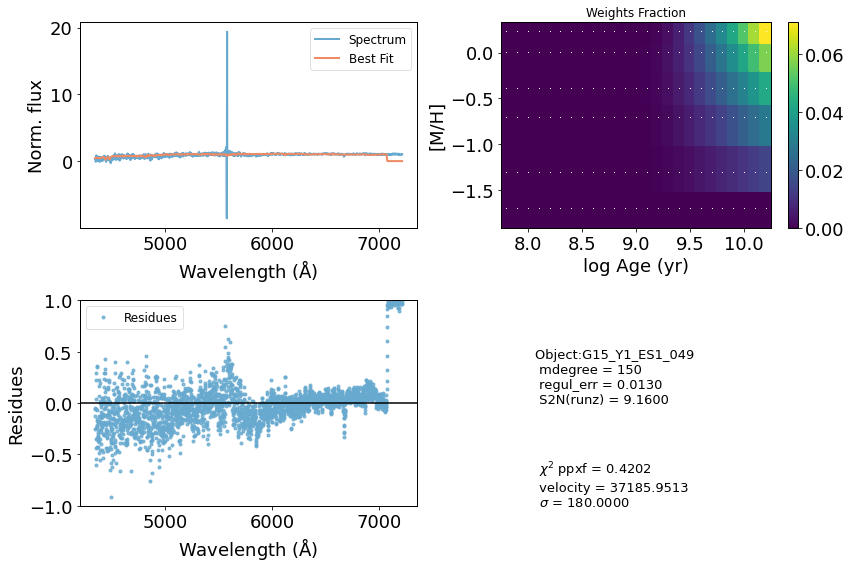

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67176      1000    -0.107     0.158
 comp.  1:     69263       228
 comp.  2:     69130        94
Gas Reddening E(B-V): 0.055
chi2/DOF: 0.002801
method = capfit; Jac calls: 54; Func calls: 8644; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  95 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.3   69263   228
Comp:  2       Unknown          0       3.2   69130    94
Comp:  2       Unknown          0       3.1   69130    94
Comp:  2       Unknown     0.1761       3.9   69130    94
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.06
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.06
M/L_r: 1.238
Current $\chi^2$: 0.0028
Elapsed time in PPXF: 57.26 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


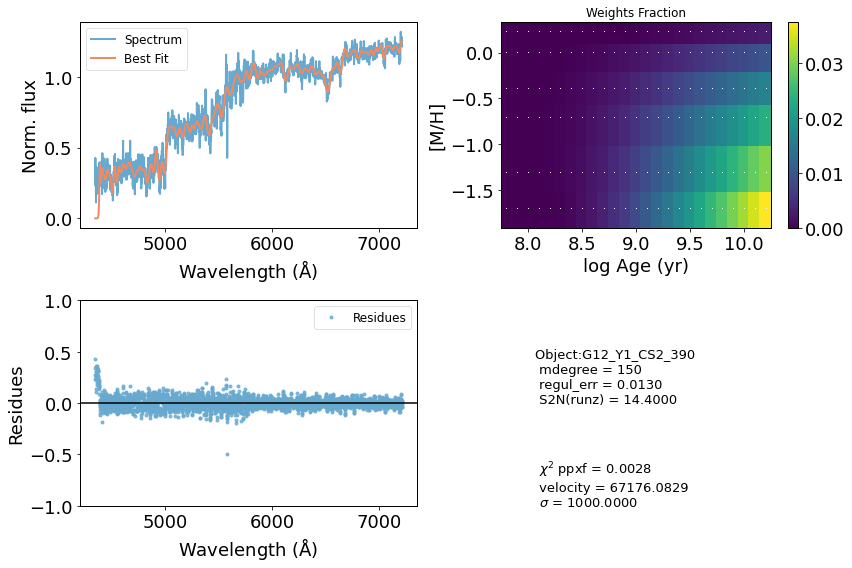

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64057      1000    -0.042     0.080
 comp.  1:     65535       245
 comp.  2:     65998       322
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004034
method = capfit; Jac calls: 19; Func calls: 3043; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  81 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.8   65535   245
Comp:  2       Unknown          0        13   65998   322
Comp:  2       Unknown          0        13   65998   322
Comp:  2       Unknown      1.345       5.3   65998   322
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.319
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.319
M/L_r: 2.285
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 19.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


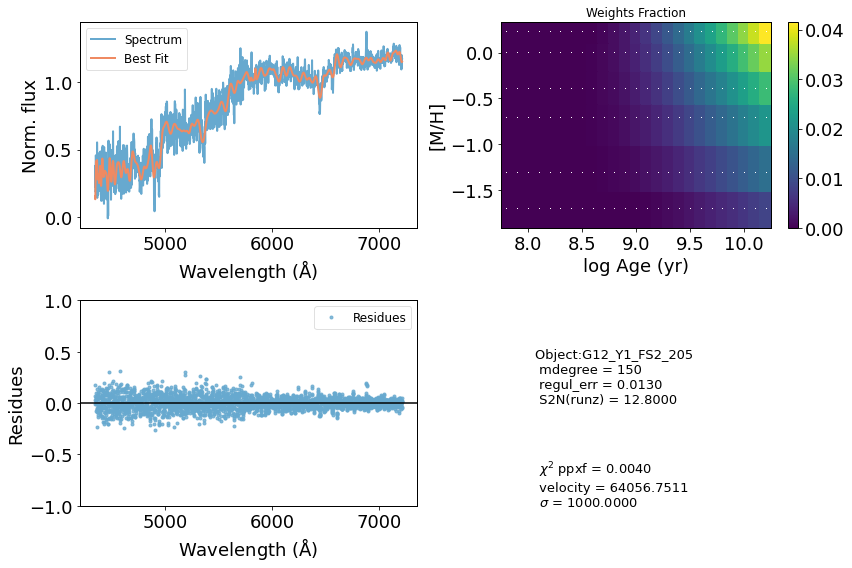

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63327       875    -0.133    -0.131
 comp.  1:     64553        39
 comp.  2:     65275       271
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004136
method = capfit; Jac calls: 11; Func calls: 1768; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3518       2.7   64553    39
Comp:  2       Unknown     0.1189       8.7   65275   271
Comp:  2       Unknown          0       8.6   65275   271
Comp:  2       Unknown     0.7718       5.4   65275   271
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.219
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.219
M/L_r: 2.55
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 11.25 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


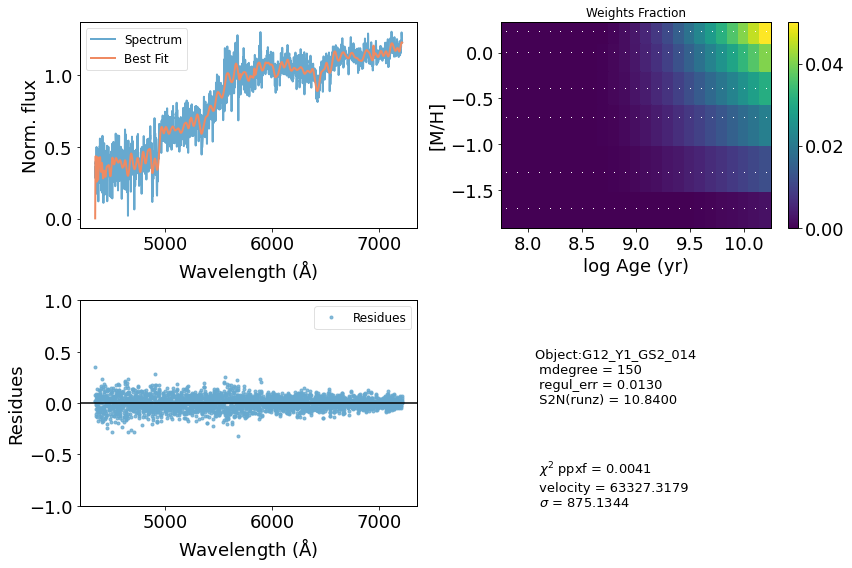

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50076      1000     0.300     0.300
 comp.  1:     48823       374
 comp.  2:     48072       219
Gas Reddening E(B-V): 7.873
chi2/DOF: 0.08846
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6069       2.5   48823   374
Comp:  2       Unknown      10.14       8.6   48072   219
Comp:  2       Unknown      19.23        16   48072   219
Comp:  2       Unknown          0       4.4   48072   219
Comp:  2       Unknown     0.5241       2.8   48072   219
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.085
Current $\chi^2$: 0.0885
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


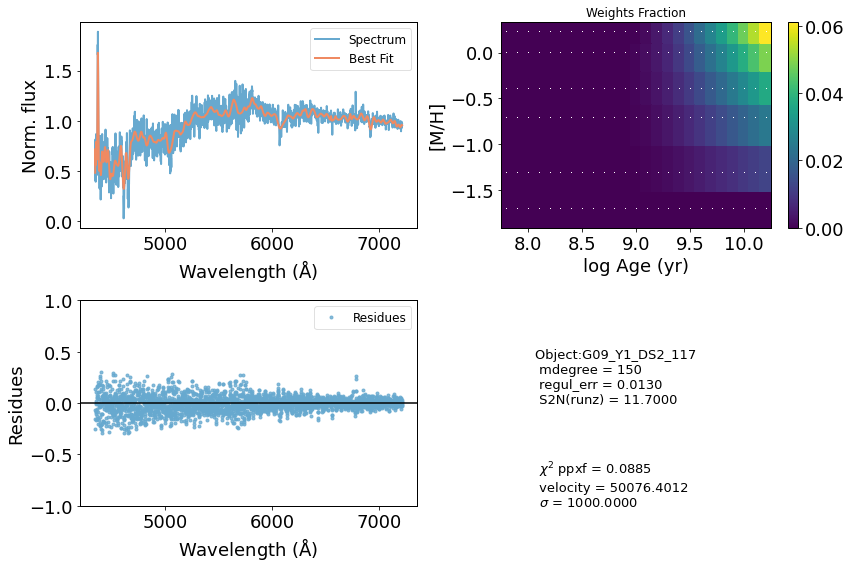

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52290      1000     0.300     0.300
 comp.  1:     50331        15
 comp.  2:     50391        47
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0408
method = capfit; Jac calls: 13; Func calls: 2087; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2014       2.2   50331    15
Comp:  2       Unknown     0.2097       2.8   50391    47
Comp:  2       Unknown          0       2.8   50391    47
Comp:  2       Unknown     0.4183         3   50391    47
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.029
Current $\chi^2$: 0.0408
Elapsed time in PPXF: 13.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


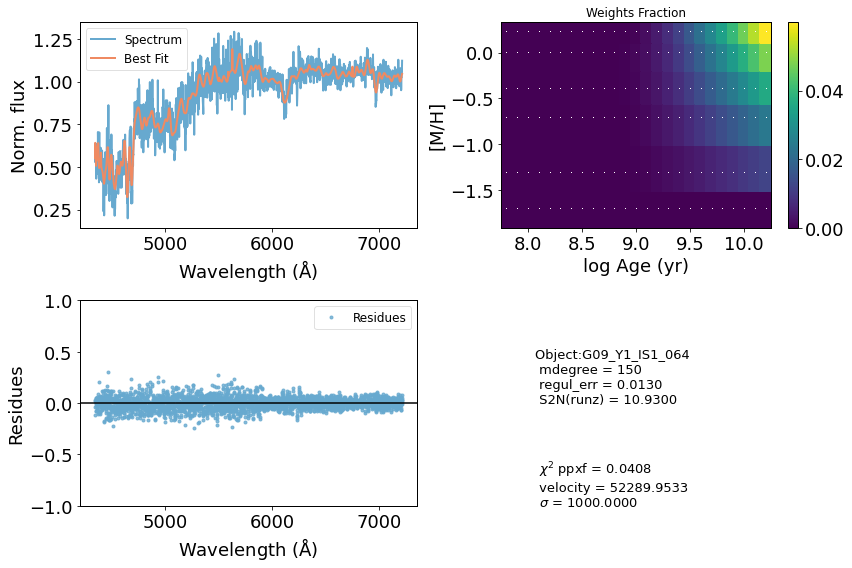

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64656      1000    -0.175     0.093
 comp.  1:     64860      1000
 comp.  2:     63919        63
Gas Reddening E(B-V): 2.709
chi2/DOF: 0.004056
method = capfit; Jac calls: 17; Func calls: 2726; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.84       6.5   64860  1000
Comp:  2       Unknown          0       2.5   63919    63
Comp:  2       Unknown          0       2.5   63919    63
Comp:  2       Unknown     0.5102       3.1   63919    63
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.09
M/L_r: 1.255
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 17.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


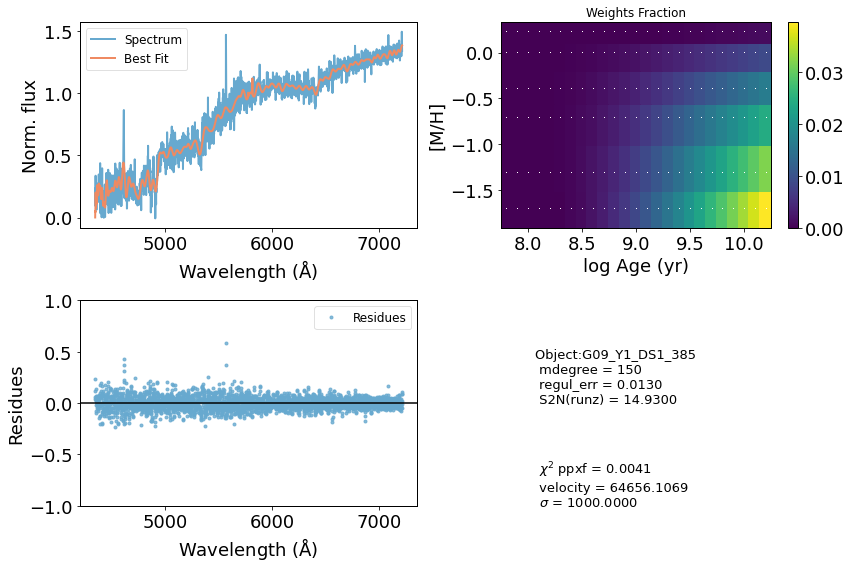

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60407       748     0.039     0.125
 comp.  1:     60031         1
 comp.  2:     59133      1000
Gas Reddening E(B-V): 0.210
chi2/DOF: 0.01402
method = capfit; Jac calls: 10; Func calls: 1607; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   60031     1
Comp:  2       Unknown          0        57   59133  1000
Comp:  2       Unknown          0        57   59133  1000
Comp:  2       Unknown      10.37       9.6   59133  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.207
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.207
M/L_r: 2.728
Current $\chi^2$: 0.0140
Elapsed time in PPXF: 9.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


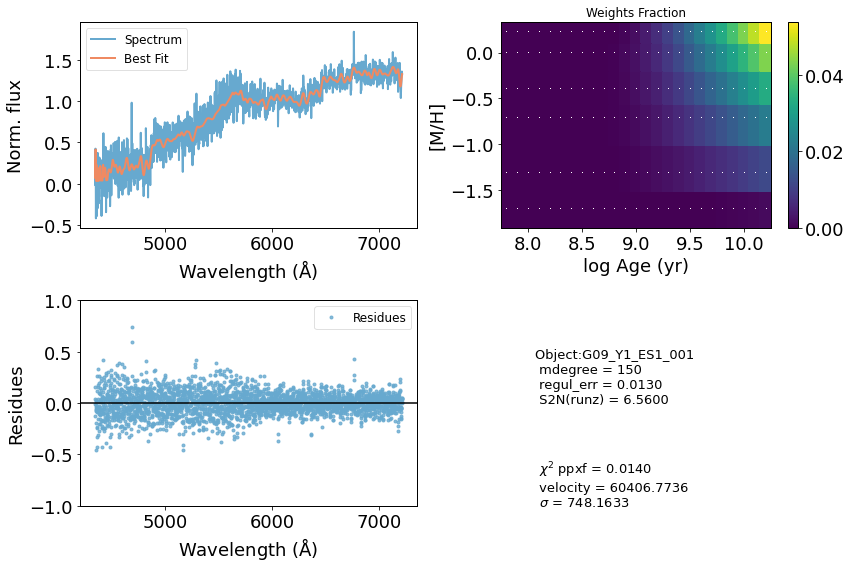

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37981      1000     0.222     0.300
 comp.  1:     37757       976
 comp.  2:     35992         1
Gas Reddening E(B-V): 4.715
chi2/DOF: 0.3509
method = capfit; Jac calls: 29; Func calls: 4643; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.87       5.1   37757   976
Comp:  2       Unknown          0       2.1   35992     1
Comp:  2       Unknown          0       1.5   35992     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.104
Current $\chi^2$: 0.3509
Elapsed time in PPXF: 29.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


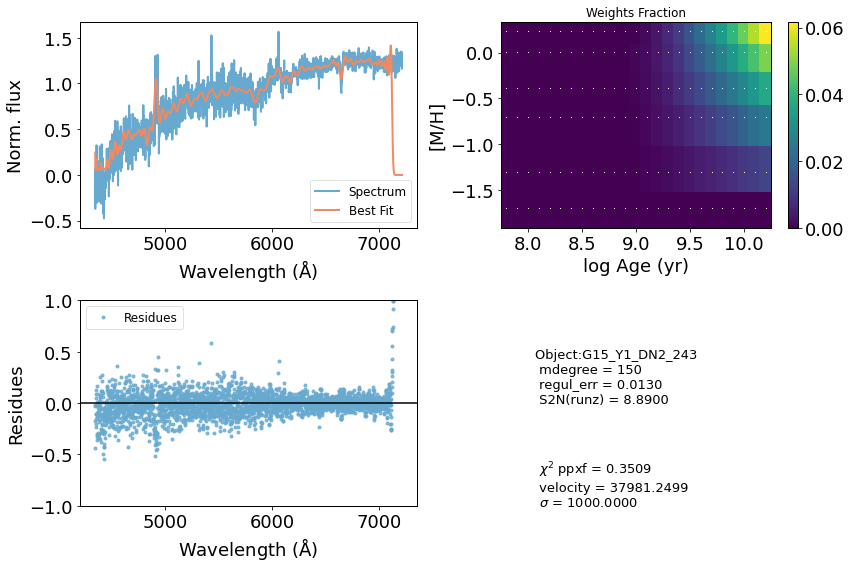

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35991      1000     0.300     0.300
 comp.  1:     34503       242
 comp.  2:     34655        91
Gas Reddening E(B-V): 1.366
chi2/DOF: 0.2338
method = capfit; Jac calls: 17; Func calls: 2727; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.163       3.3   34503   242
Comp:  2       Unknown          0         3   34655    91
Comp:  2       Unknown     0.1452       2.7   34655    91
Comp:  2       Unknown     0.1161       2.1   34655    91
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.881
Current $\chi^2$: 0.2338
Elapsed time in PPXF: 17.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


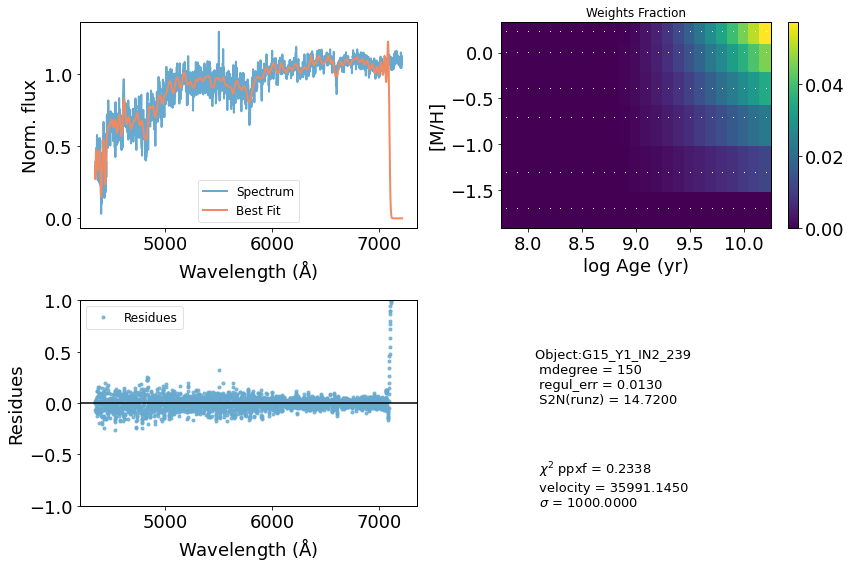

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39516         1     0.000     0.001
 comp.  1:     39006       151
 comp.  2:     38458      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.4075
method = capfit; Jac calls: 10; Func calls: 1605; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.808       1.6   39006   151
Comp:  2       Unknown          0       8.2   38458  1000
Comp:  2       Unknown      13.57       5.4   38458  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.2
Weighted <[M/H]>: -1.06
Weighted <logAge> [yr]: 9.2
Weighted <[M/H]>: -1.06
M/L_r: 0.5947
Current $\chi^2$: 0.4075
Elapsed time in PPXF: 9.98 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


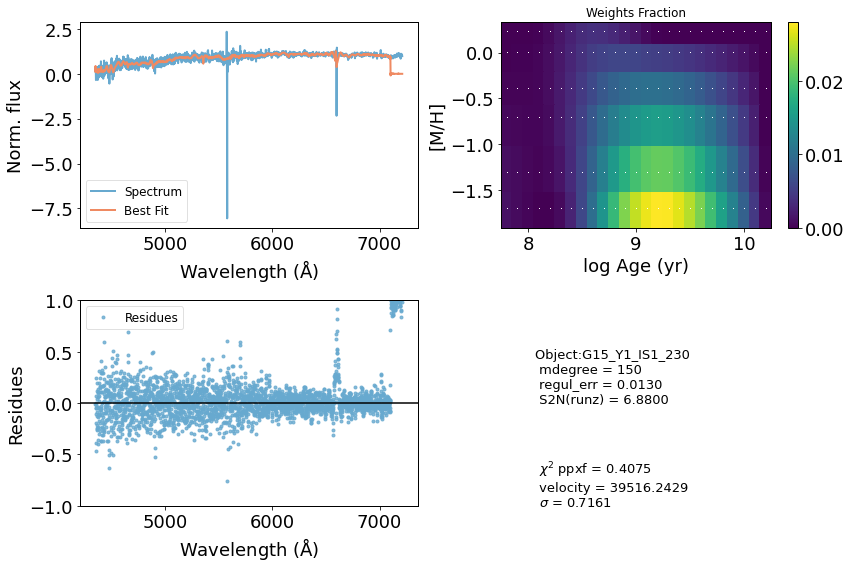

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47707      1000     0.300     0.300
 comp.  1:     45760       244
 comp.  2:     45668       174
Gas Reddening E(B-V): 0.597
chi2/DOF: 0.07617
method = capfit; Jac calls: 19; Func calls: 3045; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   45760   244
Comp:  2       Unknown     0.7142       4.3   45668   174
Comp:  2       Unknown          0       2.8   45668   174
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.999
Current $\chi^2$: 0.0762
Elapsed time in PPXF: 18.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


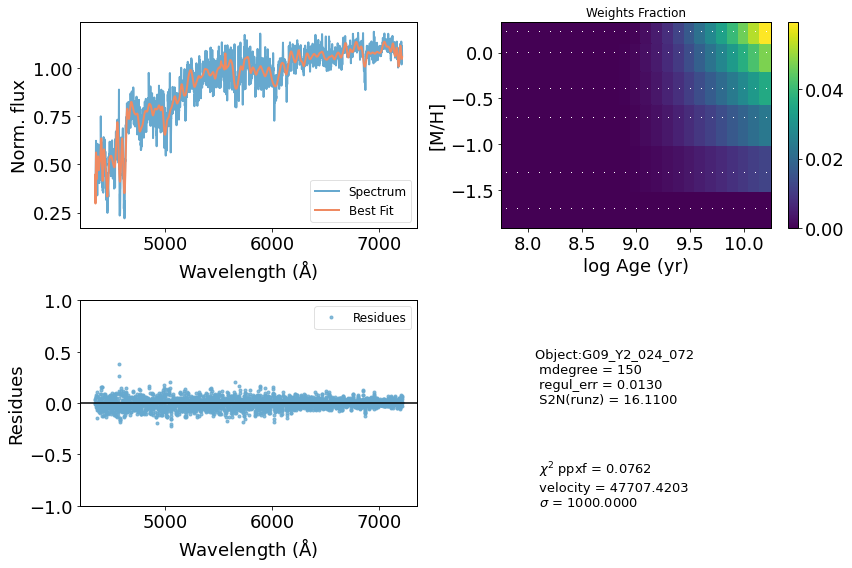

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49381      1000     0.300     0.300
 comp.  1:     47343        65
 comp.  2:     47296         2
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.1094
method = capfit; Jac calls: 21; Func calls: 3368; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.332       1.2   47343    65
Comp:  2       Unknown    0.02494      0.21   47296     2
Comp:  2       Unknown    0.04594      0.34   47296     2
Comp:  2       Unknown    0.08339       0.8   47296     2
Comp:  2       Unknown          0       1.2   47296     2
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.027
Current $\chi^2$: 0.1094
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


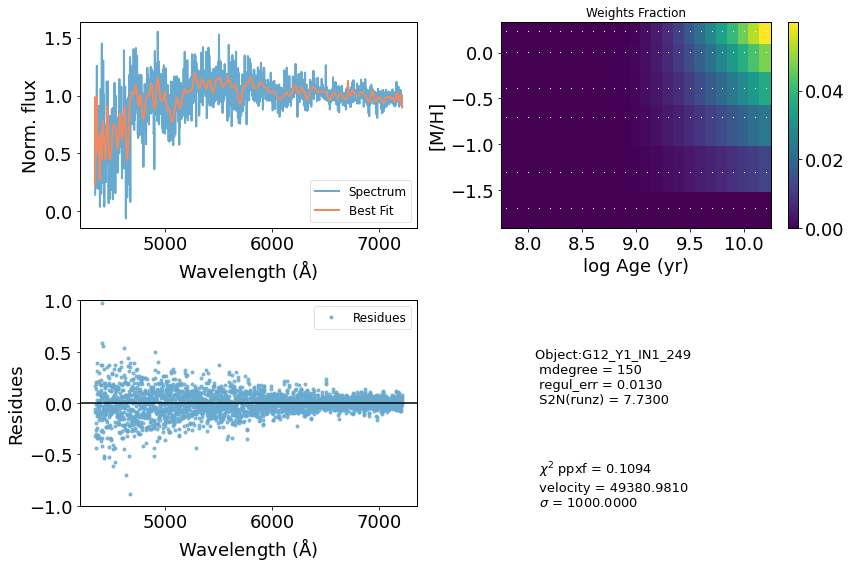

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45949      1000     0.300     0.300
 comp.  1:     44039       299
 comp.  2:     43652       521
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1044
method = capfit; Jac calls: 14; Func calls: 2244; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.2   44039   299
Comp:  2       Unknown     0.8607       6.9   43652   521
Comp:  2       Unknown      1.419       4.5   43652   521
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.982
Current $\chi^2$: 0.1044
Elapsed time in PPXF: 13.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


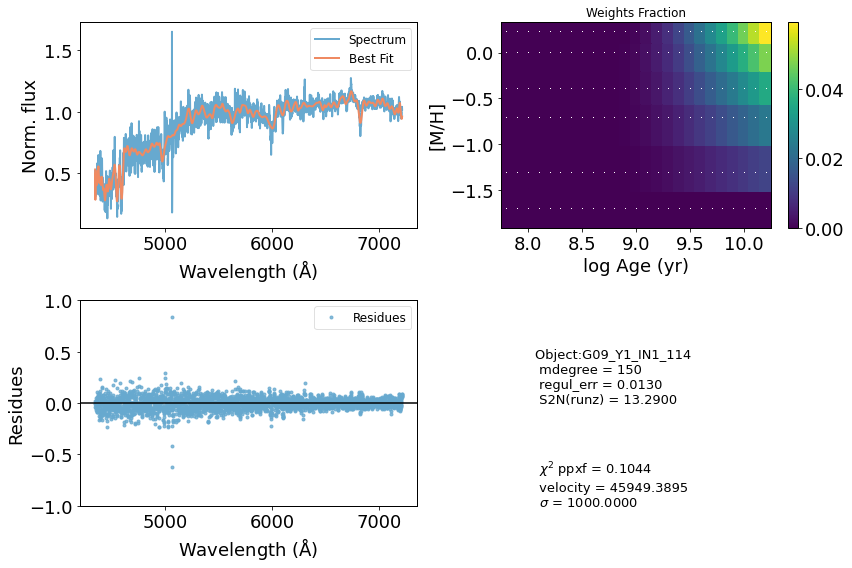

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54122      1000     0.300     0.300
 comp.  1:     52417        24
 comp.  2:     52352       185
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.04043
method = capfit; Jac calls: 14; Func calls: 2248; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown   0.006781       2.1   52417    24
Comp:  2       Unknown          0       6.8   52352   185
Comp:  2       Unknown      2.456       6.8   52352   185
Comp:  2       Unknown     0.1696       4.5   52352   185
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.056
Current $\chi^2$: 0.0404
Elapsed time in PPXF: 14.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


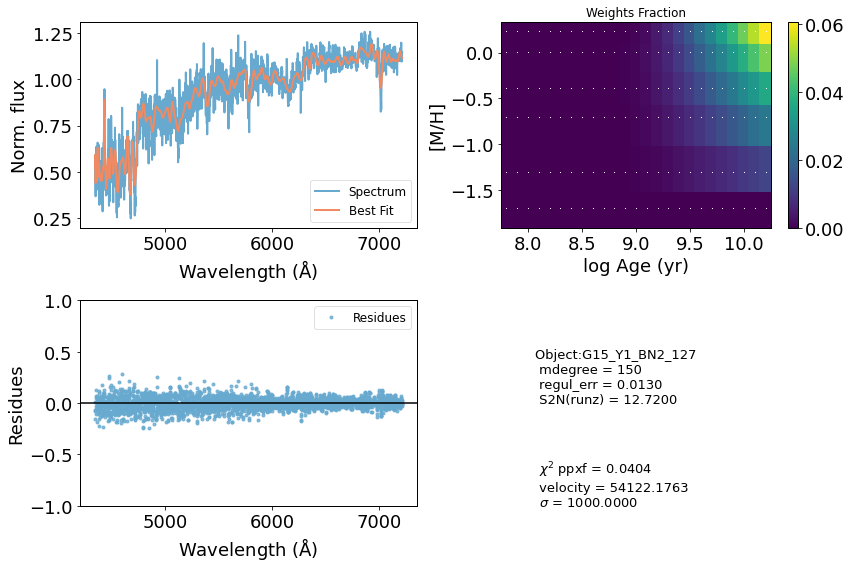

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35484       180     0.000     0.000
 comp.  1:     35484       180
 comp.  2:     35484       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2515
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  69 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.728       4.1   35484   180
Comp:  2       Unknown     0.4455       3.9   35484   180
Comp:  2       Unknown     0.6864       2.7   35484   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.863
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.863
M/L_r: 2.315
Current $\chi^2$: 0.2515
Elapsed time in PPXF: 1.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


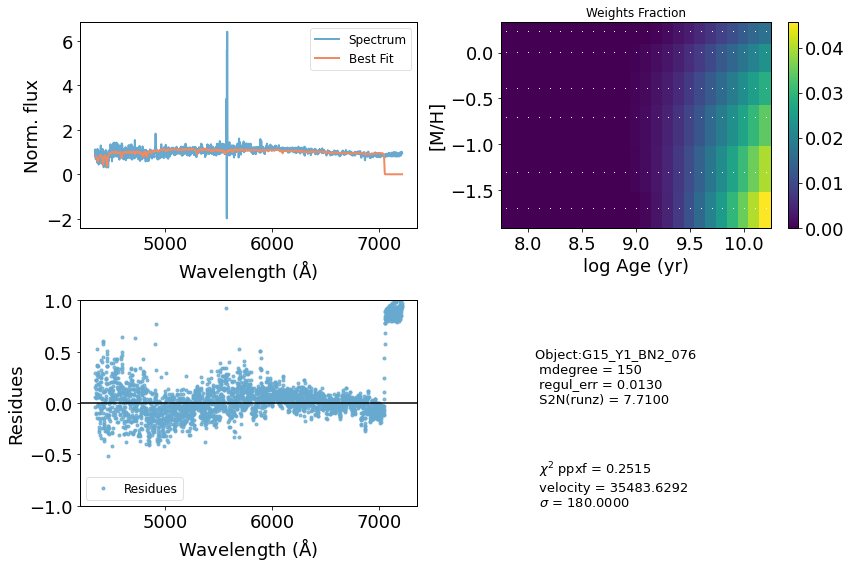

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48976      1000     0.233     0.300
 comp.  1:     47031        33
 comp.  2:     47223       695
Gas Reddening E(B-V): 8.630
chi2/DOF: 0.07849
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.166       1.2   47031    33
Comp:  2       Unknown      1.456        58   47223   695
Comp:  2       Unknown          0        66   47223   695
Comp:  2       Unknown      6.994       9.1   47223   695
Comp:  2       Unknown     0.0508       5.7   47223   695
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.945
Current $\chi^2$: 0.0785
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


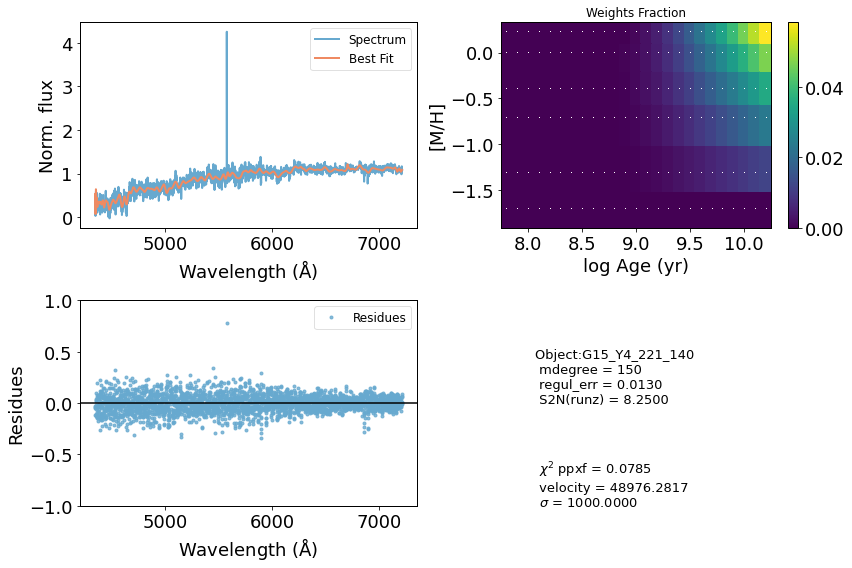

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24175       180     0.000     0.000
 comp.  1:     24175       180
 comp.  2:     24175       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4118
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.276       3.8   24175   180
Comp:  2       Unknown     0.3583       1.9   24175   180
Comp:  2       Unknown     0.2821       1.9   24175   180
Comp:  2       Unknown          0       4.5   24175   180
Comp:  2       Unknown       1.25       2.9   24175   180
Comp:  2       Unknown     0.1948       2.5   24175   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.464
Weighted <logAge> [yr]: 9.87
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


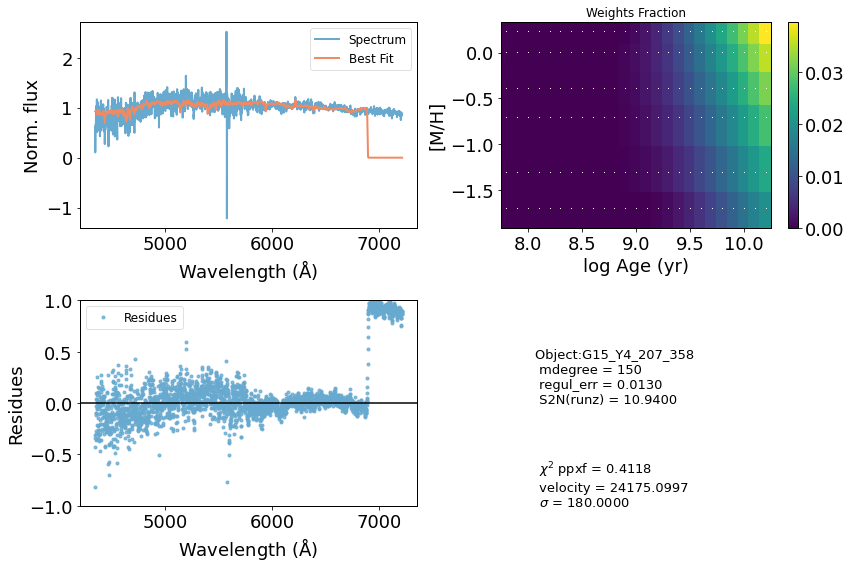

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47978      1000     0.300     0.300
 comp.  1:     45947         1
 comp.  2:     46001       135
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1096
method = capfit; Jac calls: 15; Func calls: 2408; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1221         2   45947     1
Comp:  2       Unknown     0.5782       3.7   46001   135
Comp:  2       Unknown          0       2.4   46001   135
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.06
Current $\chi^2$: 0.1096
Elapsed time in PPXF: 14.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


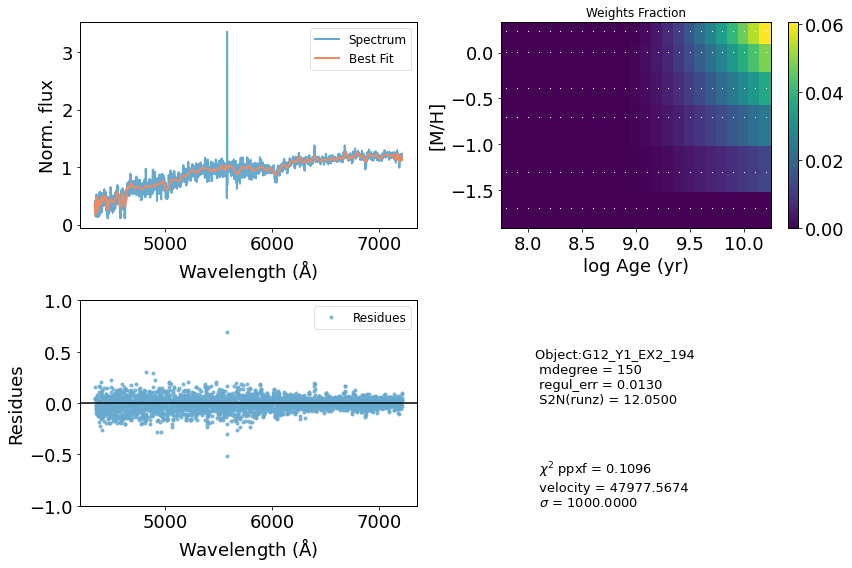

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56329      1000     0.300     0.300
 comp.  1:     54550       258
 comp.  2:     54831       199
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02233
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  56 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1542       4.5   54550   258
Comp:  2       Unknown          0       7.5   54831   199
Comp:  2       Unknown      4.839       7.7   54831   199
Comp:  2       Unknown      1.089       5.2   54831   199
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.131
Current $\chi^2$: 0.0223
Elapsed time in PPXF: 18.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


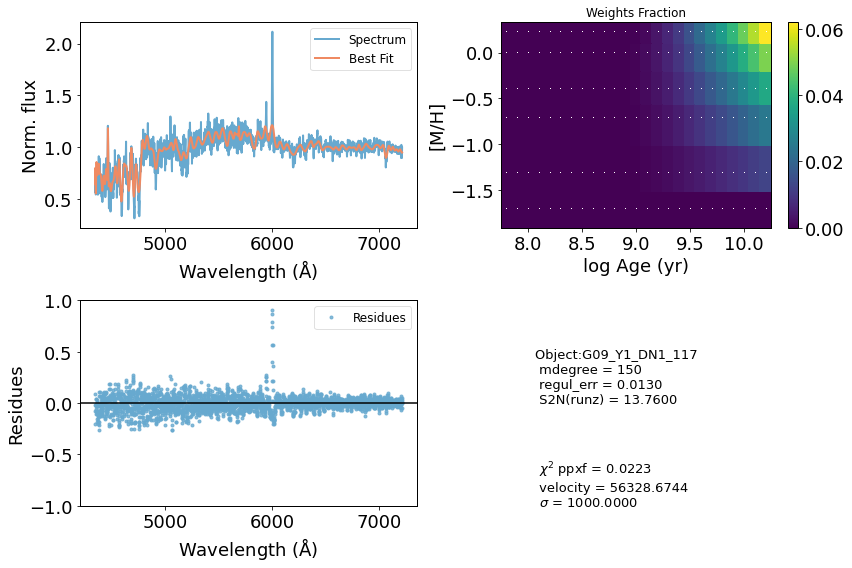

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42886      1000     0.300     0.300
 comp.  1:     40895        30
 comp.  2:     40949        67
Gas Reddening E(B-V): 9.703
chi2/DOF: 0.1879
method = capfit; Jac calls: 23; Func calls: 3689; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1013      0.96   40895    30
Comp:  2       Unknown     0.7792       2.7   40949    67
Comp:  2       Unknown          0       1.7   40949    67
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.031
Current $\chi^2$: 0.1879
Elapsed time in PPXF: 22.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


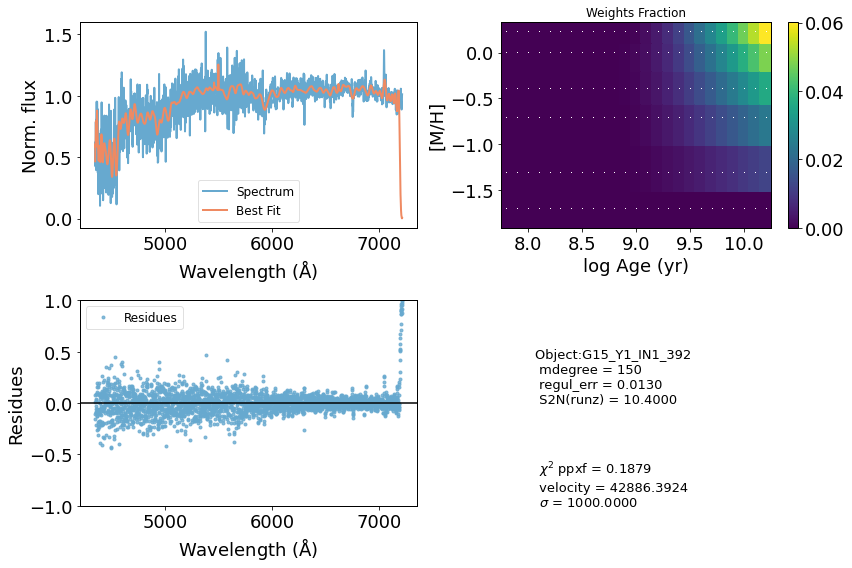

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55968      1000     0.300     0.300
 comp.  1:     55319      1000
 comp.  2:     54520       125
Gas Reddening E(B-V): 8.441
chi2/DOF: 0.03267
method = capfit; Jac calls: 25; Func calls: 4005; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.52       5.1   55319  1000
Comp:  2       Unknown          0        12   54520   125
Comp:  2       Unknown     0.3686        17   54520   125
Comp:  2       Unknown     0.3046       4.2   54520   125
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.13
Current $\chi^2$: 0.0327
Elapsed time in PPXF: 25.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


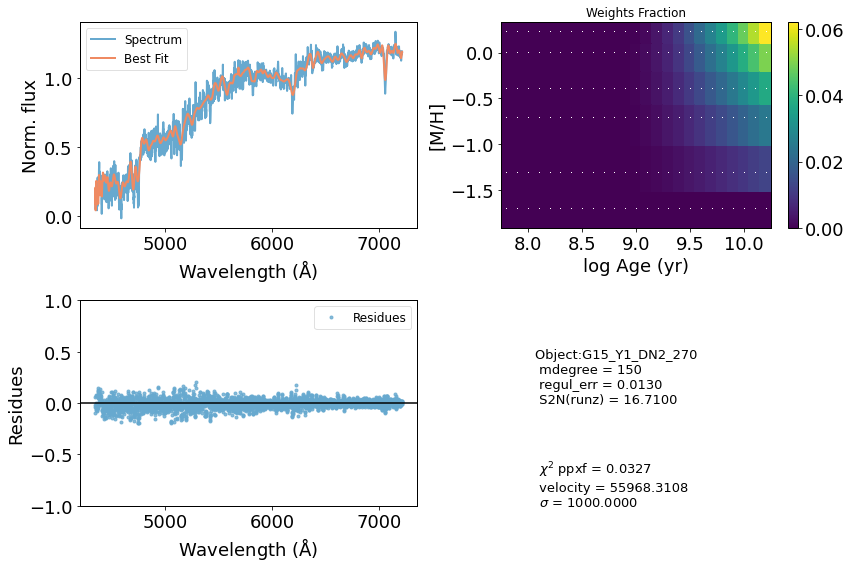

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56704      1000     0.300     0.300
 comp.  1:     54920       175
 comp.  2:     54844       427
Gas Reddening E(B-V): 0.460
chi2/DOF: 0.02829
method = capfit; Jac calls: 16; Func calls: 2567; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  56 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   54920   175
Comp:  2       Unknown          0        22   54844   427
Comp:  2       Unknown          0        22   54844   427
Comp:  2       Unknown          0       7.9   54844   427
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.253
Current $\chi^2$: 0.0283
Elapsed time in PPXF: 15.67 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


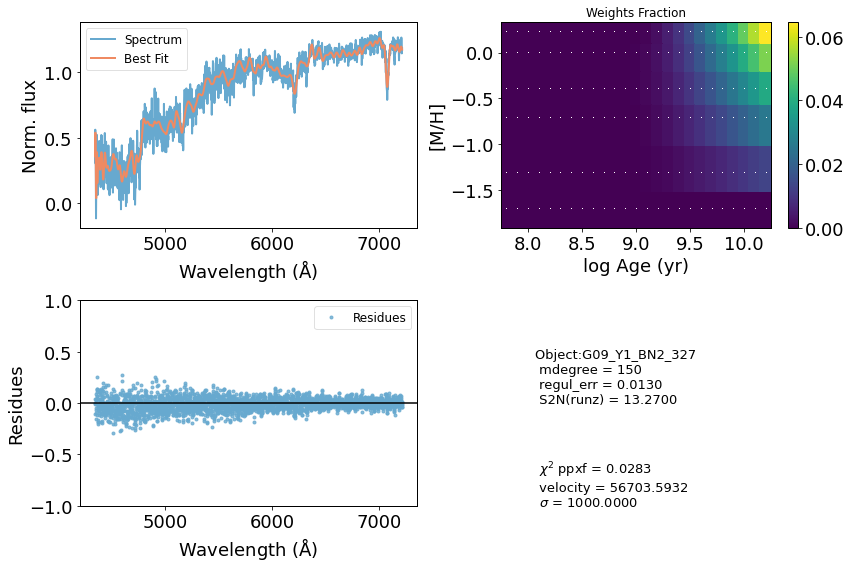

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54135      1000     0.300     0.300
 comp.  1:     52124        63
 comp.  2:     52500        69
Gas Reddening E(B-V): 6.643
chi2/DOF: 0.06069
method = capfit; Jac calls: 16; Func calls: 2563; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4731       1.1   52124    63
Comp:  2       Unknown      2.601       2.7   52500    69
Comp:  2       Unknown      3.892       4.6   52500    69
Comp:  2       Unknown          0       3.1   52500    69
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.171
Current $\chi^2$: 0.0607
Elapsed time in PPXF: 16.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


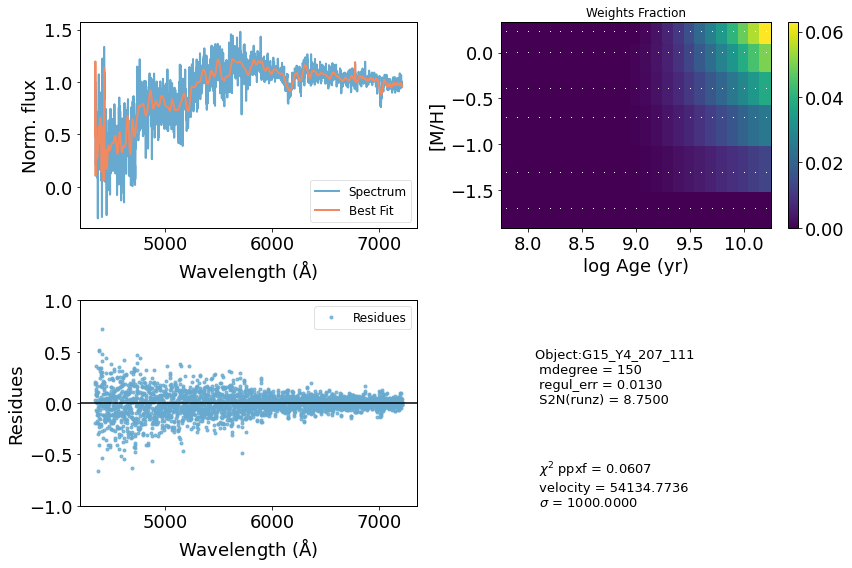

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     28333      1000     0.103     0.300
 comp.  1:     25899       575
 comp.  2:     26313       277
Gas Reddening E(B-V): 5.612
chi2/DOF: 0.3565
method = capfit; Jac calls: 19; Func calls: 3045; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.528       4.3   25899   575
Comp:  2       Unknown     0.8986       2.9   26313   277
Comp:  2       Unknown          0       2.8   26313   277
Comp:  2       Unknown     0.9496       4.9   26313   277
Comp:  2       Unknown     0.1363       3.8   26313   277
Comp:  2       Unknown          0       3.4   26313   277
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


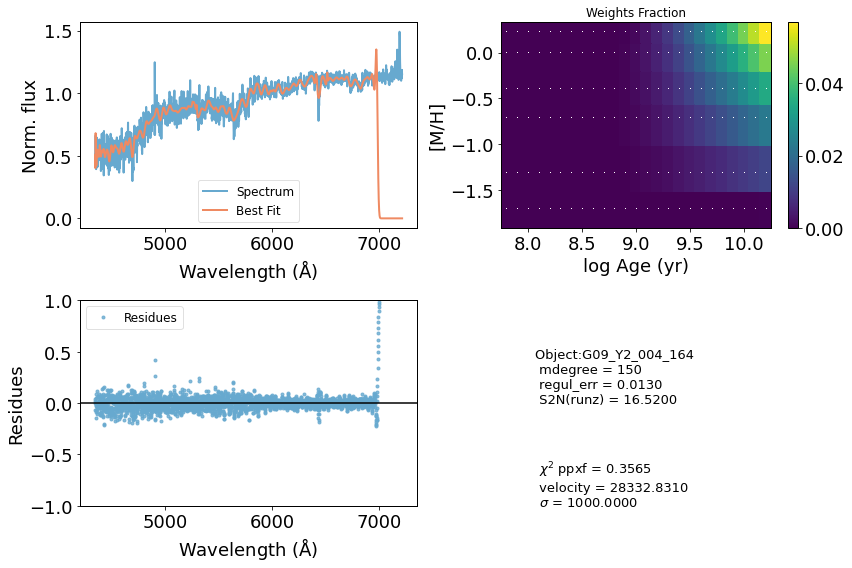

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60913       878    -0.012     0.058
 comp.  1:     60976       856
 comp.  2:     60964       185
Gas Reddening E(B-V): 1.119
chi2/DOF: 0.01638
method = capfit; Jac calls: 8; Func calls: 1289; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  26 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.721       6.3   60976   856
Comp:  2       Unknown          0       6.6   60964   185
Comp:  2       Unknown          0       6.6   60964   185
Comp:  2       Unknown          0       3.6   60964   185
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.955
Current $\chi^2$: 0.0164
Elapsed time in PPXF: 7.90 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


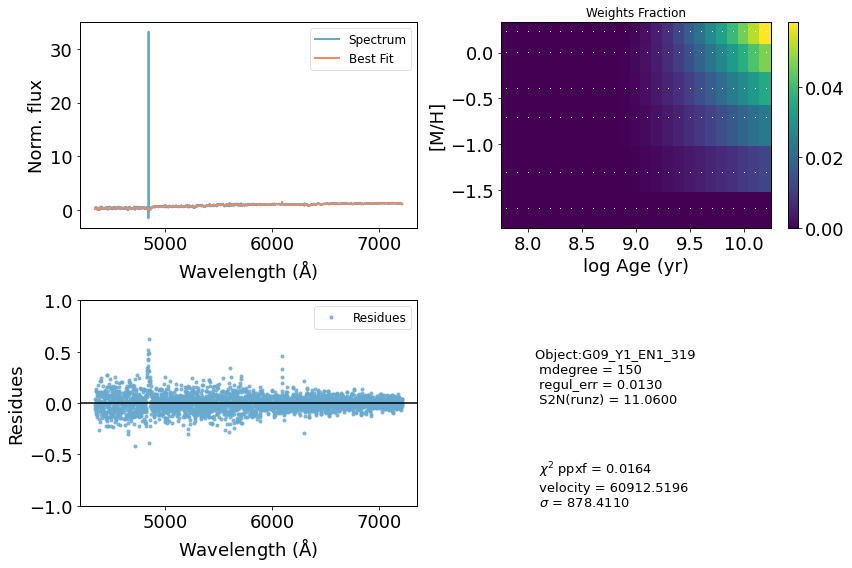

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46376      1000     0.300     0.300
 comp.  1:     44762       221
 comp.  2:     44834       162
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08889
method = capfit; Jac calls: 17; Func calls: 2726; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.7   44762   221
Comp:  2       Unknown          0       3.9   44834   162
Comp:  2       Unknown     0.6068       3.5   44834   162
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.879
Current $\chi^2$: 0.0889
Elapsed time in PPXF: 17.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


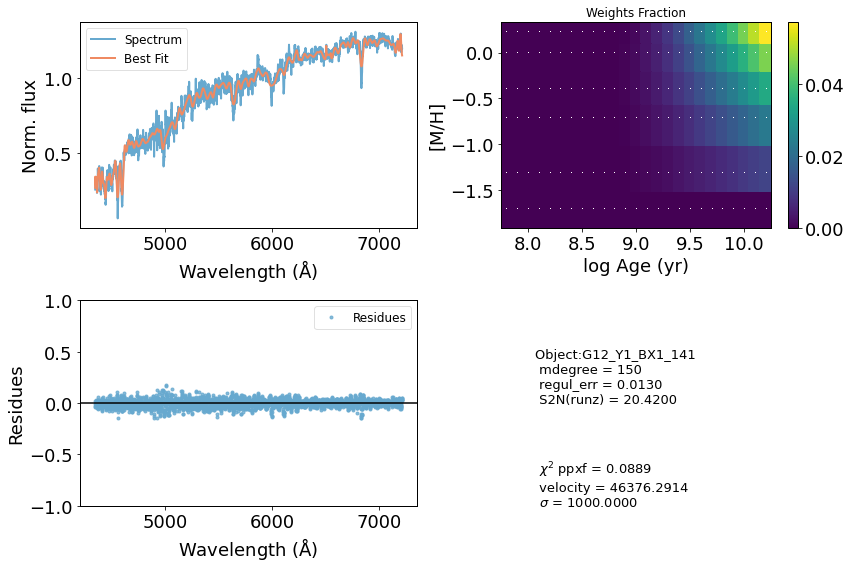

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62439       769     0.294     0.300
 comp.  1:     62777       471
 comp.  2:     63111       759
Gas Reddening E(B-V): 2.299
chi2/DOF: 19.35
method = capfit; Jac calls: 5; Func calls: 810; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.75       5.4   62777   471
Comp:  2       Unknown          0        30   63111   759
Comp:  2       Unknown          0        30   63111   759
Comp:  2       Unknown     0.2058       9.4   63111   759
---------------------------------------------------------
Weighted <logAge> [yr]: 9.97
Weighted <[M/H]>: -0.189
Weighted <logAge> [yr]: 9.97
Weighted <[M/H]>: -0.189
M/L_r: 3.884
Current $\chi^2$: 19.3475
Elapsed time in PPXF: 4.64 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


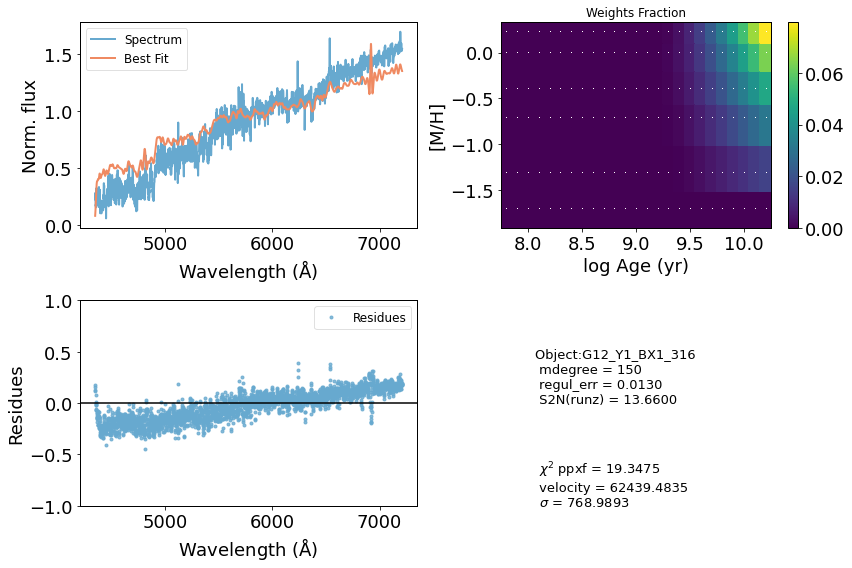

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42954      1000     0.300     0.300
 comp.  1:     40149       678
 comp.  2:     40777        51
Gas Reddening E(B-V): 0.029
chi2/DOF: 0.1644
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.876       7.5   40149   678
Comp:  2       Unknown       0.75       2.6   40777    51
Comp:  2       Unknown          0       1.6   40777    51
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.94
Current $\chi^2$: 0.1644
Elapsed time in PPXF: 14.61 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


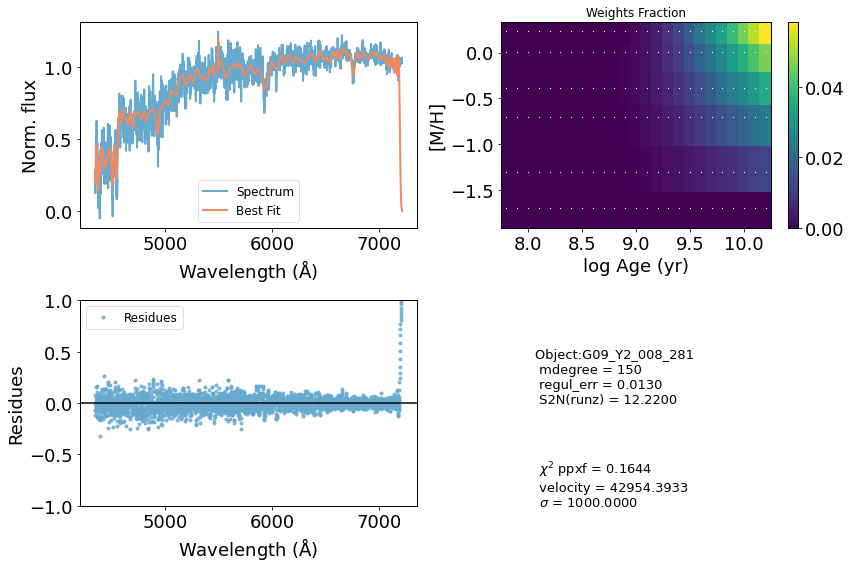

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30739      1000     0.262     0.300
 comp.  1:     29353       146
 comp.  2:     29335       730
Gas Reddening E(B-V): 1.946
chi2/DOF: 0.3221
method = capfit; Jac calls: 23; Func calls: 3683; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2559       2.5   29353   146
Comp:  2       Unknown      3.341       7.8   29335   730
Comp:  2       Unknown     0.2175       7.8   29335   730
Comp:  2       Unknown      2.583       7.8   29335   730
Comp:  2       Unknown     0.1113       5.9   29335   730
Comp:  2       Unknown      18.08       5.5   29335   730
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


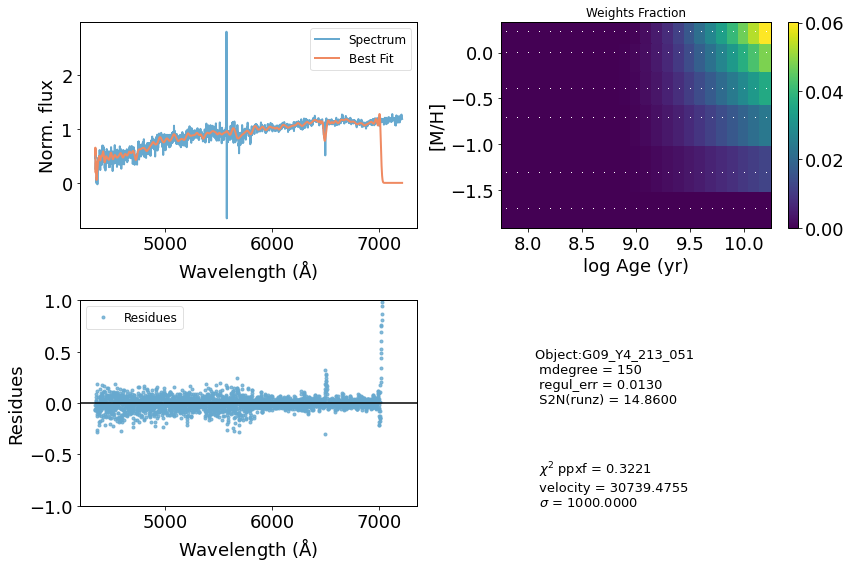

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56861      1000     0.300     0.300
 comp.  1:     55308       200
 comp.  2:     55077         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02487
method = capfit; Jac calls: 16; Func calls: 2568; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9697       4.3   55308   200
Comp:  2       Unknown          0       2.5   55077     1
Comp:  2       Unknown          0       2.4   55077     1
Comp:  2       Unknown     0.4256       3.2   55077     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.196
M/L_r: 3.246
Current $\chi^2$: 0.0249
Elapsed time in PPXF: 16.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


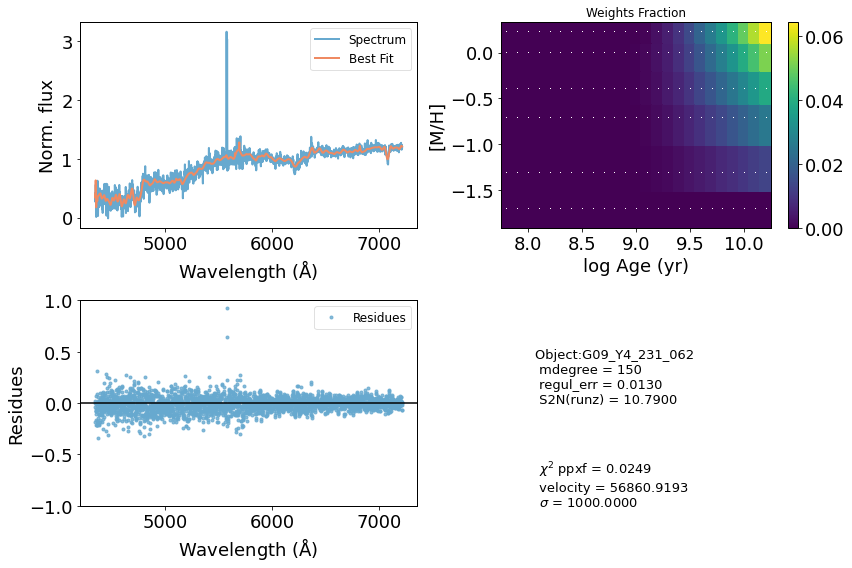

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35343      1000     0.255     0.300
 comp.  1:     33451       168
 comp.  2:     33544       392
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.2187
method = capfit; Jac calls: 24; Func calls: 3843; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4695       4.2   33451   168
Comp:  2       Unknown          0       5.7   33544   392
Comp:  2       Unknown     0.7153       4.6   33544   392
Comp:  2       Unknown      1.696       4.6   33544   392
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.959
Current $\chi^2$: 0.2187
Elapsed time in PPXF: 24.31 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


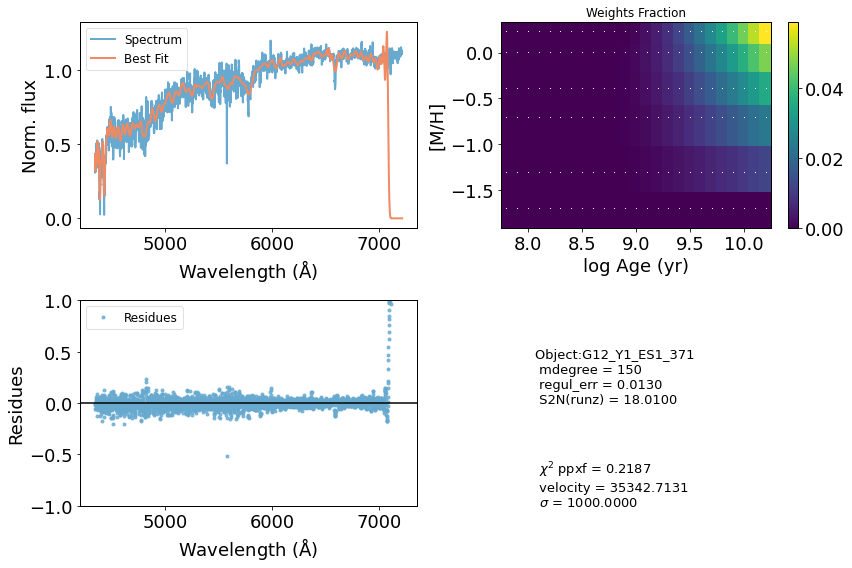

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60058      1000     0.048     0.117
 comp.  1:     59732        55
 comp.  2:     59824       334
Gas Reddening E(B-V): 6.676
chi2/DOF: 0.006561
method = capfit; Jac calls: 11; Func calls: 1764; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3613       1.3   59732    55
Comp:  2       Unknown      2.471       5.5   59824   334
Comp:  2       Unknown          0       8.2   59824   334
Comp:  2       Unknown      2.134       5.4   59824   334
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.23
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.23
M/L_r: 2.526
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 11.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


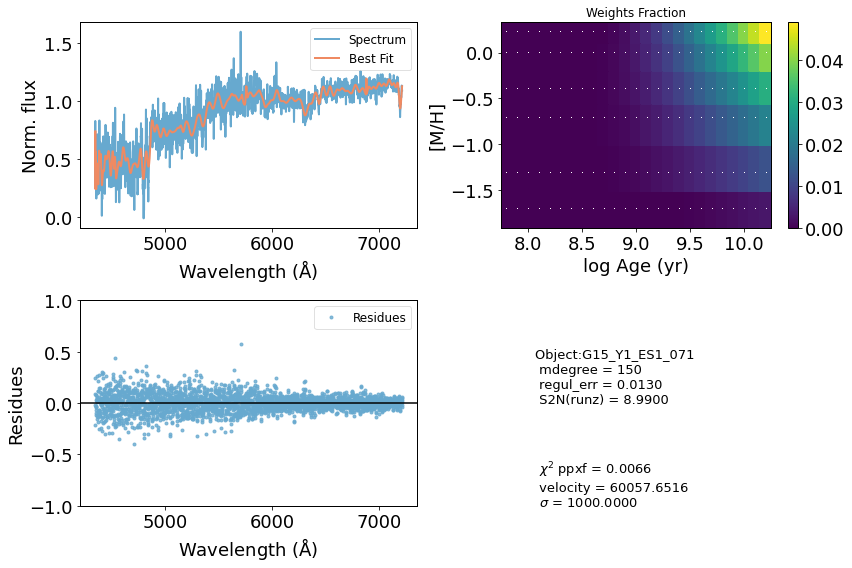

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32516      1000     0.128     0.300
 comp.  1:     30444       108
 comp.  2:     30773       166
Gas Reddening E(B-V): 1.296
chi2/DOF: 0.3491
method = capfit; Jac calls: 22; Func calls: 3524; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown   0.002602       2.1   30444   108
Comp:  2       Unknown          0       3.8   30773   166
Comp:  2       Unknown          0       2.9   30773   166
Comp:  2       Unknown     0.3554       2.5   30773   166
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.971
Current $\chi^2$: 0.3491
Elapsed time in PPXF: 21.91 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


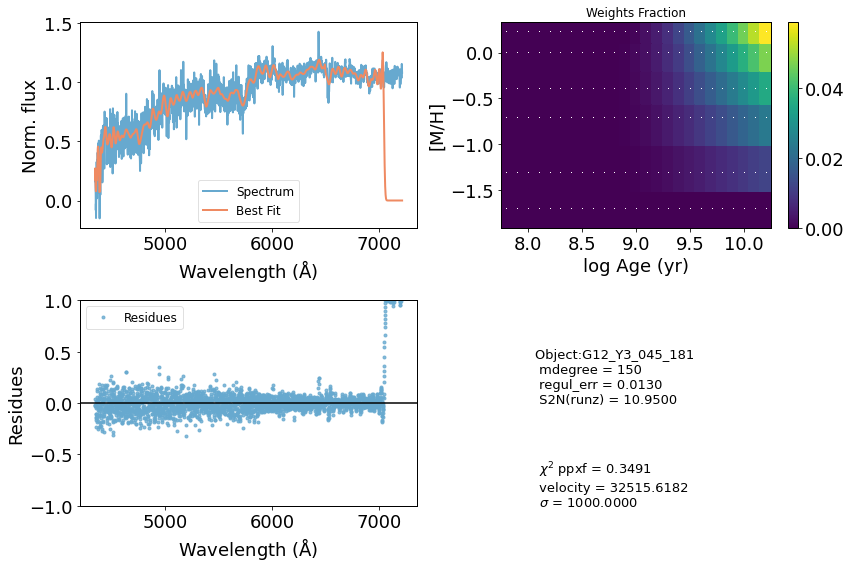

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64287      1000    -0.094     0.080
 comp.  1:     66327        75
 comp.  2:     66310       415
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02495
method = capfit; Jac calls: 95; Func calls: 15203; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.17       3.5   66327    75
Comp:  2       Unknown      3.517        16   66310   415
Comp:  2       Unknown          0        16   66310   415
Comp:  2       Unknown    0.01681       7.8   66310   415
---------------------------------------------------------
Weighted <logAge> [yr]: 9.33
Weighted <[M/H]>: -0.779
Weighted <logAge> [yr]: 9.33
Weighted <[M/H]>: -0.779
M/L_r: 0.4632
Current $\chi^2$: 0.0250
Elapsed time in PPXF: 97.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


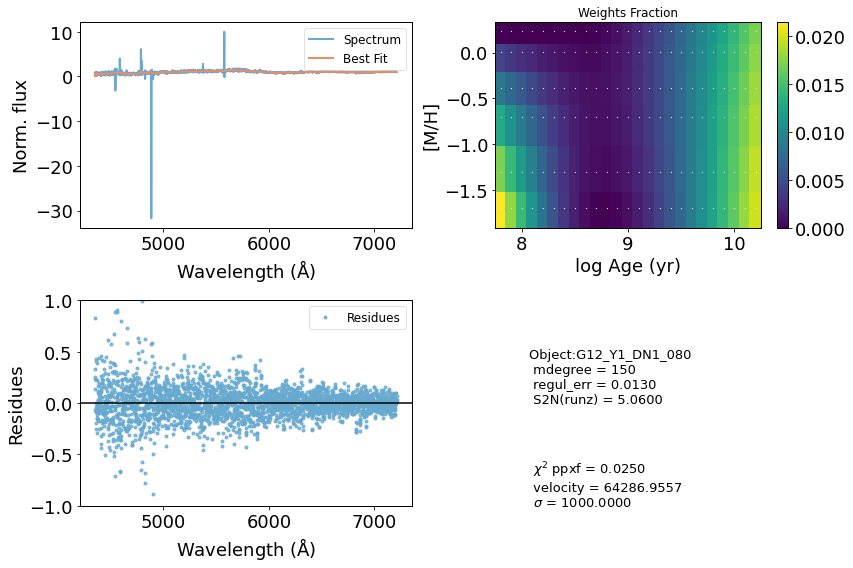

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50191      1000     0.300     0.300
 comp.  1:     48114       337
 comp.  2:     48300       249
Gas Reddening E(B-V): 9.767
chi2/DOF: 0.08607
method = capfit; Jac calls: 16; Func calls: 2563; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5921       2.7   48114   337
Comp:  2       Unknown      155.1   3.7e+02   48300   249
Comp:  2       Unknown      157.8   3.8e+02   48300   249
Comp:  2       Unknown          0         5   48300   249
Comp:  2       Unknown     0.5221       3.4   48300   249
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.062
Current $\chi^2$: 0.0861
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


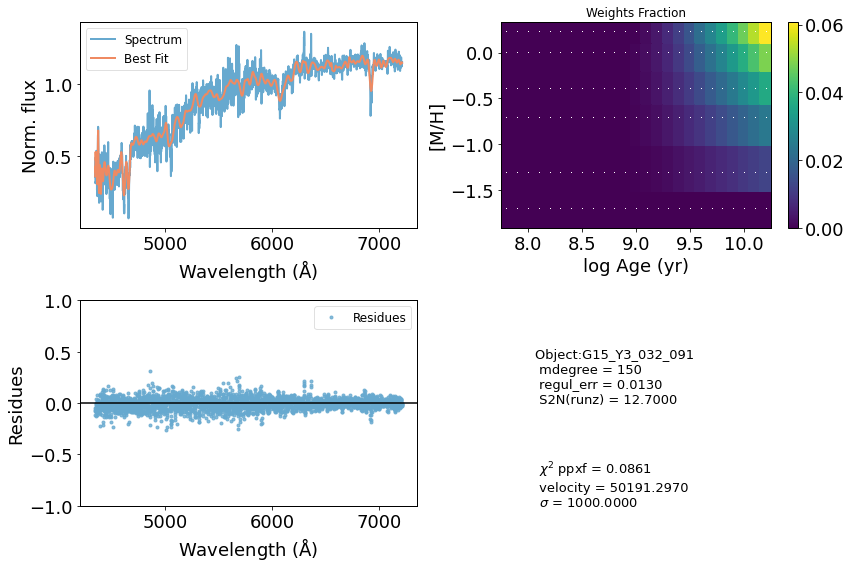

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74034      1000    -0.041     0.027
 comp.  1:     74420         1
 comp.  2:     74662       117
Gas Reddening E(B-V): 1.180
chi2/DOF: 0.0212
method = capfit; Jac calls: 11; Func calls: 1763; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.939       1.4   74420     1
Comp:  2       Unknown     0.3358       3.6   74662   117
Comp:  2       Unknown      1.811       3.7   74662   117
Comp:  2       Unknown          0       2.9   74662   117
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.527
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.527
M/L_r: 2.141
Current $\chi^2$: 0.0212
Elapsed time in PPXF: 11.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


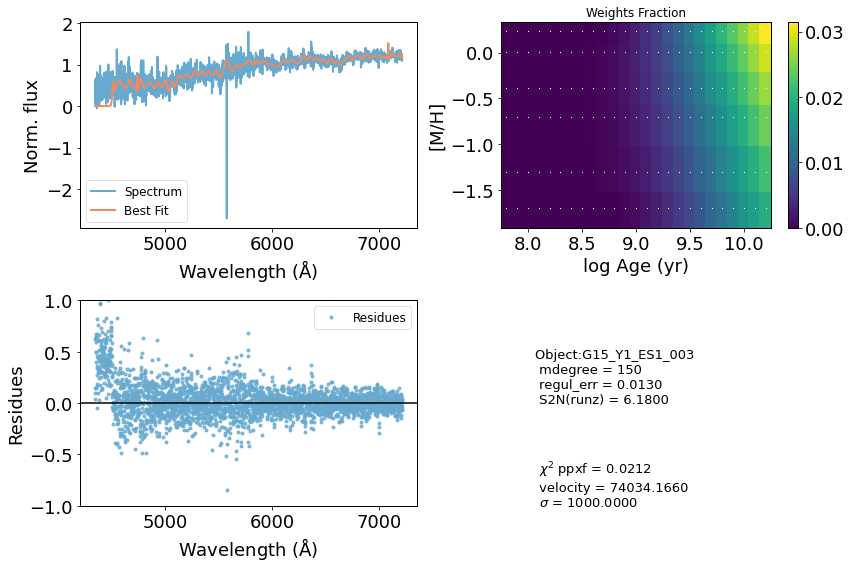

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34854       180     0.000     0.000
 comp.  1:     34854       180
 comp.  2:     34854       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3743
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  55 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.481       4.1   34854   180
Comp:  2       Unknown    0.05959       4.2   34854   180
Comp:  2       Unknown          0       3.2   34854   180
Comp:  2       Unknown     0.9915       2.5   34854   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.198
M/L_r: 3.391
Current $\chi^2$: 0.3743
Elapsed time in PPXF: 1.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


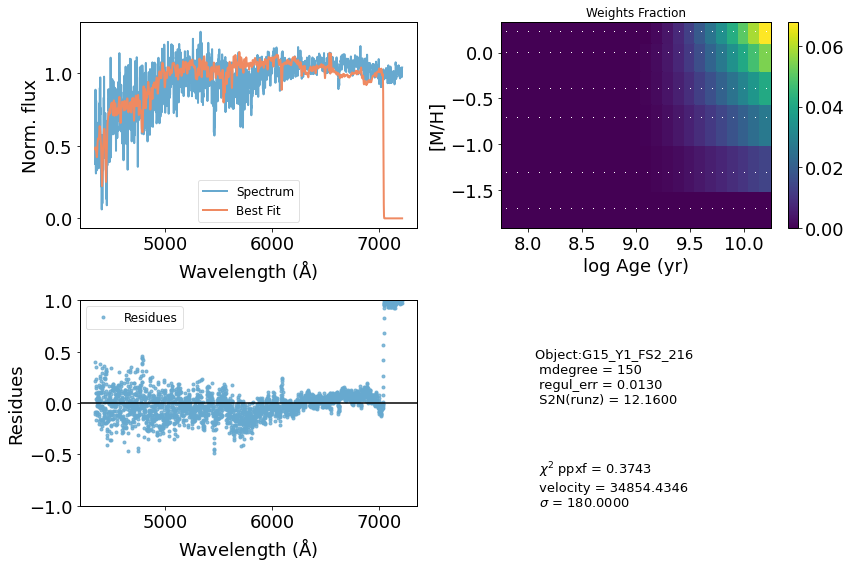

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62995       980    -0.035    -0.205
 comp.  1:     64420        32
 comp.  2:     64478       223
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005052
method = capfit; Jac calls: 17; Func calls: 2724; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  68 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2067       2.1   64420    32
Comp:  2       Unknown          0       8.9   64478   223
Comp:  2       Unknown          0       8.8   64478   223
Comp:  2       Unknown      3.386       5.3   64478   223
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.221
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.221
M/L_r: 2.614
Current $\chi^2$: 0.0051
Elapsed time in PPXF: 17.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


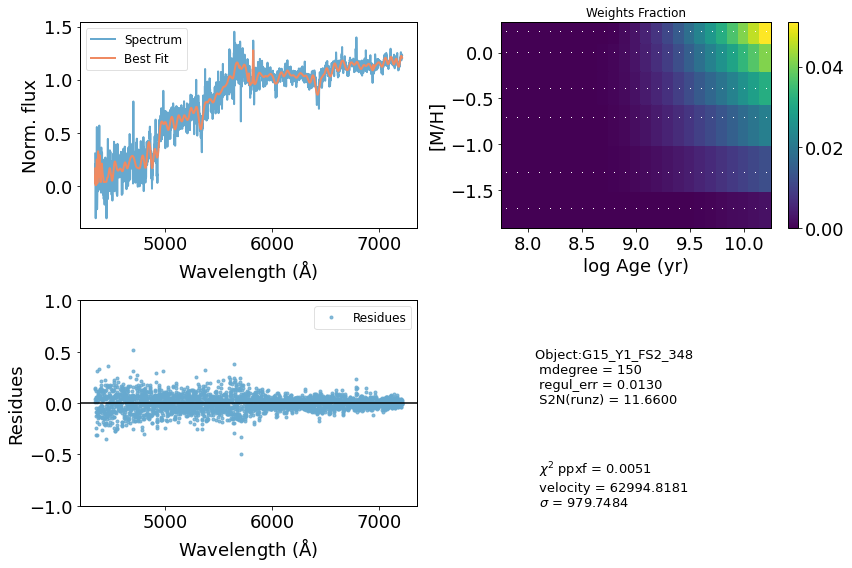

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29841       180     0.000     0.000
 comp.  1:     29841       180
 comp.  2:     29841       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4847
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.428       3.6   29841   180
Comp:  2       Unknown      0.241       4.1   29841   180
Comp:  2       Unknown      1.721       3.1   29841   180
Comp:  2       Unknown          0       2.2   29841   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.225
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.225
M/L_r: 3.073
Current $\chi^2$: 0.4847
Elapsed time in PPXF: 1.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


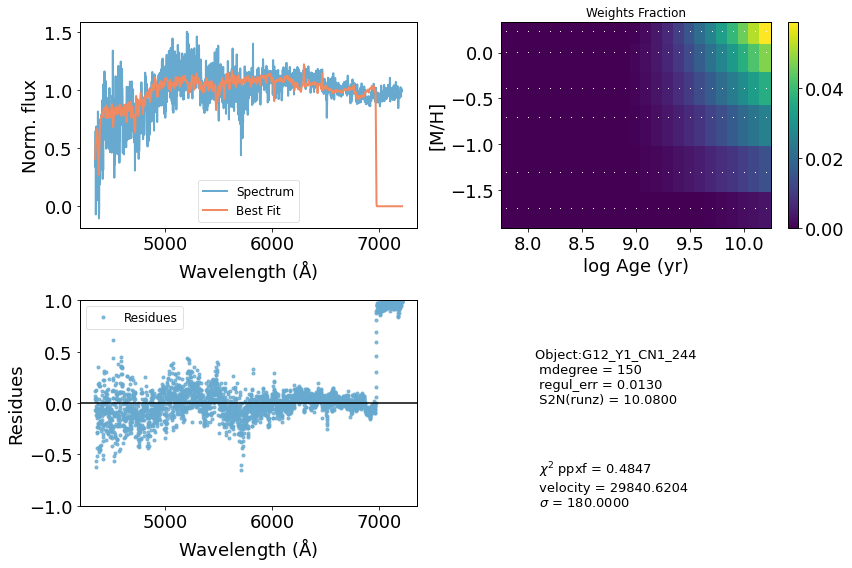

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72782       974    -0.042     0.042
 comp.  1:     72582        83
 comp.  2:     72642       210
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009802
method = capfit; Jac calls: 12; Func calls: 1923; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  80 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.594       3.3   72582    83
Comp:  2       Unknown      1.167       6.1   72642   210
Comp:  2       Unknown    0.05614       6.1   72642   210
Comp:  2       Unknown     0.8602       4.3   72642   210
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.253
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.253
M/L_r: 2.291
Current $\chi^2$: 0.0098
Elapsed time in PPXF: 12.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


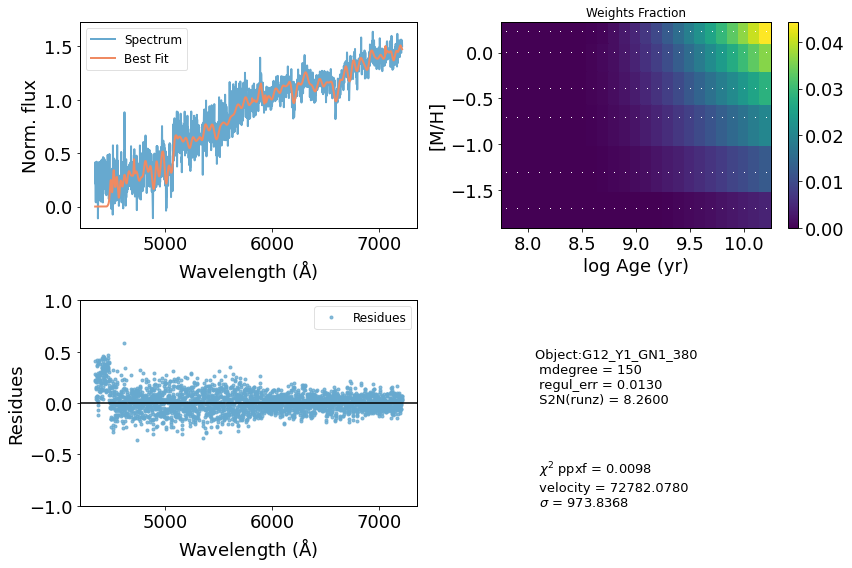

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43111      1000     0.300     0.300
 comp.  1:     41153       424
 comp.  2:     41052       130
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.211
method = capfit; Jac calls: 15; Func calls: 2406; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.8   41153   424
Comp:  2       Unknown     0.7998       3.4   41052   130
Comp:  2       Unknown      0.461       2.3   41052   130
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.014
Current $\chi^2$: 0.2110
Elapsed time in PPXF: 14.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


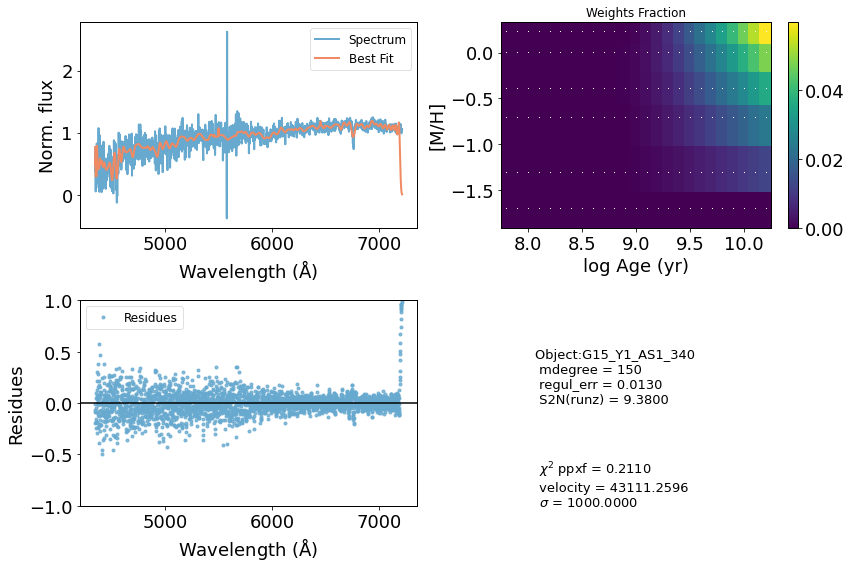

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64491      1000    -0.094     0.091
 comp.  1:     65687        53
 comp.  2:     65921       500
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006005
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  74 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2362         3   65687    53
Comp:  2       Unknown          0        18   65921   500
Comp:  2       Unknown     0.1635        18   65921   500
Comp:  2       Unknown      4.152       7.1   65921   500
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.267
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.267
M/L_r: 2.453
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 15.38 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


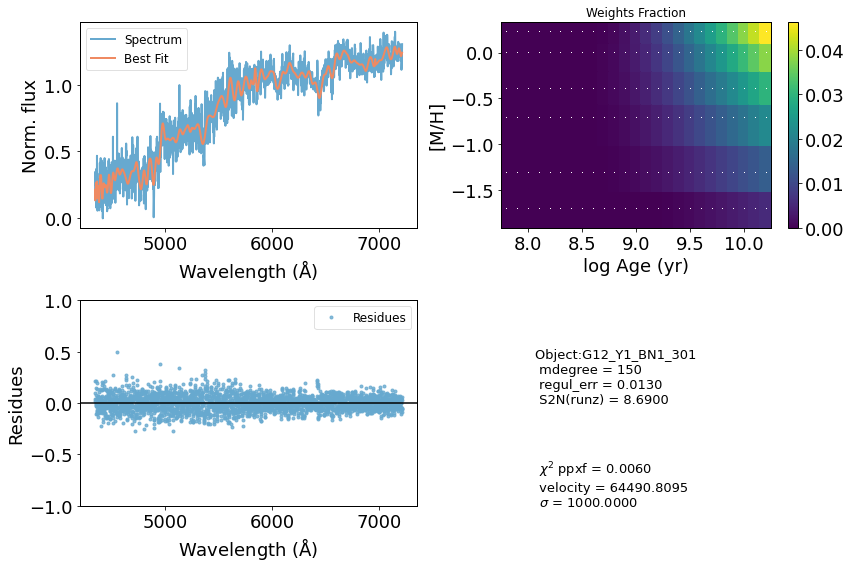

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46986      1000     0.136     0.233
 comp.  1:     45258        64
 comp.  2:     45599       362
Gas Reddening E(B-V): 2.353
chi2/DOF: 0.1286
method = capfit; Jac calls: 56; Func calls: 8967; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8524       1.6   45258    64
Comp:  2       Unknown          0         6   45599   362
Comp:  2       Unknown      2.828       4.2   45599   362
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.974
Current $\chi^2$: 0.1286
Elapsed time in PPXF: 57.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


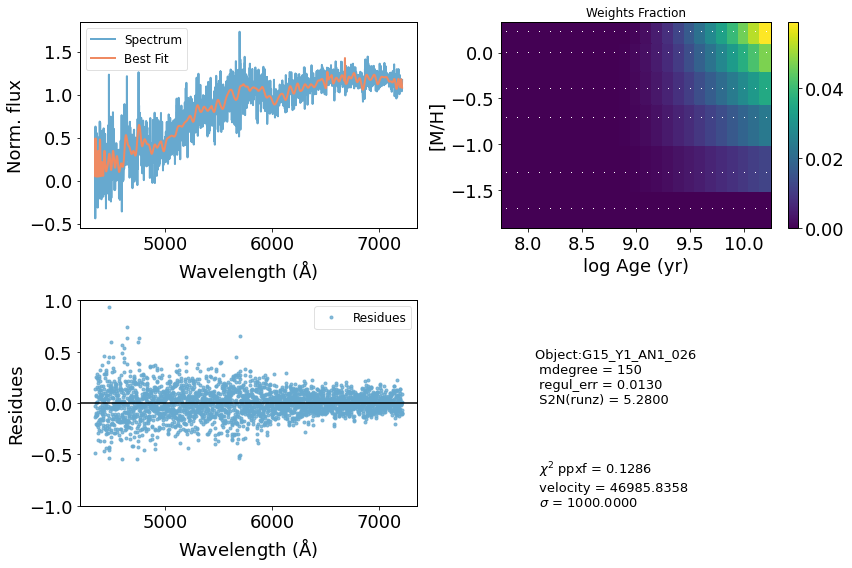

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49107      1000     0.300     0.300
 comp.  1:     46393       403
 comp.  2:     47383       312
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08198
method = capfit; Jac calls: 23; Func calls: 3684; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.135       6.3   46393   403
Comp:  2       Unknown          0        12   47383   312
Comp:  2       Unknown          0        12   47383   312
Comp:  2       Unknown     0.7566       5.7   47383   312
Comp:  2       Unknown          0       3.7   47383   312
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.982
Current $\chi^2$: 0.0820
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


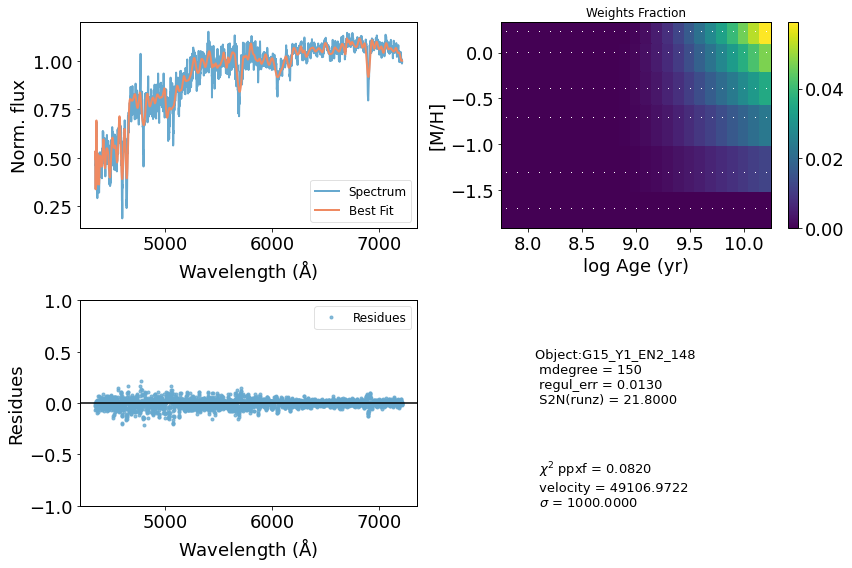

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36088       180     0.000     0.000
 comp.  1:     36088       180
 comp.  2:     36088       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3474
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.979       3.8   36088   180
Comp:  2       Unknown      1.646       4.1   36088   180
Comp:  2       Unknown     0.3179       2.7   36088   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.273
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.273
M/L_r: 3.124
Current $\chi^2$: 0.3474
Elapsed time in PPXF: 1.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


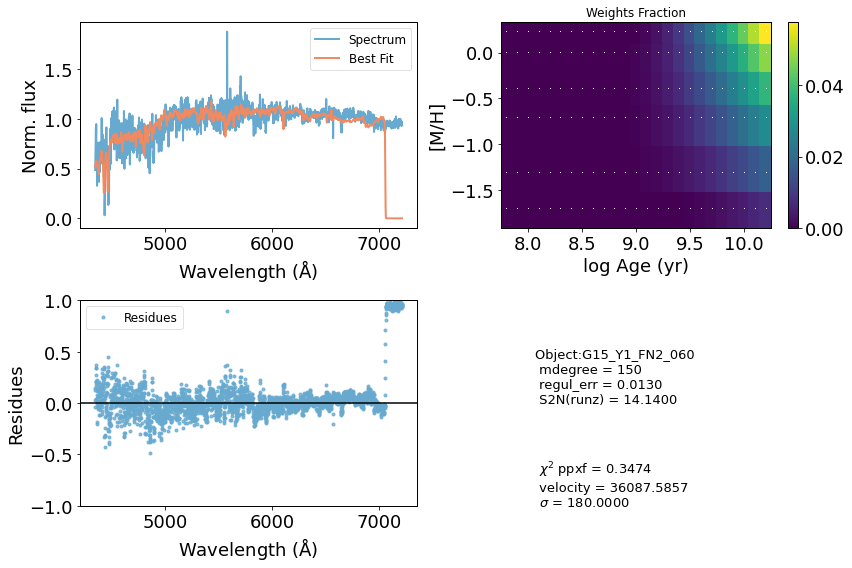

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36932       180     0.000     0.000
 comp.  1:     36932       180
 comp.  2:     36932       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2675
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.272         4   36932   180
Comp:  2       Unknown     0.9899       4.1   36932   180
Comp:  2       Unknown     0.3538       2.6   36932   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.206
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.206
M/L_r: 3.331
Current $\chi^2$: 0.2675
Elapsed time in PPXF: 1.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


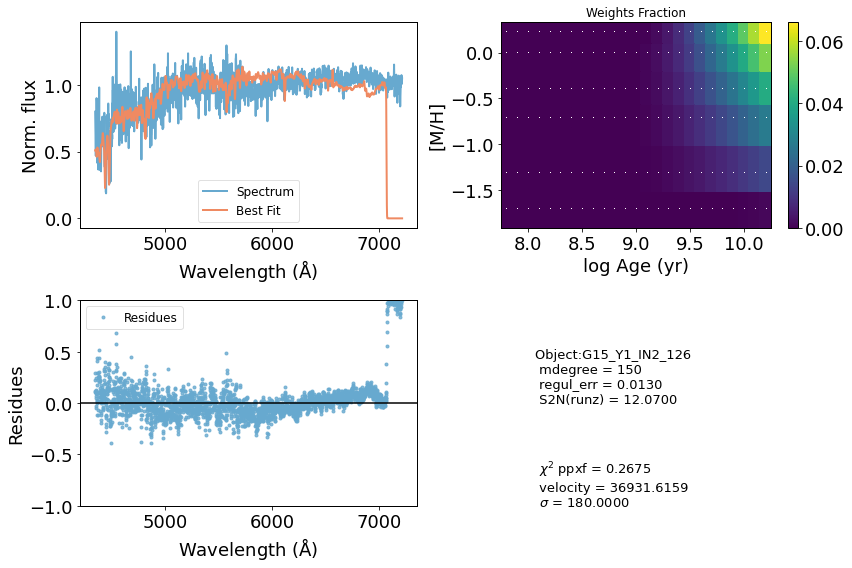

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44519      1000     0.300     0.300
 comp.  1:     43146       394
 comp.  2:     42841       314
Gas Reddening E(B-V): 8.070
chi2/DOF: 0.2226
method = capfit; Jac calls: 17; Func calls: 2723; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   43146   394
Comp:  2       Unknown      1.922       5.2   42841   314
Comp:  2       Unknown          0       3.5   42841   314
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.1
Current $\chi^2$: 0.2226
Elapsed time in PPXF: 16.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


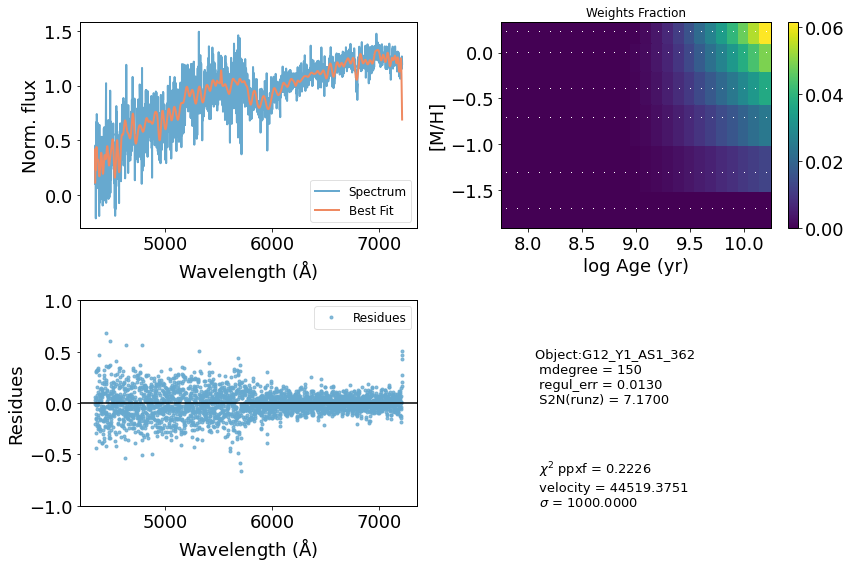

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38473       180     0.000     0.000
 comp.  1:     38473       180
 comp.  2:     38473       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3813
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.153       3.4   38473   180
Comp:  2       Unknown     0.9243       4.2   38473   180
Comp:  2       Unknown     0.7222       2.4   38473   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.2
M/L_r: 3.303
Current $\chi^2$: 0.3813
Elapsed time in PPXF: 1.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


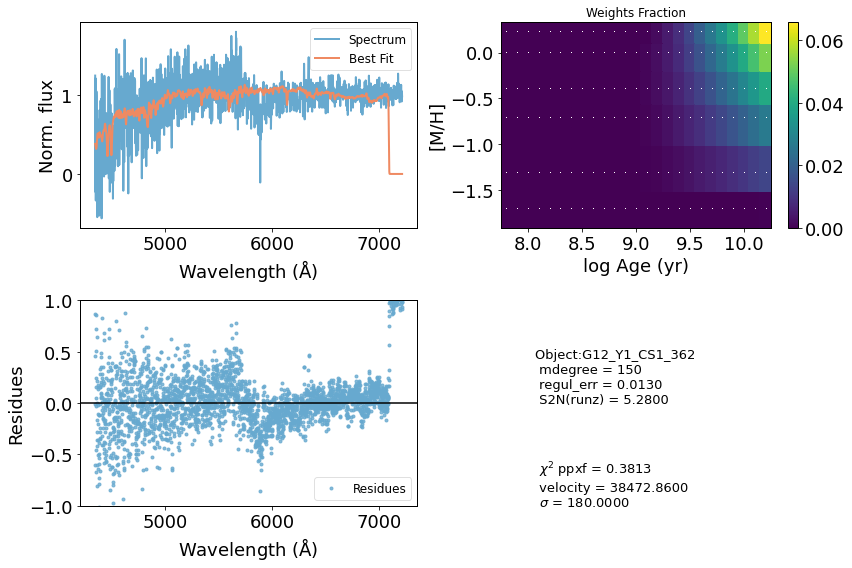

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35833      1000     0.252     0.300
 comp.  1:     34590       643
 comp.  2:     34146       119
Gas Reddening E(B-V): 6.582
chi2/DOF: 0.3638
method = capfit; Jac calls: 25; Func calls: 4003; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.563       4.6   34590   643
Comp:  2       Unknown     0.1935       3.2   34146   119
Comp:  2       Unknown      0.489       2.5   34146   119
Comp:  2       Unknown     0.1038       2.4   34146   119
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.047
Current $\chi^2$: 0.3638
Elapsed time in PPXF: 25.33 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


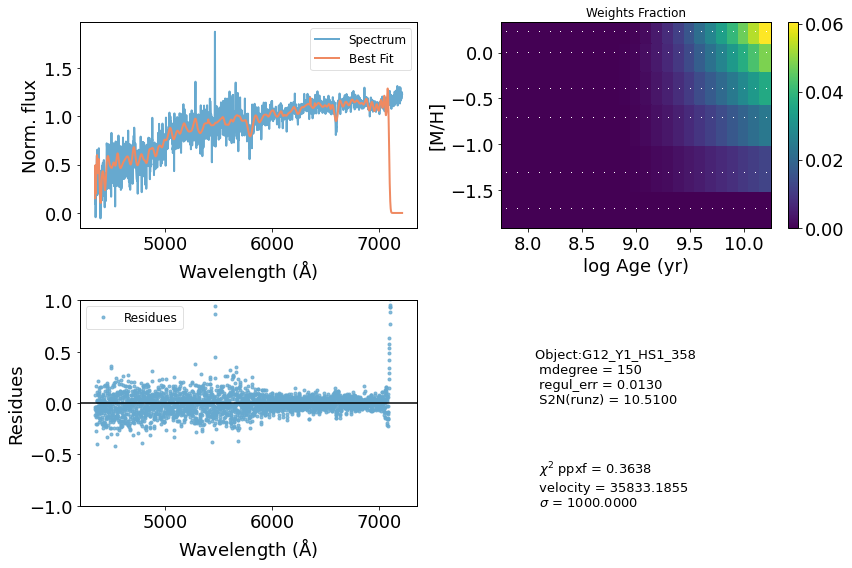

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48984      1000     0.300     0.300
 comp.  1:     47075       332
 comp.  2:     47418       106
Gas Reddening E(B-V): 1.414
chi2/DOF: 0.09594
method = capfit; Jac calls: 29; Func calls: 4645; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   47075   332
Comp:  2       Unknown     0.3606       6.5   47418   106
Comp:  2       Unknown     0.6264       6.3   47418   106
Comp:  2       Unknown     0.1656       3.6   47418   106
Comp:  2       Unknown          0       1.9   47418   106
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.033
Current $\chi^2$: 0.0959
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


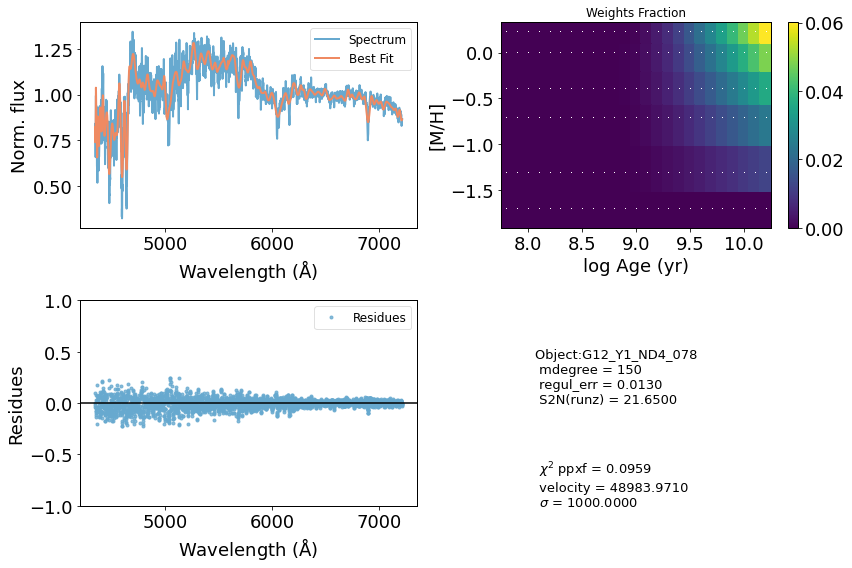

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59879      1000     0.007     0.035
 comp.  1:     58439        68
 comp.  2:     57380        44
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01496
method = capfit; Jac calls: 17; Func calls: 2726; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  76 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.5   58439    68
Comp:  2       Unknown       1.25       5.4   57380    44
Comp:  2       Unknown          0       5.3   57380    44
Comp:  2       Unknown     0.9136       3.7   57380    44
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.267
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.267
M/L_r: 2.502
Current $\chi^2$: 0.0150
Elapsed time in PPXF: 17.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


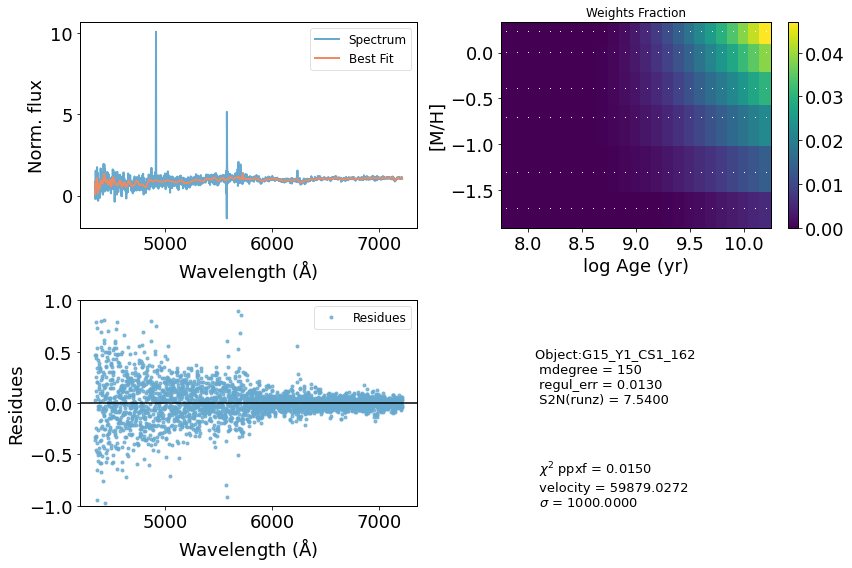

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42473      1000     0.300     0.300
 comp.  1:     40789       325
 comp.  2:     40585       147
Gas Reddening E(B-V): 4.113
chi2/DOF: 0.1733
method = capfit; Jac calls: 17; Func calls: 2727; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.6   40789   325
Comp:  2       Unknown          0       3.7   40585   147
Comp:  2       Unknown          0       2.4   40585   147
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.94
Current $\chi^2$: 0.1733
Elapsed time in PPXF: 16.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


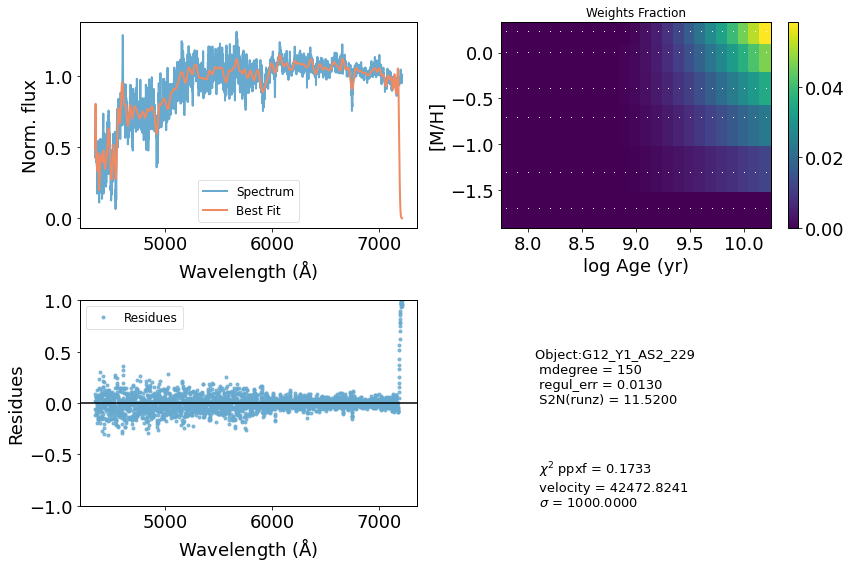

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69282      1000    -0.182     0.151
 comp.  1:     71715       607
 comp.  2:     71102         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005935
method = capfit; Jac calls: 77; Func calls: 12329; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  75 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.039       8.2   71715   607
Comp:  2       Unknown          0       2.3   71102     1
Comp:  2       Unknown     0.4195       2.4   71102     1
Comp:  2       Unknown          0       2.1   71102     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -1.04
M/L_r: 0.7122
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 78.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


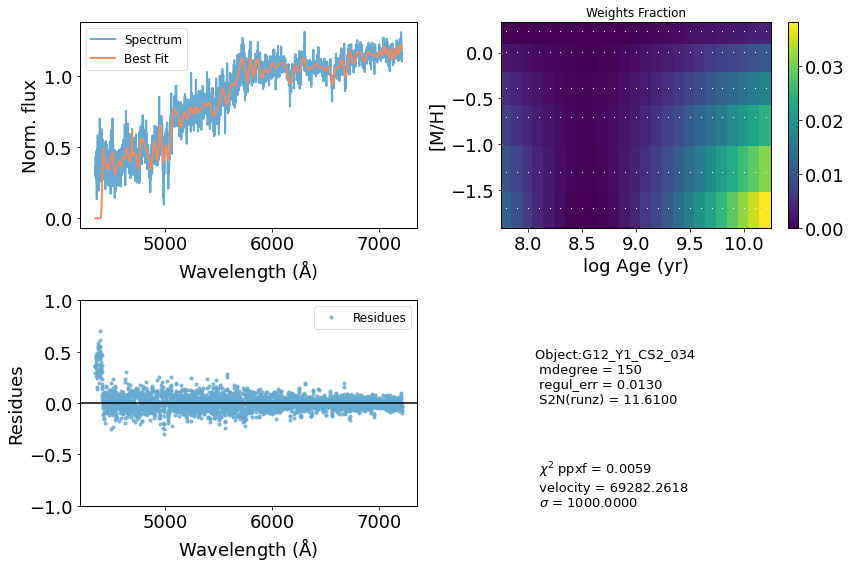

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40035      1000     0.300     0.300
 comp.  1:     37983       117
 comp.  2:     37795       277
Gas Reddening E(B-V): 3.618
chi2/DOF: 0.1638
method = capfit; Jac calls: 18; Func calls: 2888; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3722       2.1   37983   117
Comp:  2       Unknown      1.369       5.1   37795   277
Comp:  2       Unknown      1.104       3.6   37795   277
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.028
Current $\chi^2$: 0.1638
Elapsed time in PPXF: 17.53 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


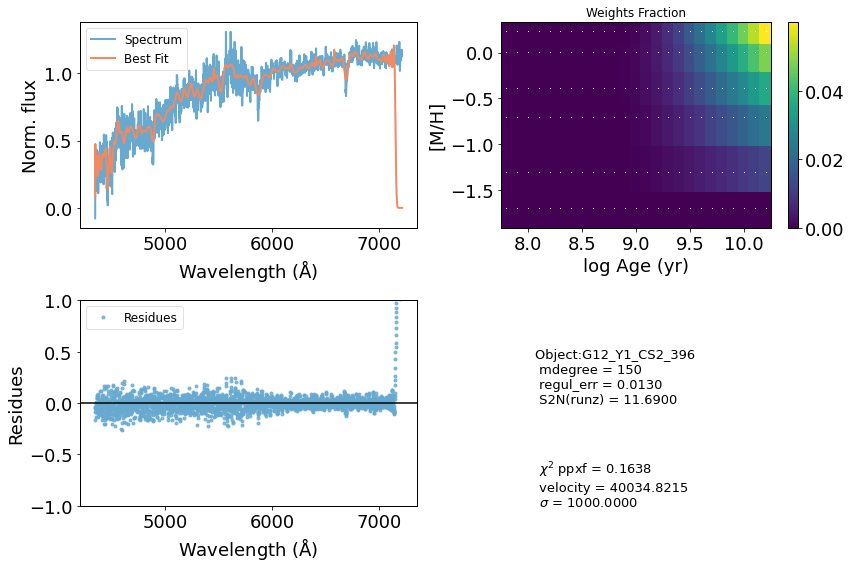

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50117      1000     0.300     0.300
 comp.  1:     47782        61
 comp.  2:     48309        71
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08023
method = capfit; Jac calls: 23; Func calls: 3687; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4859       2.6   47782    61
Comp:  2       Unknown       1.33       3.8   48309    71
Comp:  2       Unknown      2.544       3.9   48309    71
Comp:  2       Unknown          0       3.2   48309    71
Comp:  2       Unknown          0       1.9   48309    71
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.048
Current $\chi^2$: 0.0802
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


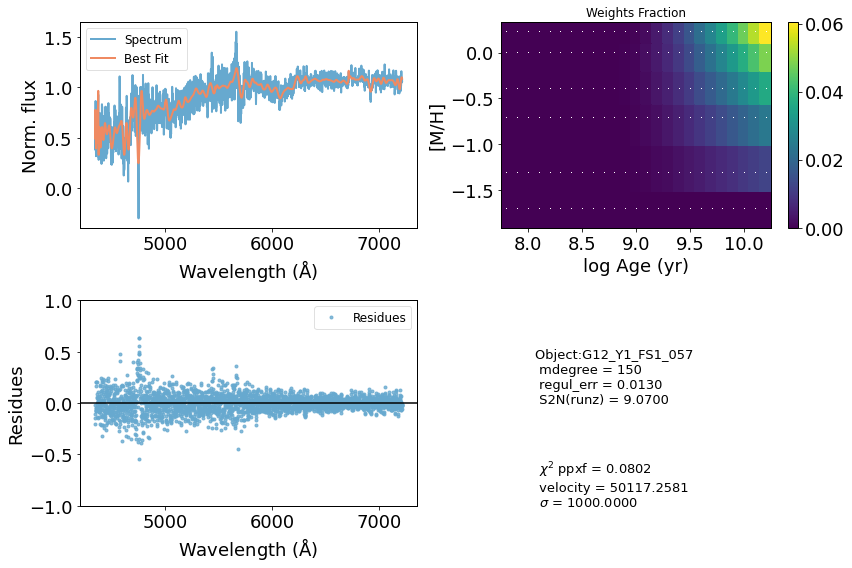

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36929      1000     0.244     0.300
 comp.  1:     35375        56
 comp.  2:     35075       102
Gas Reddening E(B-V): 2.634
chi2/DOF: 0.2586
method = capfit; Jac calls: 14; Func calls: 2247; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.07313       1.4   35375    56
Comp:  2       Unknown          0       3.2   35075   102
Comp:  2       Unknown    0.05464       2.2   35075   102
Comp:  2       Unknown          0       2.1   35075   102
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.953
Current $\chi^2$: 0.2586
Elapsed time in PPXF: 13.69 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


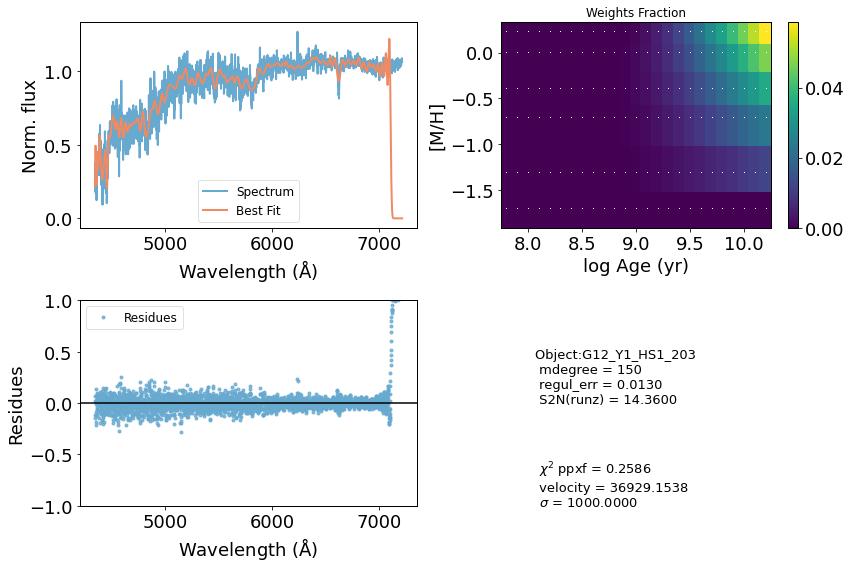

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53338      1000     0.300     0.300
 comp.  1:     50789       435
 comp.  2:     51564       123
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.06022
method = capfit; Jac calls: 19; Func calls: 3044; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.004       5.5   50789   435
Comp:  2       Unknown      1.312       5.8   51564   123
Comp:  2       Unknown      1.645       5.8   51564   123
Comp:  2       Unknown     0.4473       4.1   51564   123
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.077
Current $\chi^2$: 0.0602
Elapsed time in PPXF: 19.41 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


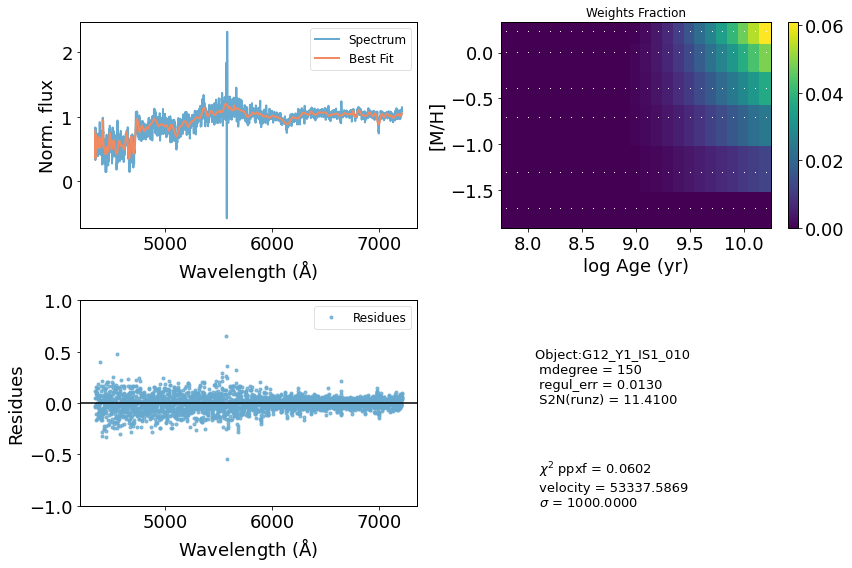

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40673      1000     0.300     0.300
 comp.  1:     38817       229
 comp.  2:     38728        36
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1315
method = capfit; Jac calls: 16; Func calls: 2568; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.3   38817   229
Comp:  2       Unknown          0       2.4   38728    36
Comp:  2       Unknown     0.4191       1.9   38728    36
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.982
Current $\chi^2$: 0.1315
Elapsed time in PPXF: 15.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


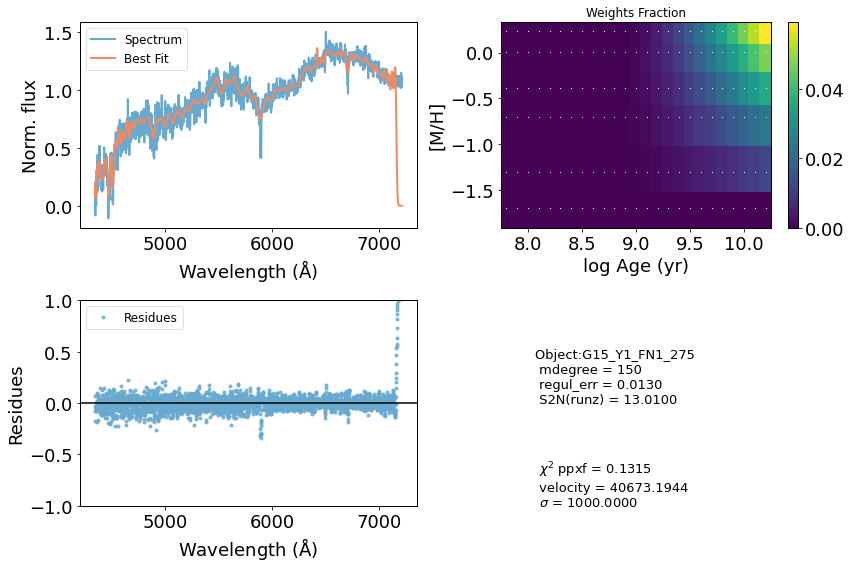

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76610      1000    -0.028     0.023
 comp.  1:     76922       408
 comp.  2:     77107       615
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008498
method = capfit; Jac calls: 13; Func calls: 2086; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  72 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.6   76922   408
Comp:  2       Unknown      5.471        29   77107   615
Comp:  2       Unknown      1.032        29   77107   615
Comp:  2       Unknown          0       6.5   77107   615
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.447
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.447
M/L_r: 2.256
Current $\chi^2$: 0.0085
Elapsed time in PPXF: 13.31 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


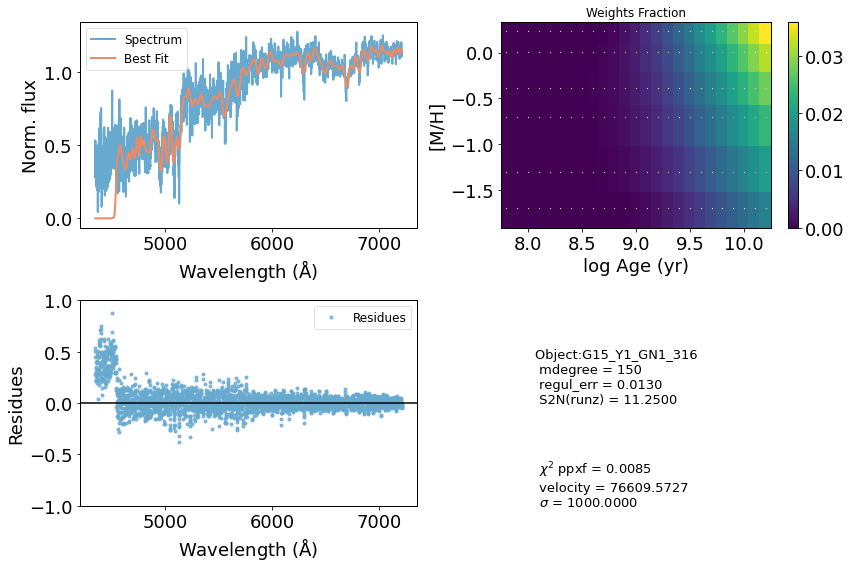

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52115       634     0.005     0.023
 comp.  1:     51594       448
 comp.  2:     51917       162
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08375
method = capfit; Jac calls: 16; Func calls: 2564; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       4.62       6.7   51594   448
Comp:  2       Unknown      1.104         6   51917   162
Comp:  2       Unknown      1.334       6.1   51917   162
Comp:  2       Unknown          0       4.3   51917   162
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.197
M/L_r: 2.828
Current $\chi^2$: 0.0838
Elapsed time in PPXF: 15.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


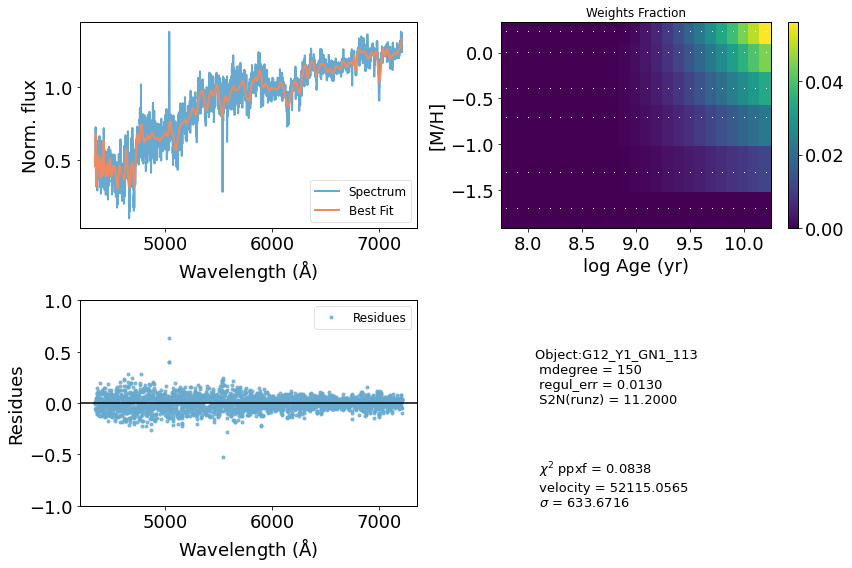

--------------------------------------------------


TypeError: 'decimals' is an invalid keyword argument for print()

In [20]:
start_time_all = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
# for each_sed in range(2):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
                   regul=1./regul_err, reg_dim=reg_dim, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening)
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
    
    ###################### SAVING DATAFRAME WITH FIT OUTPUTS ###################
    outputs_line = [cataid, sigma, sed_fit.chi2, velocity, mean_age, mean_metal, mass2light]
    if each_sed==0:
        outputs_physical = np.array(outputs_line)
    else:
        outputs_physical = np.vstack((outputs_physical, np.array(outputs_line)))
    #############################################################################
    
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin[:-200], sed_fit.galaxy[:-200], '-', color=palette[-1], linewidth=lw, 
             label="Spectrum")
    plt.plot(wavelength_rebin[:-200], sed_fit.bestfit[:-200], '-', color=palette[0], linewidth=lw, 
             label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Norm. flux")
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin[:-200], residues[:-200], '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Residues")
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n regul_err = {:.4f}\n S2N(runz) = {:.4f}".
             format(sed_header['SPECID'], mdegree, regul_err, sed_header['SN']), fontsize=13)
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 
    figname = 'gal_'+str(cataid)+'_d'+str(degree)+'_m'+str(mdegree)+'_'+str(wl_min)
    plt.tight_layout()
    plt.savefig(os.path.join(results_path, figname +'.png'))
    plt.savefig(os.path.join(results_path, figname +'.pdf'))
    plt.show()

outputs_physical = pd.DataFrame(outputs_physical)
outputs_physical.columns = outputs_physical_header

# sigma_data = np.column_stack([ids_vel, vel_disp])
# sigma_data = pd.DataFrame(sigma_data)
outputs_physical.to_csv('../../LargeFilesResults/PSM_analysis/'+ results_path +'parameters_d'+str(degree)+
                        '_m'+str(mdegree)+'.csv', index=False, header=True)
end_time_all = time.time()
print_time(start_time_all, end_time_all)

In [ ]:
plt.plot(wavelength_rebin[:-200], sed_fit.bestfit[:-200], '-', color=palette[0], linewidth=lw, label="Best Fit")